<a href="https://colab.research.google.com/github/JoDeMiro/Micado-Research/blob/main/ML_Auto_X26.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ML Auto X30.ipynb <- X29.ipynb-ből

<a name='top'></a>

## Gyors link
[log](#log) [car](#car) [run](#run) [zip](#zip)

[Setup](#setup_current_train)

[Experiments](#experiments)



In [1]:
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.cm as cm

from matplotlib.colors import Normalize
from matplotlib import cm

from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.neural_network import MLPRegressor
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import QuantileTransformer

from sklearn.metrics import r2_score, explained_variance_score, mean_squared_error, mean_absolute_error

import tensorflow as tf
from tensorflow.keras import layers, models, optimizers

import torch
import torch.nn as nn
import torch.optim as optim

import gc
import os
import copy
import glob
import time
import pickle
import random

from ipywidgets import interact, interactive, fixed, interact_manual, HBox, VBox, Layout
import ipywidgets as widgets
from IPython.display import display

from IPython.display import clear_output

from rich.progress import track

import warnings
warnings.filterwarnings('ignore')

2025-07-29 16:57:11.695687: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-07-29 16:57:12.300311: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


<a name="log"></a> [top](#top) log [plt](#plt) [str](#str) [road](#road) [car](#car) [run](#run) [dev](#dev) [zip](#zip) [tst](#tst)

In [2]:
class Printer():

    def __init__(self):
        self._nn = True   # Neural Network
        self._lr = False  # Linear Regression on Before After
        self._sr = False  # Sensor Data
        self._ba = False  # Before After Data
        self._nf = False  # Print Info
        self._db = False  # Print Debug
        self._er = True   # Print Error
        self._ut = True   # Print Util
        self._bs = True   # Print Basic
        self._in = True   # Print Investigation
        self._ac = False  # Print Action results
        self._dc = True   # Print Decision result

    def nn(self, text, value=""):
        if (self._nn == True):
            print(text, value)

    def lr(self, text, value=""):
        if (self._lr == True):
            print(text, value)

    def sr(self, text, value=""):
        if (self._sr == True):
            print(text, value)

    def ba(self, text, value=""):
        if (self._ba == True):
            print(text, value)

    def info(self, text, value=""):
        if (self._nf == True):
            print(text, value)

    def debug(self, text, value=""):
        if (self._db == True):
            print(text, value)

    def error(self, text, value=""):
        if (self._er == True):
            print(text, value)

    def util(self, text, value=""):
        if (self._ut == True):
            print(text, value)

    def basic(self, text, value=""):
        if (self._bs == True):
            print(text, value)

    def investigation(self, text, value=""):
        if (self._in == True):
            print(text, value)

    def action(self, text, value=""):
        if (self._ac == True):
            print(text, value)

    def decision(self, text, value=""):
        if (self._dc == True):
            print(text, value)

    def nn_(self, text):
        if (self._nn == True):
            print(text)

    def lr_(self, text):
        if (self._lr == True):
            print(text)

    def sr_(self, text):
        if (self._sr == True):
            print(text)

    def ba_(self, text):
        if (self._ba == True):
            print(text)

    def info_(self, text):
        if (self._nf == True):
            print(text)

    def debug_(self, text):
        if (self._db == True):
            print(text)

    def error_(self, text):
        if (self._er == True):
            print(text)

    def util_(self, text):
        if (self._ut == True):
            print(text)

    def basic_(self, text):
        if (self._bs == True):
            print(text)

    def investigation_(self, text):
        if (self._in == True):
            print(text)

    def action_(self, text):
        if (self._ac == True):
            print(text)

    def decision_(self, text):
        if (self._dc == True):
            print(text)

In [3]:
f = Printer()

print('> Debug')
print('> nn = {}'.format(f._nn))
print('> lr = {}'.format(f._lr))
print('> sr = {}'.format(f._sr))
print('> ba = {}'.format(f._ba))
print('> info = {}'.format(f._nf))
print('> debug = {}'.format(f._db))
print('> error = {}'.format(f._er))
print('> util = {}'.format(f._ut))
print('> investigation = {}'.format(f._in))
print('> action = {}'.format(f._ac))
print('> decision = {}'.format(f._dc))


f.info_('> valami = {}'.format(20))
f.info('> valami = ', 25)
f.debug('> valami = ', 30)
f.debug('> valami')
f.util('> util is enabled')
f.util('> util value = ', 20)
f.util('> util value = {}'.format(21))
f.investigation('> investigation value = ', 'investigation')
f.ba('> ba value = ', 'befoe after')
f.action('> action value = ', 'action value something')
f.action('> action value = {}'.format(20))
f.decision('> decision value = ', 'decision value something')
f.decision('> decision value = {}'.format(20))


f.info('> valami = {}'.format(200000))

> Debug
> nn = True
> lr = False
> sr = False
> ba = False
> info = False
> debug = False
> error = True
> util = True
> investigation = True
> action = False
> decision = True
> util is enabled 
> util value =  20
> util value = 21 
> investigation value =  investigation
> decision value =  decision value something
> decision value = 20 


<a name="road"></a>

# Road

[log](#log) rod [plt](#plt) [str](#str) [car](#car) [run](#run) [dev](#dev) [zip](#zip) [tst](#tst)

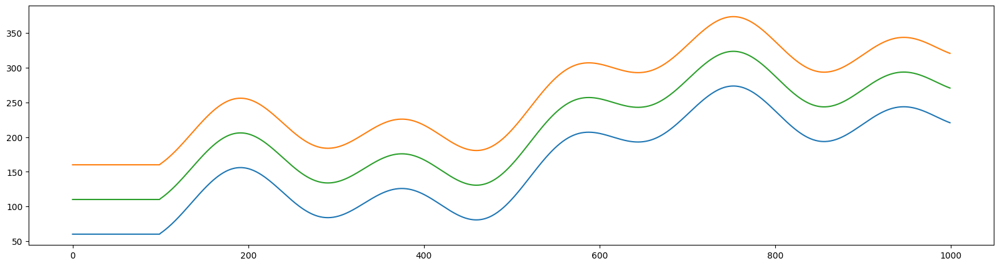

In [4]:
distance    = np.arange(0, 1000, 1)
road        = 100
wall_left   = 30*(np.sin(distance/180)) + distance * 0.3 + 30 * np.cos(distance/30) + 50 * np.sin(distance/90)
wall_left[0:100] = 60
wall_right  = wall_left + road
wall_center = ( wall_left + wall_right ) / 2


plt.figure(figsize=(20,5)); plt.plot(wall_left); plt.plot(wall_right); plt.plot(wall_center); plt.show()

In [5]:
def blublu(u = 100, v = 100, a=30, b=0.3, c=30, d=30, e=50, f=90):
    distance    = np.arange(0, 1000, 1)
    road        = 100
    wall_left   = 30*(np.sin(distance/180)) + distance * 0.3 + 30 * np.cos(distance/30) + 50 * np.sin(distance/90)
    # wall_left[0:100] = 60
    # wall_right  = wall_left + road
    distance += u
    wall_right  = a*(np.sin(distance/180)) + distance * b + c * np.cos(distance/d) + e * np.sin(distance/f)
    wall_right  += v
    wall_center = ( wall_left + wall_right ) / 2

    plt.figure(figsize=(20,5)); plt.plot(wall_left); plt.plot(wall_right); plt.plot(wall_center); plt.show()

In [6]:
_a = widgets.IntSlider(min=-10, max=50, step=1, value=41)
_b = widgets.FloatSlider(min=0.2, max=0.7, step=0.1, value=0.3)
_c = widgets.IntSlider(min=0, max=100, step=1, value=30)
_u = widgets.IntSlider(min=0, max=200, step=1, value=0)

In [7]:
# u = 50, c = 0, e = 116

In [ ]:
interact(blublu, u = _u, v = 124, a=_a, b=_b, c=_c);

In [9]:
def wizu(u = 100, v = 100, a=30, b=0.3, c=30, d=30, e=50, f=90, n=2):
    distance    = np.arange(0, 1000, 1)
    road        = 100
    wall_left   = 30*(np.sin(distance/180)) + distance * 0.3 + 30 * np.cos(distance/30) + 50 * np.sin(distance/90)
    # wall_left[0:100] = 60
    # wall_right  = wall_left + road
    distance += u
    wall_right  = a*(np.sin(distance/180)) + distance * b + c * np.cos(distance/d) + e * np.sin(distance/f)
    wall_right  += v
    wall_center = ( 1.3 * wall_left + 0.7 * wall_right ) / n

    plt.figure(figsize=(20,5)); plt.plot(wall_left); plt.plot(wall_right); plt.plot(wall_center); plt.show()

In [ ]:
interact(wizu, u = _u, v = 124, a=_a, b=_b, c=_c);

In [11]:
import numpy as np
import matplotlib.pyplot as plt

class Road2a():
    def __init__(self,
                 wide,
                 length,
                 a=180, a_min=30,
                 b=30, b_min=10,
                 c=90, c_min=20,
                 a1=10, b1=10, c1=20,
                 b2=0.3, s=60, p=100):

        self.wide = wide
        self.length = length
        self.distance = np.arange(0, self.length, 1)

        # Dinamikusan csökkenő hullámhossz-változók
        self.a_vec = a - (a - a_min) * (self.distance / self.length)
        self.b_vec = b - (b - b_min) * (self.distance / self.length)
        self.c_vec = c - (c - c_min) * (self.distance / self.length)

        # Hullámfüggvények – egyre sűrűbbek lesznek
        self.wall_right = (
            a1 * np.sin(self.distance / self.a_vec) +
            self.distance * b2 +
            b1 * np.cos(self.distance / self.b_vec) +
            c1 * np.sin(self.distance / self.c_vec) +
            p
        )

        # Az első 100 pont kisimítása
        self.wall_right[0:100] = self.wall_right[100]

        # Bal és közép vonalak kiszámítása
        self.wall_left = self.wall_right + self.wide
        self.wall_center = (self.wall_left + self.wall_right) / 2

        self.description()

    def show(self):
        _y_max = np.max(self.wall_left)
        fig, ax = plt.subplots(figsize=(26, 10))
        ax.set_ylim(40, _y_max)
        ax.plot(self.wall_left, label="Left")
        ax.plot(self.wall_right, label="Right")
        ax.plot(self.wall_center, label="Center", linestyle='--')
        ax.legend()
        return fig, ax

    def description(self):
        print('# --------------------- road Description ----------------------------')
        print('  \t\t road.length = ', self.length)
        print('  \t\t minimum slope (descending) = ',
              np.min(np.diff(self.wall_center, 1, -1, prepend=self.wall_center[0])))
        print('  \t\t maximum slope (ascending)  =  ',
              np.max(np.diff(self.wall_center, 1, -1, prepend=self.wall_center[0])))
        print('# -----------------------------------------------------------------')


In [12]:
class Road2():

    def __init__(self,
                 wide,
                 length, a = 180, b=30, c=90, a1=10, b1=10, c1=20, b2=0.3, s=60, p=100):

        self.wide = wide
        self.length = length  # 3000
        self.distance = np.arange(0, self.length, 1)

        # a = 180
        # b = 30
        # c = 90
        # a1 = 10
        # b1 = 10
        # c1 = 20
        # b2 = 0.3

        self.wall_right = a1 * (np.sin(
            self.distance / a)) + self.distance * b2 + b1 * np.cos(
                self.distance / b) + c1 * np.sin(self.distance / c) + p
        # self.wall_right[0:100] = s
        self.wall_right[0:100] = self.wall_right[100]
        
        self.wall_left = self.wall_right + self.wide
        self.wall_center = (self.wall_left + self.wall_right) / 2

        self.description()

    def show(self):
        # fig, ax = plt.subplots(figsize=(26,10)); ax.set_ylim(40, 1000); ax.plot(self.wall_left); ax.plot(self.wall_right); ax.plot(self.wall_center);
        _y_max = np.max(self.wall_left)
        fig, ax = plt.subplots(figsize=(26, 10))
        ax.set_ylim(40, _y_max)
        ax.plot(self.wall_left)
        ax.plot(self.wall_right)
        ax.plot(self.wall_center)
        return fig, ax

    def description(self):
        print(
            '# --------------------- road Description ----------------------------'
        )
        print('  \t\t road.length = ', self.length)
        print(
            '  \t\t minimum slope (descending) = ',
            np.min(
                np.diff(self.wall_center, 1, -1, prepend=self.wall_center[0])))
        print(
            '  \t\t maximum slope (ascending)  =  ',
            np.max(
                np.diff(self.wall_center, 1, -1, prepend=self.wall_center[0])))
        print(
            '# -----------------------------------------------------------------'
        )

In [13]:
class Road():
    'New'

    def __init__(self,
                 wide,
                 length,
                 road_type=1,
                 ramp_up_length=20,
                 ramp_down_length=20,
                 flat_top_length=40,
                 flat_bottom_length=40,
                 trapezoid_height=30):

        self.wide = wide
        self.length = length  # 3000
        self.distance = np.arange(0, self.length, 1)

        self.wall_right = 30 * (np.sin(
            self.distance / 180)) + self.distance * 0.3 + 30 * np.cos(
                self.distance / 30) + 50 * np.sin(self.distance / 90)
        self.wall_right[0:100] = 60
        self.wall_left = self.wall_right + self.wide
        self.wall_center = (self.wall_left + self.wall_right) / 2

        if (road_type == 22):
            self.wide = wide
            self.length = length  # 3000
            self.distance = np.arange(0, self.length, 1)
            
            a = 180
            b = 30
            c = 90
            
            a1 = 10
            b1 = 10
            c1 = 20

            self.wall_right = a1 * (np.sin(
                self.distance / a)) + self.distance * 0.3 + b1 * np.cos(
                    self.distance / b) + c1 * np.sin(self.distance / c)
            self.wall_right[0:100] = 60
            self.wall_left = self.wall_right + self.wide
            self.wall_center = (self.wall_left + self.wall_right) / 2

        elif (road_type == 20):
            a = 360
            b = 350
            c = 180
            a1 = 30
            b1 = 30
            c1 = 50
            self.wall_left = a1 * (np.sin(
                self.distance / a)) + self.distance * 0.3 + b1 * np.cos(
                    self.distance / b) + c1 * np.sin(self.distance / c)
            self.wall_right = self.wall_left + 100
            self.wall_center = (self.wall_left + self.wall_right) / 2

            # self.wall_left[0:100] = self.wall_left[101]
            # self.wall_center[0:100] = self.wall_center[101]
            # self.wall_right[0:100] = self.wall_right[101]

        elif (road_type == 21):
            v = 124
            u = 47
            a = 28
            b = 0.3
            c = 0
            d = 47
            e = 47
            f = 116
            self.wall_left = 30 * (np.sin(
                self.distance / 180)) + self.distance * 0.3 + 30 * np.cos(
                    self.distance / 30) + 50 * np.sin(self.distance / 90)
            # self.distance += u
            self.wall_right = a * (np.sin(
                self.distance / 180)) + self.distance * b + c * np.cos(
                    self.distance / d) + e * np.sin(self.distance / f)
            self.wall_right += v
            self.wall_center = (self.wall_left + self.wall_right) / 2

            # self.wall_left[0:100] = self.wall_left[101]
            # self.wall_center[0:100] = self.wall_center[101]
            # self.wall_right[0:100] = self.wall_right[101]

        elif (road_type == 2):
            v = 124
            u = 0
            a = 41
            b = 0.3
            c = 30
            d = 30
            e = 50
            f = 90
            self.wall_left = 30 * (np.sin(
                self.distance / 180)) + self.distance * 0.3 + 30 * np.cos(
                    self.distance / 30) + 50 * np.sin(self.distance / 90)
            self.distance += u
            self.wall_right = a * (np.sin(
                self.distance / 180)) + self.distance * b + c * np.cos(
                    self.distance / d) + e * np.sin(self.distance / f)
            self.wall_right += v
            self.wall_center = (1.3 * self.wall_left +
                                0.7 * self.wall_right) / 2
            self.wall_left[0:100] = self.wall_left[101]
            self.wall_center[0:100] = self.wall_center[101]
            self.wall_right[0:100] = self.wall_right[101]

        elif (road_type == 3):
            v = 124
            u = 0
            a = 41
            b = 0.3
            c = 30
            d = 46
            e = 50
            f = 90
            self.wall_left = 30 * (np.sin(
                self.distance / 180)) + self.distance * 0.3 + 30 * np.cos(
                    self.distance / 30) + 50 * np.sin(self.distance / 90)
            self.distance += u
            self.wall_right = a * (np.sin(
                self.distance / 180)) + self.distance * b + c * np.cos(
                    self.distance / d) + e * np.sin(self.distance / f)
            self.wall_right += v
            self.wall_center = (self.wall_left + self.wall_right) / 2
            self.wall_left[0:100] = self.wall_left[101]
            self.wall_center[0:100] = self.wall_center[101]
            self.wall_right[0:100] = self.wall_right[101]

        elif (road_type == 4):  # wizu
            v = 124
            u = 0
            a = 41
            b = 0.3
            c = 30
            d = 30
            e = 50
            f = 90
            n = 2
            self.wall_left = 30 * (np.sin(
                self.distance / 180)) + self.distance * 0.3 + 30 * np.cos(
                    self.distance / 30) + 50 * np.sin(self.distance / 90)
            # wall_left[0:100] = 60
            self.distance += u
            self.wall_right = a * (np.sin(
                self.distance / 180)) + self.distance * b + c * np.cos(
                    self.distance / d) + e * np.sin(self.distance / f)
            self.wall_right += v
            self.wall_center = (1.3 * self.wall_left +
                                0.7 * self.wall_right) / n
            self.wall_left[0:100] = self.wall_left[101]
            self.wall_center[0:100] = self.wall_center[101]
            self.wall_right[0:100] = self.wall_right[101]

        elif (road_type == 5):
            print('Trapi')
            self.ramp_up_length = ramp_up_length
            self.ramp_down_length = ramp_down_length
            self.flat_top_length = flat_top_length
            self.flat_bottom_length = flat_bottom_length
            self.trapezoid_height = trapezoid_height

            one_trapezoid_length = flat_bottom_length + ramp_up_length + flat_top_length + ramp_down_length
            num_trapezoids = self.length // one_trapezoid_length

            wall_right = []
            current_y = 60  # kezdő magasság
            direction = 1  # 1: felfelé, -1: lefelé

            for _ in range(num_trapezoids):
                # alsó szakasz
                wall_right += [current_y] * flat_bottom_length

                # emelkedő
                for i in range(ramp_up_length):
                    wall_right.append(current_y +
                                      direction * trapezoid_height *
                                      (i + 1) / ramp_up_length)

                current_y += direction * trapezoid_height

                # felső szakasz
                wall_right += [current_y] * flat_top_length

                # lejtő
                for i in range(ramp_down_length):
                    wall_right.append(current_y -
                                      direction * trapezoid_height *
                                      (i + 1) / ramp_down_length)

                current_y -= direction * trapezoid_height

            # ha túl rövid lett, egészítsük ki az utolsó értékkel
            if len(wall_right) < self.length:
                wall_right += [wall_right[-1]
                               ] * (self.length - len(wall_right))
            self.wall_right = np.array(wall_right)

            self.wall_left = self.wall_right + self.wide
            self.wall_center = (self.wall_left + self.wall_right) / 2

        else:
            print('MÁS')
            # más típusú pályák korábbi logikája
            self.wall_right = 30 * (np.sin(
                self.distance / 180)) + self.distance * 0.3 + 30 * np.cos(
                    self.distance / 30) + 50 * np.sin(self.distance / 90)
            self.wall_right[0:100] = 60
            self.wall_left = self.wall_right + self.wide
            self.wall_center = (self.wall_left + self.wall_right) / 2

        self.description()

    def show(self):
        # fig, ax = plt.subplots(figsize=(26,10)); ax.set_ylim(40, 1000); ax.plot(self.wall_left); ax.plot(self.wall_right); ax.plot(self.wall_center);
        _y_max = np.max(self.wall_left)
        fig, ax = plt.subplots(figsize=(26, 10))
        ax.set_ylim(40, _y_max)
        ax.plot(self.wall_left)
        ax.plot(self.wall_right)
        ax.plot(self.wall_center)
        return fig, ax

    def description(self):
        print(
            '# --------------------- road Description ----------------------------'
        )
        print('  \t\t road.length = ', self.length)
        print(
            '  \t\t minimum slope (descending) = ',
            np.min(
                np.diff(self.wall_center, 1, -1, prepend=self.wall_center[0])))
        print(
            '  \t\t maximum slope (ascending)  =  ',
            np.max(
                np.diff(self.wall_center, 1, -1, prepend=self.wall_center[0])))
        print(
            '# -----------------------------------------------------------------'
        )

In [14]:
class Road20():

    def __init__(self, wide, length):
        
        self.wide = wide
        self.length = length # 3000
        self.distance = np.arange(0, self.length, 1)

        self.wall_right = 30 * (np.sin(
            self.distance / 180)) + self.distance * 0.3 + 30 * np.cos(
                self.distance / 30) + 50 * np.sin(self.distance / 90)
        self.wall_right[0:100] = 60
        self.wall_left = self.wall_right + self.wide
        self.wall_center = (self.wall_left + self.wall_right) / 2

        print('A kurva anyádat')
        v = 124
        u = 47
        a = 28
        b = 0.3
        c = 0
        d = 18
        e = 47
        f = 116
        self.wall_left = 30*(np.sin(self.distance/180)) + self.distance * 0.3 + 30 * np.cos(self.distance/30) + 50 * np.sin(self.distance/90)
        # self.distance += u
        self.wall_right = a * (np.sin(self.distance / 180)) + self.distance * b + c * np.cos(self.distance / d) + e * np.sin(self.distance / f)
        self.wall_right += v
        self.wall_center = (self.wall_left + self.wall_right) / 2

        # self.wall_left[0:100] = self.wall_left[101]
        # self.wall_center[0:100] = self.wall_center[101]
        # self.wall_right[0:100] = self.wall_right[101]
        print('Bazmeg')

        self.description()

    def show(self):
        # fig, ax = plt.subplots(figsize=(26,10)); ax.set_ylim(40, 1000); ax.plot(self.wall_left); ax.plot(self.wall_right); ax.plot(self.wall_center);
        _y_max = np.max(self.wall_left)
        fig, ax = plt.subplots(figsize=(26, 10))
        ax.set_ylim(40, _y_max)
        ax.plot(self.wall_left)
        ax.plot(self.wall_right)
        ax.plot(self.wall_center)
        return fig, ax

    def description(self):
        print(
            '# --------------------- road Description ----------------------------')
        print('  \t\t road.length = ', self.length)
        print('  \t\t minimum slope (descending) = ',
            np.min(np.diff(self.wall_center, 1, -1, prepend=self.wall_center[0])))
        print('  \t\t maximum slope (ascending)  =  ',
            np.max(np.diff(self.wall_center, 1, -1, prepend=self.wall_center[0])))
        print('# -----------------------------------------------------------------')

<a name="plt"></a>

# Plotter

[top](#top) [log](#log) [rod](#road) plt [str](#str) [car](#car) [run](#run) [dev](#dev) [zip](#zip) [tst](#tst)

In [15]:
class PostPlotter():

    def __init__(self, car):
        self.car = car

    def plot_history(self, flag, show_y_distance=False):
        self.car.platter.plot_history(self.car, flag, show_y_distance=show_y_distance)
        
    def plot_y_distance(self):
        plt.plot(self.car.y_distance)
        plt.axhline(0, color='black', lw=1.0, ls='--')
        plt.show()

    def plot_mlp(self):

        num_input_varialbe = ['sensor_left', 'sensor_center', 'sensor_right']

        # Define the structure of the network
        network_structure = np.hstack(
            ([len(num_input_varialbe)],
             np.asarray(self.car.mlp.hidden_layer_sizes), [1]))

        print(network_structure)

        # Draw the Neural Network with weights
        network = DrawNN(network_structure, self.car.mlp.coefs_,
                         num_input_varialbe)
        network.draw()

    def plot_y_move_v2(self, car, x, flag, height=6):

        if (flag != 0):

            fileName = 'PostPlotter_y_move_v2'
            fig = plt.figure(figsize=(26, height))
            # fig.subplots_adjust(left=0.33)
            ax = fig.add_subplot()
            y_move = np.zeros((car.road.length))
            y_move[0:len(car.y_history)] = np.diff(np.array(car.y_history),
                                                   1,
                                                   -1,
                                                   prepend=0)
            y_move[0] = 0
            y_tick_labels = [-8, -6, -4, -2, '-0.00', 2, 4, 6]
            ax.set_yticklabels(y_tick_labels)
            ax.plot(y_move)
            ax.hlines(0, 0, 100)
            ax.set_title('#i = ' + str(x))
            # ax.set_title('#i = ' + str(x), fontsize=18, fontweight='bold');
            if (flag == 1 or flag == 3): plt.show()
            if (flag == 2 or flag == 3):
                fig.savefig(fileName + '_{0:04}'.format(x) + '.png',
                            bbox_inches='tight')
                plt.close('all')
                fig.clf()
                ax.cla()
                plt.close('all')

    def plot_sensors_distibution(self, bins=30):

        left = np.array(self.car.sensor_left)
        center = np.array(self.car.sensor_center)
        right = np.array(self.car.sensor_right)

        latextext1 = '\n'.join((r'$\sigma_{left}  =%.4f$' % (np.std(left)),
                                r'$\sigma_{center}=%.4f$' % (np.std(center)),
                                r'$\sigma_{right} =%.4f$' % (np.std(right))))

        latextext2 = '\n'.join(
            (r'$\overline{x}_{left}=%.4f$' % (np.mean(left)),
             r'$\overline{x}_{center}=%.4f$' % (np.mean(center)),
             r'$\overline{x}_{right}=%.4f$' % (np.mean(right))))

        fig, axes = plt.subplots(1, 2, figsize=(10, 5))

        # print(plt.rcParams['axes.prop_cycle'].by_key()['color'])

        # ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']

        ax = axes[0]
        ax.hist(left,
                bins=bins,
                density=True,
                histtype='step',
                label='left',
                color='#1f77b4')
        ax.hist(center,
                bins=bins,
                density=True,
                histtype='step',
                label='center',
                color='#2ca02c')
        ax.hist(right,
                bins=bins,
                density=True,
                histtype='step',
                label='right',
                color='#ff7f0e')
        ax.legend(loc='upper right')
        ax.text(0.05,
                0.81,
                latextext1,
                transform=ax.transAxes,
                bbox=dict(facecolor='white', edgecolor='black'))
        ax.set_ylabel('Density')

        ax = axes[1]
        ax.hist(left,
                bins=bins,
                density=True,
                histtype='step',
                label='left',
                color='#1f77b4')
        ax.hist(right,
                bins=bins,
                density=True,
                histtype='step',
                label='right',
                color='#ff7f0e')
        ax.legend(loc='upper right')
        ax.text(0.05,
                0.81,
                latextext2,
                transform=ax.transAxes,
                bbox=dict(facecolor='white', edgecolor='black'))
        # ax.set_ylabel('Density')

        fig.suptitle('Distribution of the values of the sensors')
        fig.text(0.5, -0.0, '$\max_{x \in [a,b]}f(x)$', ha='center')
        plt.show()

    def plot_y_distance_distibution(self, bins=30):

        y_distance = np.array(self.car.y_distance)

        latextext1 = '\n'.join((r'$\sigma_{y_distance}  =%.4f$' % (np.std(y_distance))))
        latextext2 = '\n'.join((r'$\overline{x}_{y_distance}  =%.4f$' % (np.mean(y_distance))))

        fig, axes = plt.subplots(1, 2, figsize=(10, 5))

        # print(plt.rcParams['axes.prop_cycle'].by_key()['color'])

        # ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']

        ax = axes[0]
        ax.hist(y_distance,
                bins=bins,
                density=True,
                histtype='step',
                label='y_distance',
                color='#1f77b4')
        ax.legend(loc='upper right')
        ax.set_ylabel('Density')
        ax.axvline(0, color='black', lw=1.0, ls='--')

        ax = axes[1]
        ax.hist(y_distance,
                bins=bins,
                density=False,
                histtype='step',
                label='y_distance',
                color='#1f77b4')
        ax.legend(loc='upper right')
        fig.suptitle('Distribution of the values of the sensors')
        plt.show()

    def plot_mlp_surface_prediction_v2(self, resolution=10):
        # fogja meg az auto left és rigth sensor értékeit
        # vegye a minimumot és a maximumát külön külön
        # csináljon rajtuk egy np.linspace-t
        sl = np.array(self.car.sensor_left)
        sl_min = sl.min()
        sl_max = sl.max()
        print('sl.shape = ', sl.shape)
        print('sl.min() = ', sl_min)
        print('sl.max() = ', sl_max)
        sr = np.array(self.car.sensor_right)
        sr_min = sr.min()
        sr_max = sr.max()
        print('sr.shape = ', sr.shape)
        print('sr.min() = ', sr_min)
        print('sr.max() = ', sr_max)
        sc = np.array(self.car.sensor_center)
        sc_min = sc.min()
        sc_max = sc.max()
        print('sc.shape = ', sc.shape)
        print('sc.min() = ', sc_min)
        print('sc.max() = ', sc_max)

        sensor_center = 100
        _sl = np.linspace(sl_min, sl_max, num=resolution)
        _sr = np.linspace(sr_min, sr_max, num=resolution)
        _sc = np.linspace(sensor_center, sensor_center, num=resolution)

        # kell csinálni egy mesh gridet a plothoz
        _left, _right = np.meshgrid(_sl, _sr)

        print('_left.shape   = ', _left.shape)
        print('_right.shapes = ', _right.shape)

        # a bemeneti vectorhoz -> itt mátrixhoz -> kell csinálnom néhány átalakítást

        _left_input = _left.flatten()
        _right_input = _right.flatten()
        _center_input = np.full((resolution, resolution),
                                sensor_center).flatten()

        # create an input vector
        _X_input = np.array([_left_input, _center_input, _right_input]).T

        # normlaize it
        _X_input_scaled = self.car.x_minmaxscaler.transform(_X_input)

        # predict
        _Y_output_predicted = self.car.mlp.predict(_X_input_scaled)

        # transform
        _Y_predicted_inverse = self.car.y_minmaxscaler.inverse_transform(
            _Y_output_predicted.reshape(1, -1))

        # vissza kell alakítanom mátrix formába
        _Y_predicted = _Y_predicted_inverse.reshape(resolution, resolution)

        plt.contourf(_left, _right, _Y_predicted, levels=30)
        plt.colorbar(label='level')
        plt.show()

    # valamiért ez a kettő
    # ha kicsit is de eltérő eredményt ad
    def plot_mlp_surface_prediction_v1(self, resolution=10):
        # fogja meg az auto left és rigth sensor értékeit
        # vegye a minimumot és a maximumát külön külön
        # csináljon rajtuk egy np.linspace-t
        sl = np.array(self.car.sensor_left)
        sl_min = sl.min()
        sl_max = sl.max()
        print('type(sl) = ', type(sl))
        print('sl.shape = ', sl.shape)
        print('sl.size  = ', sl.size)
        print('sl.min() = ', sl_min)
        print('sl.max() = ', sl_max)
        sr = np.array(self.car.sensor_right)
        sr_min = sr.min()
        sr_max = sr.max()
        print('sr.shape = ', sr.shape)
        print('sr.size  = ', sr.size)
        print('sr.min() = ', sr_min)
        print('sr.max() = ', sr_max)
        sc = np.array(self.car.sensor_center)
        sc_min = sc.min()
        sc_max = sc.max()
        print('sc.shape = ', sc.shape)
        print('sc.size  = ', sc.size)
        print('sc.min() = ', sc_min)
        print('sc.max() = ', sc_max)

        set_sensor_center = 100
        _sl = np.linspace(sl_min, sl_max, num=resolution)
        _sr = np.linspace(sr_min, sr_max, num=resolution)
        _sc = np.linspace(set_sensor_center, set_sensor_center, num=resolution)

        # kell csinálni egy mesh gridet
        _x, _y = np.meshgrid(_sl, _sr)

        print('_x.shape  = ', _x.shape)
        print('_y.shapes = ', _y.shape)

        # az iterációnál vigyezni kell, mert _x és _y rohadtul nem egész számok
        # ugyan ez de most for loop-al csináltam meg
        _z = np.zeros((resolution, resolution))

        for i in range(1, resolution):
            for j in range(1, resolution):
                _left = _x[i][j]
                _right = _y[i][j]
                _center = set_sensor_center
                # meg kell csinálni a prediction ami nem lesz könnyű mert több lépésből áll
                # 1.
                # rakjuk össze a beneti vectort
                _X_input = np.array([_left, _center, _right])
                # print(_X_input)

                # 2.
                # normalizáljuk
                _X_input_scaled = self.car.x_minmaxscaler.transform(
                    _X_input.reshape(1, -1))

                # 3.
                # becsüljünk
                _Y_output_predicted = self.car.mlp.predict(_X_input_scaled)

                # 4.
                # transformáljuk vissza a becsült értékeket
                _Y_predicted_inverse = self.car.y_minmaxscaler.inverse_transform(
                    _Y_output_predicted.reshape(-1, 1))

                # 3.
                # egyébként rájöttem, hogy ezt nem így egyenként kéne megcsinálnom,
                # megcsinálhatnám úgy is, hogy az egészet egyben állítom elő
                # tehát nem lenne szükség erre a nested for loop ciklusra
                _z[i][j] = _Y_predicted_inverse

        plt.contourf(_x, _y, _z, levels=30)
        plt.colorbar(label='level')
        plt.show()

    def plot_mlp_surface_prediction_v3(self,
                                       flag=1,
                                       resolution=10,
                                       transparency=1,
                                       cmap='viridis',
                                       elevation=20,
                                       azimuth=-35,
                                       i=1):
        # fogja meg az auto left és rigth sensor értékeit vegye a minimumot és a maximumát külön külön
        # csináljon rajtuk egy np.linspace-t
        sl = np.array(self.car.sensor_left)
        sl_min = sl.min()
        sl_max = sl.max()
        # print('sl.shape = ', sl.shape); print('sl.min() = ', sl_min); print('sl.max() = ', sl_max)
        sr = np.array(self.car.sensor_right)
        sr_min = sr.min()
        sr_max = sr.max()
        # print('sr.shape = ', sr.shape); print('sr.min() = ', sr_min); print('sr.max() = ', sr_max)
        sc = np.array(self.car.sensor_center)
        sc_min = sc.min()
        sc_max = sc.max()
        # print('sc.shape = ', sc.shape); print('sc.min() = ', sc_min); print('sc.max() = ', sc_max)

        sensor_center = 100
        _sl = np.linspace(sl_min, sl_max, num=resolution)
        _sr = np.linspace(sr_min, sr_max, num=resolution)
        _sc = np.linspace(sensor_center, sensor_center, num=resolution)

        # kell csinálni egy mesh gridet a plothoz
        _left, _right = np.meshgrid(_sl, _sr)

        print('_left.shape   = ', _left.shape)
        print('_right.shapes = ', _right.shape)

        # a bemeneti vectorhoz -> itt mátrixhoz -> kell csinálnom néhány átalakítást
        _left_input = _left.flatten()
        _right_input = _right.flatten()
        _center_input = np.full((resolution, resolution),
                                sensor_center).flatten()

        # create an input vector
        _X_input = np.array([_left_input, _center_input, _right_input]).T

        # normlaize it
        _X_input_scaled = self.car.x_minmaxscaler.transform(_X_input)

        # predict
        _Y_output_predicted = self.car.mlp.predict(_X_input_scaled)

        # transform
        _Y_predicted_inverse = self.car.y_minmaxscaler.inverse_transform(
            _Y_output_predicted.reshape(1, -1))

        # vissza kell alakítanom mátrix formába
        _Y_predicted = _Y_predicted_inverse.reshape(resolution, resolution)

        fileName = 'PostPlotter_3D_MLP_Prediction_'
        fig = plt.figure(figsize=(10, 10))
        ax = fig.add_subplot(projection='3d')
        ax.view_init(elev=elevation, azim=azimuth)
        # x axist direction ascending descending
        # ax.invert_xaxis()
        # labels
        ax.set_xlabel('sensor left')
        ax.set_ylabel('sensor right')
        ax.set_zlabel('y_distance')
        # color
        szin = np.arange(len(self.car.sensor_right))
        # scatter
        scat = ax.scatter(self.car.sensor_left,
                          self.car.sensor_right,
                          self.car.y_distance,
                          c=szin)
        # surface
        surf = ax.plot_surface(_left,
                               _right,
                               _Y_predicted,
                               cmap=cmap,
                               alpha=transparency)
        # wireframe
        wire = ax.plot_wireframe(_left,
                                 _right,
                                 _Y_predicted,
                                 rstride=20,
                                 cstride=20)
        # colorbar -> scatter
        # fig.colorbar(surf, label='level')

        if (flag == 1 or flag == 3): plt.show()
        if (flag == 2 or flag == 3):
            fig.savefig(fileName + '_3D_v1_{0:04}'.format(i) + '.png')
            plt.close(fig)
            plt.close('all')
            fig.clf()
            ax.cla()
            plt.close('all')

    def plot_mlp_surface_prediction_v4(self,
                                       flag=1,
                                       limit=False,
                                       resolution=10,
                                       transparency=1,
                                       cmap='viridis',
                                       elevation=20,
                                       azimuth=-35,
                                       center=100,
                                       i=1):

        if (flag != 0):

            # fogja meg az auto left és rigth sensor értékeit vegye a minimumot és a maximumát külön külön
            # csináljon rajtuk egy np.linspace-t
            sl = np.array(self.car.sensor_left)
            sl_min = sl.min()
            sl_max = sl.max()
            # print('sl.shape = ', sl.shape); print('sl.min() = ', sl_min); print('sl.max() = ', sl_max)
            sr = np.array(self.car.sensor_right)
            sr_min = sr.min()
            sr_max = sr.max()
            # print('sr.shape = ', sr.shape); print('sr.min() = ', sr_min); print('sr.max() = ', sr_max)
            sc = np.array(self.car.sensor_center)
            sc_min = sc.min()
            sc_max = sc.max()
            # print('sc.shape = ', sc.shape); print('sc.min() = ', sc_min); print('sc.max() = ', sc_max)

            if (limit == True):
                __x_min = 0
                __x_max = 200
                __y_min = 0
                __y_max = 200
                __z_min = -50
                __z_max = 50
                sl_min = __x_min
                sl_max = __x_max
                sr_min = __y_min
                sr_max = __y_max
                sc_min = sc.min()
                sc_max = sc.max()

            sensor_center = center
            _sl = np.linspace(sl_min, sl_max, num=resolution)
            _sr = np.linspace(sr_min, sr_max, num=resolution)
            _sc = np.linspace(sensor_center, sensor_center, num=resolution)

            # kell csinálni egy mesh gridet a plothoz
            _left, _right = np.meshgrid(_sl, _sr)

            # print('_left.shape   = ', _left.shape); print('_right.shapes = ', _right.shape)

            # a bemeneti vectorhoz -> itt mátrixhoz -> kell csinálnom néhány átalakítást
            _left_input = _left.flatten()
            _right_input = _right.flatten()
            _center_input = np.full((resolution, resolution),
                                    sensor_center).flatten()

            # create an input vector
            _X_input = np.array([_left_input, _center_input, _right_input]).T

            # normlaize it
            _X_input_scaled = self.car.x_minmaxscaler.transform(_X_input)

            # predict
            _Y_output_predicted = self.car.mlp.predict(_X_input_scaled)

            # transform
            _Y_predicted_inverse = self.car.y_minmaxscaler.inverse_transform(
                _Y_output_predicted.reshape(1, -1))

            # vissza kell alakítanom mátrix formába
            _Y_predicted = _Y_predicted_inverse.reshape(resolution, resolution)

            fileName = 'PostPlotter_3D_MLP_Prediction_'
            fig = plt.figure(figsize=(10, 10))
            ax = fig.add_subplot(projection='3d')
            ax.view_init(elev=elevation, azim=azimuth)
            # x axist direction ascending descending
            # ax.invert_xaxis()
            # labels
            ax.set_xlabel('sensor left')
            ax.set_ylabel('sensor right')
            ax.set_zlabel('y_distance')
            # limit
            if (limit == True):
                ax.set_xlim(__x_min, __x_max)
                ax.set_ylim(__y_min, __y_max)
                ax.set_zlim(__z_min, __z_max)
            # color
            szin = np.arange(len(self.car.sensor_right))
            # scatter
            scat = ax.scatter(self.car.sensor_left,
                              self.car.sensor_right,
                              self.car.y_distance,
                              c=szin)
            # surface
            surf = ax.plot_surface(_left,
                                   _right,
                                   _Y_predicted,
                                   cmap=cmap,
                                   alpha=transparency)
            # wireframe
            wire = ax.plot_wireframe(_left,
                                     _right,
                                     _Y_predicted,
                                     rstride=20,
                                     cstride=20)

            # contour
            ax.contour3D(_left, _right, _Y_predicted, 70)
            # colorbar -> scatter
            # fig.colorbar(surf, label='level')

            if (flag == 1 or flag == 3): plt.show()
            if (flag == 2 or flag == 3):
                fig.savefig(fileName + '_3D_v1_{0:04}'.format(i) + '.png')
                plt.close(fig)
                plt.close('all')
                fig.clf()
                ax.cla()
                plt.close('all')

# új
    def plot_mlp_scatter_prediction_RCL(self,
                                        flag=1,
                                        limit=False,
                                        resolution=10,
                                        transparency=1,
                                        cmap='viridis',
                                        colorbar=False,
                                        alpha=1.0,
                                        shrink=1.0,
                                        i=1,
                                        output_dir='temp',
                                        dpi=80):
        '''Ez a függvény az legutoljára tanult model alapján készít útólag becsést az összes olyan adatra
        amellyel a tanulása során talkozott'''

        if (flag != 0):

            # fogja meg az auto left és rigth sensor értékeit vegye a minimumot és a maximumát külön külön
            # csináljon rajtuk egy np.linspace-t
            sl = np.array(self.car.sensor_left)
            sl_min = sl.min()
            sl_max = sl.max()
            # print('sl.shape = ', sl.shape); print('sl.min() = ', sl_min); print('sl.max() = ', sl_max)
            sr = np.array(self.car.sensor_right)
            sr_min = sr.min()
            sr_max = sr.max()
            # print('sr.shape = ', sr.shape); print('sr.min() = ', sr_min); print('sr.max() = ', sr_max)
            sc = np.array(self.car.sensor_center)
            sc_min = sc.min()
            sc_max = sc.max()
            # print('sc.shape = ', sc.shape); print('sc.min() = ', sc_min); print('sc.max() = ', sc_max)

            if (limit == True):
                __x_min = 0
                __x_max = 200
                __y_min = 0
                __y_max = 200
                __z_min = -50
                __z_max = 50
                sl_min = __x_min
                sl_max = __x_max
                sr_min = __y_min
                sr_max = __y_max
                sc_min = sc.min()
                sc_max = sc.max()

            _sl = np.linspace(sl_min, sl_max, num=resolution)
            _sr = np.linspace(sr_min, sr_max, num=resolution)
            _sc = np.linspace(sc_min, sc_max, num=resolution)


            # a bemeneti vectorhoz -> itt mátrixhoz -> kell csinálnom néhány átalakítást
            _left_input = sl
            _right_input = sr
            _center_input = sc

            # create an input vector
            _X_input = np.array([_left_input, _center_input, _right_input]).T

            # normlaize it
            _X_input_scaled = self.car.x_minmaxscaler.transform(_X_input)

            # predict
            _Y_output_predicted = self.car.mlp.predict(_X_input_scaled)
            
            # debug
            print(_Y_output_predicted.shape)
            
            _Y_output_predicted_reshaped = _Y_output_predicted.reshape(1, -1)  # (1, 1000)
            print(_Y_output_predicted_reshaped.shape)

            _Y_output_predicted_reshaped = _Y_output_predicted.reshape(-1, 1)  # (1000, 1)
            print(_Y_output_predicted_reshaped.shape)

            # transform
            _Y_predicted_inverse = self.car.y_minmaxscaler.inverse_transform(
                _Y_output_predicted.reshape(-1, 1))


            fileName = 'PostPlotter_3D_MLP_Prediction_Scatter'
            fig = plt.figure(figsize=(10, 10))
            plt.xlabel('True y distance')
            plt.ylabel('Pred y distance')
            plt.title('Post hoc estimation based on the latest MLP model for all data encountered (or used) during training')

            # Limit tengely skálák
            true_y = np.array(self.car.y_distance)
            pred_y = _Y_predicted_inverse.flatten()

            min_val = min(true_y.min(), pred_y.min())
            max_val = max(true_y.max(), pred_y.max())
            padding = (max_val - min_val) * 0.05
            plt.xlim(min_val - padding, max_val + padding)
            plt.ylim(min_val - padding, max_val + padding)

            # Szimmetrikus tengelyek
            plt.gca().set_aspect('equal', adjustable='box')

            # Főátló
            plt.plot([min_val, max_val], [min_val, max_val], '--', color='gray', linewidth=1.5, label='Perfect fit')

            # Színezés idővel
            szin = np.arange(len(self.car.sensor_right))
            scat = plt.scatter(true_y, pred_y, c=szin, cmap=cmap, alpha=alpha)
            if colorbar:
                # cb = plt.colorbar(scat)
                # cb = plt.colorbar(scat, shrink=shrink, aspect=30, pad=0.02)
                cb = plt.colorbar(scat, shrink=shrink, pad=0.02)
                cb.set_label("Time")

            # Statisztikák
            r2 = r2_score(true_y, pred_y)
            evs = explained_variance_score(true_y, pred_y)
            mae = mean_absolute_error(true_y, pred_y)
            mse = mean_squared_error(true_y, pred_y)
            rmse = np.sqrt(mse)

            # stats_text = f"R² = {r2:.3f}\nMAE = {mae:.2f}\nMSE = {mse:.2f}\nRMSE = {rmse:.2f}"
            
            stats_text = (
                f"{'R²:':<12}{r2:>8.3f}\n"
                f"{'Expl. Var:':<12}{evs:>8.3f}\n"
                f"{'MAE:':<12}{mae:>8.3f}\n"
                f"{'MSE:':<12}{mse:>8.3f}\n"
                f"{'RMSE:':<12}{rmse:>8.3f}"
            )
            
            plt.text(0.05, 0.95, stats_text,
                     transform=plt.gca().transAxes,
                     fontsize=10,
                     fontfamily='monospace',
                     verticalalignment='top',
                     bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

            # Megjelenítés vagy mentés
            if (flag == 1 or flag == 3): plt.show()
            if (flag == 2 or flag == 3):
                fig.savefig(os.path.join(output_dir, f"{fileName}_{i:04}.png"), dpi=dpi)
                plt.close(fig)
                plt.close('all')
                fig.clf()
                plt.close('all')

In [16]:
class Plotter():

    def __init__(self):
        self.ildi = "Szexi"
        pass

    def plot_mlp(self, mlp, flag):

        if (flag != 0):

            num_input_varialbe = [
                'sensor left', 'sensor center', 'sensor right'
            ]

            # Define the structure of the network
            network_structure = np.hstack(
                ([len(num_input_varialbe)], np.asarray(mlp.hidden_layer_sizes),
                 [1]))

            print(network_structure)

            # Draw the Neural Network with weights
            network = DrawNN(network_structure, mlp.coefs_, num_input_varialbe)
            network.draw(flag)

    def plot_y_move(self, y_history, x, flag):
        
        'Jaj nincs benne a car pedig hivatkozom rá'

        if (flag != 0):

            fileName = 'y_move'
            fig = plt.figure(figsize=(10.5, 6))
            y_move = np.diff(np.array(y_history), 1, -1, prepend=0)
            y_move[0] = 0
            plt.plot(y_move)
            plt.hlines(0, 0, 100)
            plt.title('#i = ' + str(x))
            # plt.title('#i = ' + str(x), fontsize=18, fontweight='bold');
            if (flag == 1 or flag == 3): plt.show()
            if (flag == 2 or flag == 3):
                
                full_path = os.path.join(car.dir_training, fileName + '_{0:04}.png'.format(car.x))

                # fig.savefig(fileName + '_{0:04}'.format(x) + '.png')
                fig.savefig(full_path)

                plt.close('all')
                fig.clf()
                ax.cla()
                plt.close('all')

    def test_plot2(self, car, x, flag, lists, force = False):

        if (flag != 0):
            
            if (car.x % car.plot_frequency == 0 or force == True):

                if (6 in lists or 99 in lists):

                    fileName = 'timeline_sensors'

                    fig, ax1 = plt.subplots(figsize=car.test_plot_figsize)

                    ax1.set_title('#i = ' + str(x), fontsize=18, fontweight='bold')

                    ax2 = ax1.twinx()

                    ax1.plot(car.sensor_left, label='left distance')
                    ax1.plot(car.sensor_center, label='center distance')
                    ax1.plot(car.sensor_right, label='right distance')
                    ax1.plot(car.y_distance, label='dist. from center')

                    err = np.cumsum(np.abs(car.y_distance))
                    ax2.plot(err, c='black', label='cummulative error')

                    ax1.set_xlabel('time')
                    ax1.set_ylabel('sensor values', color='black')
                    ax2.set_ylabel('cummulative error', color='black')

                    ax1.legend(frameon=False)
                    ax2.legend(frameon=False)

                    if (flag == 1 or flag == 3): plt.show()
                    if (flag == 2 or flag == 3):
                        
                        full_path = os.path.join(car.dir_training, fileName + '_v1_{0:04}.png'.format(car.x))

                        # fig.savefig(fileName + '_v1_{0:04}'.format(x) + '.png')
                        fig.savefig(full_path)
                        
                        plt.close(fig)

    def test_plot(self, car, x, flag, lists=[0]):

        if (flag != 0):
            
            sensor_left  = car.sensor_left
            sensor_right = car.sensor_right
            y_distance   = car.y_distance

            __x_max = np.max(sensor_left)
            __x_min = np.min(sensor_left)
            __y_max = np.max(sensor_right)
            __y_min = np.min(sensor_right)
            __z_max = np.max(y_distance)
            __z_min = np.min(y_distance)

            __x = sensor_left[-1]
            __y = sensor_right[-1]
            __z = y_distance[-1]

            fileName = 'state_space_discover_new_plotter'

            if (1 in lists or 99 in lists):

                # version 1

                szin = np.arange(len(sensor_right))

                fig = plt.figure(figsize=(10, 10))
                ax = fig.add_subplot(projection='3d')
                ax.scatter(sensor_left, sensor_right, y_distance, c=szin)
                ax.set_xlabel('sensor left')
                ax.set_ylabel('sensor right')
                ax.set_zlabel('y_distance')

                # ax.invert_xaxis()

                ax.set_xlim(__x_min, __x_max)
                ax.set_ylim(__y_min, __y_max)
                ax.set_zlim(__z_min, __z_max)

                xe = 0
                xv = 10
                xe = __x_min
                xv = __x_max
                ye = 10
                yv = 10
                ye = __y
                yv = __y
                ze = -50
                zv = -50
                ze = ax.get_zlim()[0]
                zv = ax.get_zlim()[0]

                ax.plot([xe, xv], [ye, yv], [ze, zv], c='blue')

                xe = 10
                xv = 10
                xe = __x_min
                xv = __x_min
                ye = 0
                yv = 100
                ye = __y_min
                yv = __y_max
                ze = 20
                ze = 20
                ze = __z
                zv = __z

                ax.plot([xe, xv], [ye, yv], [ze, zv], c='green')

                xe = 0
                xv = 0
                xe = __x
                xv = __x
                ye = 0
                yv = 100
                ye = __y_max
                yv = __y_max
                ze = -50
                zv = -50
                ze = __z_min
                zv = __z_max

                ax.plot([xe, xv], [ye, yv], [ze, zv], c='orange')

                if (flag == 1 or flag == 3): plt.show()
                if (flag == 2 or flag == 3):
                    
                    full_path = os.path.join(car.dir_training, fileName + '_LeftRightYDistance_3D_v1_{0:04}.png'.format(car.x))

                    # fig.savefig(fileName + '_LeftRightYDistance_3D_v1_{0:04}'.format(x) + '.png')
                    fig.savefig(full_path)

                    plt.close(fig)

            if (2 in lists or 99 in lists):

                # version 2

                szin = np.arange(len(sensor_right))
                fig = plt.figure(figsize=(10, 10))
                ax = fig.add_subplot(projection='3d')
                ax.scatter(sensor_left, sensor_right, y_distance, c=szin)
                ax.set_xlabel('sensor left')
                ax.set_ylabel('sensor right')
                ax.set_zlabel('y_distance')

                ax.set_xlim(__x_min, __x_max)
                ax.set_ylim(__y_min, __y_max)
                ax.set_zlim(__z_min, __z_max)

                xe = 0
                xv = 10
                xe = __x_min
                xv = __x_max
                ye = 10
                yv = 10
                ye = __y
                yv = __y
                ze = -50
                zv = -50
                ze = __z
                zv = __z

                ax.plot([xe, xv], [ye, yv], [ze, zv], c='blue')

                xe = 10
                xv = 10
                xe = __x
                xv = __x
                ye = 0
                yv = 100
                ye = __y_min
                yv = __y_max
                ze = 20
                ze = 20
                ze = __z
                zv = __z

                ax.plot([xe, xv], [ye, yv], [ze, zv], c='green')

                xe = 0
                xv = 0
                xe = __x
                xv = __x
                ye = 0
                yv = 100
                ye = __y
                yv = __y
                ze = -50
                zv = -50
                ze = __z_min
                zv = __z_max

                ax.plot([xe, xv], [ye, yv], [ze, zv], c='orange')

                if (flag == 1 or flag == 3): plt.show()
                if (flag == 2 or flag == 3):
                    
                    full_path = os.path.join(car.dir_training, fileName + '_LeftRightYDistance_3D_v2_{0:04}.png'.format(car.x))

                    # fig.savefig(fileName + '_LeftRightYDistance_3D_v2_{0:04}'.format(x) + '.png')
                    fig.savefig(full_path)
                    
                    plt.close(fig)

            if (3 in lists or 99 in lists):

                # version 3

                szin = np.arange(len(sensor_right))
                fig = plt.figure(figsize=(10, 10))
                ax = fig.add_subplot(projection='3d')
                ax.scatter(sensor_left, sensor_right, y_distance, c=szin)
                ax.set_xlabel('sensor left')
                ax.set_ylabel('sensor right')
                ax.set_zlabel('y_distance')

                ax.set_xlim(__x_min, __x_max)
                ax.set_ylim(__y_min, __y_max)
                ax.set_zlim(__z_min, __z_max)

                xe = 0
                xv = 0
                xe = __x
                xv = __x
                ye = 0
                yv = 100
                ye = ax.get_ylim()[0]
                yv = ax.get_ylim()[1]
                ze = -50
                zv = -50
                ze = ax.get_zlim()[0]
                zv = ax.get_zlim()[0]

                ax.plot([xe, xv], [ye, yv], [ze, zv], c='blue')

                xe = 0
                xv = 10
                xe = __x_min
                xv = __x_max
                ye = 10
                yv = 10
                ye = __y
                yv = __y
                ze = -50
                zv = -50
                ze = ax.get_zlim()[0]
                zv = ax.get_zlim()[0]

                ax.plot([xe, xv], [ye, yv], [ze, zv], c='blue')

                xe = 10
                xv = 10
                xe = ax.get_xlim()[0]
                xv = ax.get_xlim()[0]
                ye = 0
                yv = 100
                ye = __y
                yv = __y
                ze = 20
                ze = 20
                ze = __z_min
                zv = __z_max

                ax.plot([xe, xv], [ye, yv], [ze, zv], c='green')

                xe = 10
                xv = 10
                xe = __x_min
                xv = __x_min
                ye = 0
                yv = 100
                ye = __y_min
                yv = __y_max
                ze = 20
                ze = 20
                ze = __z
                zv = __z

                ax.plot([xe, xv], [ye, yv], [ze, zv], c='green')

                xe = 0
                xv = 0
                xe = __x_min
                xv = __x_max
                ye = 0
                yv = 100
                ye = __y_max
                yv = __y_max
                ze = -50
                zv = -50
                ze = __z
                zv = __z

                ax.plot([xe, xv], [ye, yv], [ze, zv], c='orange')

                xe = 0
                xv = 0
                xe = __x
                xv = __x
                ye = 0
                yv = 100
                ye = __y_max
                yv = __y_max
                ze = -50
                zv = -50
                ze = __z_min
                zv = __z_max

                ax.plot([xe, xv], [ye, yv], [ze, zv], c='orange')

                ax.view_init(elev=20., azim=-35)

                if (flag == 1 or flag == 3): plt.show()
                if (flag == 2 or flag == 3):
                    
                    full_path = os.path.join(car.dir_training, fileName + '_LeftRightYDistance_3D_v3_{0:04}.png'.format(car.x))

                    # fig.savefig(fileName + '_LeftRightYDistance_3D_v3_{0:04}'.format(x) + '.png')
                    fig.savefig(full_path)
                    
                    plt.close(fig)

            if (4 in lists or 99 in lists):

                # version 4

                szin = np.arange(len(sensor_right))
                fig = plt.figure(figsize=(10, 10))
                ax = fig.add_subplot(projection='3d')
                ax.scatter(sensor_left, sensor_right, y_distance, c=szin)
                ax.set_xlabel('sensor left')
                ax.set_ylabel('sensor right')
                ax.set_zlabel('y_distance')

                ax.set_xlim(__x_min, __x_max)
                ax.set_ylim(__y_min, __y_max)
                ax.set_zlim(__z_min, __z_max)

                xe = 0
                xv = 0
                xe = __x
                xv = __x
                ye = 0
                yv = 100
                ye = ax.get_ylim()[0]
                yv = ax.get_ylim()[1]
                ze = -50
                zv = -50
                ze = ax.get_zlim()[0]
                zv = ax.get_zlim()[0]

                ax.plot([xe, xv], [ye, yv], [ze, zv], c='blue')

                xe = 0
                xv = 10
                xe = __x_min
                xv = __x_max
                ye = 10
                yv = 10
                ye = __y
                yv = __y
                ze = -50
                zv = -50
                ze = ax.get_zlim()[0]
                zv = ax.get_zlim()[0]

                ax.plot([xe, xv], [ye, yv], [ze, zv], c='blue')

                xe = 10
                xv = 10
                xe = ax.get_xlim()[0]
                xv = ax.get_xlim()[0]
                ye = 0
                yv = 100
                ye = __y
                yv = __y
                ze = 20
                ze = 20
                ze = __z_min
                zv = __z_max

                ax.plot([xe, xv], [ye, yv], [ze, zv], c='green')

                xe = 10
                xv = 10
                xe = __x_min
                xv = __x_min
                ye = 0
                yv = 100
                ye = __y_min
                yv = __y_max
                ze = 20
                ze = 20
                ze = __z
                zv = __z

                ax.plot([xe, xv], [ye, yv], [ze, zv], c='green')

                xe = 0
                xv = 0
                xe = __x_min
                xv = __x_max
                ye = 0
                yv = 100
                ye = __y_max
                yv = __y_max
                ze = -50
                zv = -50
                ze = __z
                zv = __z

                ax.plot([xe, xv], [ye, yv], [ze, zv], c='orange')

                xe = 0
                xv = 0
                xe = __x
                xv = __x
                ye = 0
                yv = 100
                ye = __y_max
                yv = __y_max
                ze = -50
                zv = -50
                ze = __z_min
                zv = __z_max

                ax.plot([xe, xv], [ye, yv], [ze, zv], c='orange')

                # ---
                xe = 0
                xv = 0
                xe = __x
                xv = __x
                ye = 0
                yv = 100
                ye = ax.get_ylim()[0]
                yv = ax.get_ylim()[1]
                ze = -50
                zv = -50
                ze = __z
                zv = __z

                ax.plot([xe, xv], [ye, yv], [ze, zv],
                        c='orange',
                        linestyle='dashed')  #dotted

                xe = 0
                xv = 0
                xe = __x_min
                xv = __x
                ye = 0
                yv = 100
                ye = __y
                yv = __y
                ze = -50
                zv = -50
                ze = __z
                zv = __z

                ax.plot([xe, xv], [ye, yv], [ze, zv],
                        c='green',
                        linestyle='dashed')  #dotted

                xe = 0
                xv = 0
                xe = __x
                xv = __x
                ye = 0
                yv = 100
                ye = __y
                yv = __y
                ze = -50
                zv = -50
                ze = __z_min
                zv = __z

                ax.plot([xe, xv], [ye, yv], [ze, zv],
                        c='blue',
                        linestyle='dashed')  #dotted

                if (flag == 1 or flag == 3): plt.show()
                if (flag == 2 or flag == 3):
                    
                    full_path = os.path.join(car.dir_training, fileName + '_LeftRightYDistance_3D_v4_{0:04}.png'.format(car.x))

                    # fig.savefig(fileName + '_LeftRightYDistance_3D_v4_{0:04}'.format(x) + '.png')
                    fig.savefig(full_path)
                    
                    plt.close(fig)

            if (5 in lists or 99 in lists):

                # version 5

                szin = np.arange(len(sensor_right))
                fig = plt.figure(figsize=(10, 10))
                ax = fig.add_subplot(projection='3d')
                ax.scatter(sensor_left, sensor_right, y_distance, c=szin)
                ax.set_xlabel('sensor left')
                ax.set_ylabel('sensor right')
                ax.set_zlabel('y_distance')

                __x_min = 0
                __x_max = 200
                __y_min = 0
                __y_max = 200
                __z_min = -50
                __z_max = 50

                ax.set_xlim(__x_min, __x_max)
                ax.set_ylim(__y_min, __y_max)
                ax.set_zlim(__z_min, __z_max)

                xe = 0
                xv = 0
                xe = __x
                xv = __x
                ye = 0
                yv = 100
                ye = ax.get_ylim()[0]
                yv = ax.get_ylim()[1]
                ze = -50
                zv = -50
                ze = ax.get_zlim()[0]
                zv = ax.get_zlim()[0]

                ax.plot([xe, xv], [ye, yv], [ze, zv], c='blue')

                xe = 0
                xv = 10
                xe = __x_min
                xv = __x_max
                ye = 10
                yv = 10
                ye = __y
                yv = __y
                ze = -50
                zv = -50
                ze = ax.get_zlim()[0]
                zv = ax.get_zlim()[0]

                ax.plot([xe, xv], [ye, yv], [ze, zv], c='blue')

                xe = 10
                xv = 10
                xe = ax.get_xlim()[0]
                xv = ax.get_xlim()[0]
                ye = 0
                yv = 100
                ye = __y
                yv = __y
                ze = 20
                ze = 20
                ze = __z_min
                zv = __z_max

                ax.plot([xe, xv], [ye, yv], [ze, zv], c='green')

                xe = 10
                xv = 10
                xe = __x_min
                xv = __x_min
                ye = 0
                yv = 100
                ye = __y_min
                yv = __y_max
                ze = 20
                ze = 20
                ze = __z
                zv = __z

                ax.plot([xe, xv], [ye, yv], [ze, zv], c='green')

                xe = 0
                xv = 0
                xe = __x_min
                xv = __x_max
                ye = 0
                yv = 100
                ye = __y_max
                yv = __y_max
                ze = -50
                zv = -50
                ze = __z
                zv = __z

                ax.plot([xe, xv], [ye, yv], [ze, zv], c='orange')

                xe = 0
                xv = 0
                xe = __x
                xv = __x
                ye = 0
                yv = 100
                ye = __y_max
                yv = __y_max
                ze = -50
                zv = -50
                ze = __z_min
                zv = __z_max

                ax.plot([xe, xv], [ye, yv], [ze, zv], c='orange')

                # ---
                xe = 0
                xv = 0
                xe = __x
                xv = __x
                ye = 0
                yv = 100
                ye = ax.get_ylim()[0]
                yv = ax.get_ylim()[1]
                ze = -50
                zv = -50
                ze = __z
                zv = __z

                ax.plot([xe, xv], [ye, yv], [ze, zv],
                        c='orange',
                        linestyle='dashed')  #dotted

                xe = 0
                xv = 0
                xe = __x_min
                xv = __x
                ye = 0
                yv = 100
                ye = __y
                yv = __y
                ze = -50
                zv = -50
                ze = __z
                zv = __z

                ax.plot([xe, xv], [ye, yv], [ze, zv],
                        c='green',
                        linestyle='dashed')  #dotted

                xe = 0
                xv = 0
                xe = __x
                xv = __x
                ye = 0
                yv = 100
                ye = __y
                yv = __y
                ze = -50
                zv = -50
                ze = __z_min
                zv = __z

                ax.plot([xe, xv], [ye, yv], [ze, zv],
                        c='blue',
                        linestyle='dashed')  #dotted

                ax.view_init(elev=20., azim=-35)

                if (flag == 1 or flag == 3): plt.show()
                if (flag == 2 or flag == 3):
                    
                    full_path = os.path.join(car.dir_training, fileName + '_LeftRightYDistance_3D_v5_{0:04}.png'.format(car.x))

                    # fig.savefig(fileName + '_LeftRightYDistance_3D_v5_{0:04}'.format(x) + '.png')
                    fig.savefig(full_path)
                    
                    plt.close(fig)



In [17]:
class Platter():
    
    def __init__(self):
        self.car = None
        pass
    
    def plot_history(self, car, flag):
        print('Fakyou')

    def plot_history(self, car, flag, show_y_distance = False, grid = False):
        if (flag != 0):
            fig, ax = car.road.show()
            circle = plt.Circle((car.x, car.y), 5, color='black')
            ax.add_patch(circle)
            # v.24 - add standardized color -> left = green, rigth = orange
            ax.plot(
                range(int(car.x),
                      int(car.x + car.distance_center_from_wall)),
                np.repeat(car.y, car.distance_center_from_wall))
            # ax.plot(range(int(car.x), int(car.x+car.distance_left_from_wall)), range(int(car.y), int(car.y+car.distance_left_from_wall)), c='green')
            ax.plot(
                range(int(car.x), int(car.x + car.distance_left_from_wall)),
                range(int(car.y), int(car.y + car.distance_left_from_wall)))
            # ax.plot(range(int(car.x), int(car.x+car.distance_right_from_wall)), range(int(car.y), int(car.y-car.distance_right_from_wall), -1), c='orange')
            ax.plot(
                range(int(car.x),
                      int(car.x + car.distance_right_from_wall)),
                range(int(car.y), int(car.y - car.distance_right_from_wall),
                      -1))
            
            if show_y_distance == True:
                __ = 500
                ax.plot(np.array(car.y_distance) + __, label='y_distance') 
                ax.axhline(__, color='black', lw=1.0, ls='--')
                # ax.plot(np.array(car.y_distance_real) + __, label='y_distance_real')
                ax.legend()
                
            if (len(car.y_history) > 0):
                ax.plot(car.y_history)
                ax.set_title('#i = ' + str(car.x),
                             fontsize=18,
                             fontweight='bold')
            
            if car.plot_y_min != None and car.plot_y_max != None:
                ax.set_ylim(car.plot_y_min, car.plot_y_max)
                
            if grid == True:
                plt.grid()
            
            if (flag == 1 or flag == 3): plt.show()
            if (flag == 2 or flag == 3):
                fig.savefig('history{0:04}'.format(car.x) + '.png')
                plt.close('all')
                fig.clf()
                ax.cla()
                plt.close('all')

            print(' --------------- plot --------------- ')

    def plot_state_space_discover_1(self, flag):
        if (flag != 0):

            # fileName = 'state_space_discover'
            fileName = 'state_space_discover_1'
            
            szin = np.arange(len(self.car.sensor_right))
            
            fig = plt.figure(figsize=(10, 10))
            ax = fig.add_subplot(projection='3d')
            ax.scatter(self.car.sensor_left,
                       self.car.sensor_right,
                       self.car.sensor_center,
                       c=szin)
            ax.set_xlabel('sensor left')
            ax.set_ylabel('sensor right')
            ax.set_zlabel('sensor center')
            ax.set_title('3D sensors data during run (color shows time) #i = ' + str(self.car.x))
            ax.invert_xaxis()
            if (flag == 1 or flag == 3): plt.show()
            if (flag == 2 or flag == 3):
                fig.savefig(fileName +
                            '_LeftRightCenter_3D_{0:04}'.format(self.car.x) +
                            '.png')
                plt.close(fig)
                plt.close('all')
                fig.clf()
                ax.cla()
                plt.close('all')
    
    def plot_state_space_discover_2(self, flag):
        if (flag != 0):
            
            # fileName = 'state_space_discover'
            fileName = 'state_space_discover_2'
            
            szin = np.arange(len(self.car.sensor_right))
            
            fig = plt.figure(figsize=(10, 10))
            ax = fig.add_subplot(projection='3d')
            ax.scatter(self.car.sensor_left,
                       self.car.sensor_right,
                       self.car.y_distance,
                       c=szin)
            ax.set_xlabel('sensor left')
            ax.set_ylabel('sensor right')
            ax.set_zlabel('y_distance')
            ax.set_title('Sensor Left and Right vs y_distance (color=Time) #i = ' + str(self.car.x))
            # ax.invert_xaxis()
            if (flag == 1 or flag == 3): plt.show()
            if (flag == 2 or flag == 3):
                fig.savefig(fileName +
                            '_LeftRightYDistance_3D_{0:04}'.format(self.car.x) +
                            '.png')
                plt.close(fig)
                plt.close('all')
                fig.clf()
                ax.cla()
                plt.close('all')

    def plot_state_space_discover_3(self, flag):
        if (flag != 0):
            
            # fileName = 'state_space_discover'
            fileName = 'state_space_discover_3'
            
            szin = np.arange(len(self.car.sensor_right))
            
            fig = plt.figure(figsize=(10, 10))
            ax = fig.add_subplot(projection='3d')
            plot = ax.scatter(self.car.sensor_left,
                              self.car.sensor_right,
                              self.car.y_distance,
                              c=szin,
                              cmap='winter')
            ax.set_xlabel('sensor left')
            ax.set_ylabel('sensor right')
            ax.set_zlabel('y_distance')
            ax.set_title('Sensor Left and Right vs y_distance (color=Time) #i = ' + str(self.car.x))
            ax.invert_xaxis()
            # Get rid of colored axes planes
            # First remove fill
            ax.xaxis.pane.fill = False
            ax.yaxis.pane.fill = False
            ax.zaxis.pane.fill = False
            # Now set color to white (or whatever is "invisible")
            ax.xaxis.pane.set_edgecolor('w')
            ax.yaxis.pane.set_edgecolor('w')
            ax.zaxis.pane.set_edgecolor('w')
            # Bonus: To get rid of the grid as well:
            ax.grid(False)
            # Colorbar:
            # Add colorbar
            cbar = fig.colorbar(plot, ax=ax, shrink=0.6)
            # cbar.set_ticks([0, 50, 100, 150, 200])
            # cbar.set_ticklabels(['0', '50', '100', '150', '200 nm'])
            if (flag == 1 or flag == 3): plt.show()
            if (flag == 2 or flag == 3):
                fig.savefig(
                    fileName +
                    '_LeftRightYDistance_WhitoutBorder_{0:04}'.format(self.car.x) +
                    '.png')
                plt.close(fig)
                plt.close('all')
                fig.clf()
                ax.cla()
                plt.close('all')

    def plot_state_space_discover_4(self, flag):
        if (flag != 0):
            
            # fileName = 'state_space_discover'
            fileName = 'state_space_discover_4'
            
            szin = np.arange(len(self.car.sensor_right))
            
            fig = plt.figure(figsize=(7.5, 6))
            plt.scatter(self.car.sensor_left, self.car.sensor_right, c=self.car.y_distance)
            plt.ylabel('sensor_right')
            plt.xlabel('sensor_left')
            plt.colorbar(orientation='vertical', label='y_distance')
            plt.title('#i = ' + str(self.car.x))
            plt.title('Sensor Left vs Right (color=y_distance) #i = ' + str(self.car.x))
            
            if (flag == 1 or flag == 3): plt.show()
            if (flag == 2 or flag == 3):
                fig.savefig(fileName +
                            '_LeftRightYDistance_2D_{0:04}'.format(self.car.x) +
                            '.png')
                plt.close(fig)
                plt.close('all')
                fig.clf()
                ax.cla()
                plt.close('all')

    def plot_state_space_discover_5(self, flag):
        if (flag != 0):
            
            # fileName = 'state_space_discover'
            fileName = 'state_space_discover_5'
            
            szin = np.arange(len(self.car.sensor_right))
            
            # Üres template ha bövíteni akarom ezeket
            
            pass

# --

    def plot_trace(self, car, freq, flag, plot_action=True):
        '''
        Két plot:
        
        1. (felső) trace - amilyen utat az autó bejárt
        2. (alsó) action - a lépések amiket az egyes időpontokban megtett
        '''

        if (flag != 0):

            if (car.x % freq == 0):

                if (len(car.y_history) > 0):
                    
                    # -------------------------------------------
                    #
                    # Bejárt út history (Trace)
                    #
                    # -------------------------------------------

                    fileName = 'trace'
                    fig, ax = car.road.show()
                    circle = plt.Circle((car.x, car.y), 5, color='black')
                    ax.add_patch(circle)
                    ax.plot(
                        range(int(car.x),
                              int(car.x + car.distance_center_from_wall)),
                        np.repeat(car.y, car.distance_center_from_wall))
                    # ax.plot(range(int(car.x), int(car.x+car.distance_left_from_wall)), range(int(car.y), int(car.y+self.car.distance_left_from_wall)), c='green')
                    ax.plot(
                        range(int(car.x),
                              int(car.x + car.distance_left_from_wall)),
                        range(int(car.y),
                              int(car.y + car.distance_left_from_wall)))
                    # ax.plot(range(int(car.x), int(car.x+car.distance_right_from_wall)), range(int(car.y), int(car.y-car.distance_right_from_wall), -1), c='orange')
                    ax.plot(
                        range(int(car.x),
                              int(car.x + car.distance_right_from_wall)),
                        range(int(car.y),
                              int(car.y - car.distance_right_from_wall), -1))
                    y_history_array = np.array(car.y_history)
                    y_history_diff = np.diff(y_history_array,
                                             n=1,
                                             axis=-1,
                                             prepend=0)
                    y_history_diff[0] = 0
                    y_move = np.zeros(car.road.distance.shape[0])
                    y_move[0:y_history_diff.shape[0]] = y_history_diff
                    x = np.arange(car.road.distance.shape[0])
                    if plot_action == True:
                        ax.plot(car.road.wall_center[0] + y_move * 10)
                    ax.plot(car.y_history)
                    plt.title('#i = ' + str(car.x))
                    # plt.title('#i = ' + str(car.x), fontsize=18, fontweight='bold');
                    if (flag == 1 or flag == 3): plt.show()
                    if (flag == 2 or flag == 3):
                        fig.savefig(fileName + '_{0:04}'.format(car.x) +
                                    '.png')
                        plt.close('all')
                        fig.clf()
                        ax.cla()
                        plt.close('all')

                    # -------------------------------------------
                    #
                    # Action step history (lower plot)
                    #
                    # -------------------------------------------

                    fileName = 'y_move'
                    fig = plt.figure(figsize=(10.5, 3.0))
                    y_move = np.diff(np.array(car.y_history),
                                     1,
                                     -1,
                                     prepend=0)
                    y_move[0] = 0
                    plt.plot(y_move)
                    plt.hlines(0, 0, 100, color='black', lw=1.0)
                    plt.title('#i = ' + str(car.x))
                    plt.ylabel('Action')
                    plt.xlabel('Time')
                    if (flag == 1 or flag == 3): plt.show()
                    if (flag == 2 or flag == 3):
                        fig.savefig(fileName + '_{0:04}'.format(car.x) +
                                    '.png')
                        plt.close('all')
                        fig.clf()
                        ax.cla()
                        plt.close('all')

# --

    def plot_investigation_senors(self, car, _y_test_full, predicted_test_full, flag):

        if (flag != 0):

            _array_target = np.array([
                _y_test_full.ravel(),
                predicted_test_full.ravel(),
                np.arange(0, _y_test_full.shape[0], 1)
            ]).T

            # Milyen kapcsolat van a bal oldali szenzor <<bemenő adat>> és a célváltozó között
            fig = plt.figure(figsize=car.investigation_figsize)
            plt.scatter(car.sensor_left,
                        car.y_distance,
                        c=_array_target[:, 2])
            plt.ylabel('car.y_distance')
            plt.xlabel('car.sensor_left')
            plt.title('#i = ' + str(car.x), fontsize=18, fontweight='bold')
            white_patch = mpatches.Patch(color='white',
                                         label='number of observation = ' +
                                         str(len(car.sensor_left)))
            plt.legend(handles=[white_patch])
            if (flag == 1 or flag == 3): plt.show()
            if (flag == 2 or flag == 3):
                fig.savefig(
                    'sensorLeft_vs_yDistance_v1_{0:04}'.format(car.x) +
                    '.png')
                plt.close(fig)
                plt.close('all')
                fig.clf()
                plt.close('all')

            printer.info('len(car.sensor_left) = ', len(car.sensor_left))
            printer.info('len(car.y_distance) = ', len(car.y_distance))

            # Milyen kapcsolat van a közéső szenzor <<bemenő adat>> és a célváltozó között
            fig = plt.figure(figsize=car.investigation_figsize)
            plt.scatter(car.sensor_center,
                        car.y_distance,
                        c=_array_target[:, 2])
            plt.ylabel('car.y_distance')
            plt.xlabel('car.sensor_center')
            plt.title('#i = ' + str(car.x), fontsize=18, fontweight='bold')
            white_patch = mpatches.Patch(color='white',
                                         label='number of observation = ' +
                                         str(len(car.sensor_center)))
            plt.legend(handles=[white_patch])
            if (flag == 1 or flag == 3): plt.show()
            if (flag == 2 or flag == 3):
                fig.savefig(
                    'sensorCenter_vs_yDistance_v1_{0:04}'.format(car.x) +
                    '.png')
                plt.close(fig)
                plt.close('all')
                fig.clf()
                plt.close('all')

            # Milyen kapcsolat van a jobb oldali szenzor <<bemenő adat>> és a célváltozó között
            fig = plt.figure(figsize=car.investigation_figsize)
            plt.scatter(car.sensor_right,
                        car.y_distance,
                        c=_array_target[:, 2])
            plt.ylabel('car.y_distance')
            plt.xlabel('car.sensor_right')
            plt.title('#i = ' + str(car.x), fontsize=18, fontweight='bold')
            white_patch = mpatches.Patch(color='white',
                                         label='number of observation = ' +
                                         str(len(car.sensor_right)))
            plt.legend(handles=[white_patch])
            if (flag == 1 or flag == 3): plt.show()
            if (flag == 2 or flag == 3):
                fig.savefig(
                    'sensorRight_vs_yDistance_v1_{0:04}'.format(car.x) +
                    '.png')
                plt.close(fig)
                plt.close('all')
                fig.clf()
                plt.close('all')

# --

    def plot_investigation_1(self, car, flag):

        if (flag != 0):

            # Milyen kapcsolat van a középponttól vett távolság és ugyan ennek a változónak
            # a neurális hálóval becsült értéke között (csak a tanítás után)
            fig = plt.figure(figsize=car.investigation_figsize)
            plt.scatter(car.y_distance_real, car.y_distance_predicted)
            plt.ylabel('y_distance_predicted')
            plt.xlabel('y_distance_real')
            plt.title('#i = ' + str(car.x), fontsize=18, fontweight='bold')
            white_patch = mpatches.Patch(color='white',
                                         label='number of observation = ' +
                                         str(len(car.y_distance_real)))
            plt.legend(handles=[white_patch])
            if (flag == 1 or flag == 3): plt.show()
            if (flag == 2 or flag == 3):
                fig.savefig('yDistance_vs_yDistance_predicted_type0_{0:04}'.
                            format(car.x) + '.png')
                plt.close(fig)
                plt.close('all')
                fig.clf()
                plt.close('all')
            
    def plot_investigation_2_wrong(self, car, flag):
        
        '''
        Rossz - mert nem a jó visszaskálázást mutatja meg - addigra ugyanis már felülirom a minmaxscalert.
        
        Összehasonlítási és vizsgálati célgból van csak szükségem erre a függvényre
        '''

        if (flag != 0):

            # ez itt kulcsfontosságú lesz.
            # az alap problémám az volt vele, hogy a függőleges tengelyen lévő adatok nem mormalizáltak
            # a vizsszíintes tengelyen viszont a neurális háló utáni becsült értékek normalizált formában jelennek meg
            # ezért amelett, hogy első körben meghagyom a fenti plotot kell csinálnom egy olyat amin a neurális háló által becsült értékek
            # vissza vannak transzformálva
            
            # 1
            #
            # Ebben az a csalóka, hogy becsült értékeket eltároljuk
            # itt viszont egy olyan visszatranszformációt hajtok végre rajtuk
            # amiközben már változott a <<self.y_minmaxscaler>>
            # tehát a visszatranszformáció igazából nem lesz helyes
            #
            # ahol y vissza van transformálva eredeti formájára
            inv_y_distance_predicted = car.y_minmaxscaler.inverse_transform(np.array(car.y_distance_predicted.copy()))
                        
            # Milyen kapcsolat van a középponttól vett távolság és ugyan ennek a változónak a neurális hálóval becsült értéke között (csak a tanítás után)
            fig = plt.figure(figsize=car.investigation_figsize)
            plt.scatter(car.y_distance_real, inv_y_distance_predicted)            
            plt.ylabel('y_distance_predicted_inv (wrong)')
            plt.xlabel('y_distance_real')
            plt.title('#i = ' + str(car.x), fontsize=18, fontweight='bold')
            white_patch = mpatches.Patch(color='white',
                                         label='number of observation = ' +
                                         str(len(car.y_distance_real)))
            plt.legend(handles=[white_patch])
            if (flag == 1 or flag == 3): plt.show()
            if (flag == 2 or flag == 3):
                fig.savefig('yDistance_vs_yDistance_predicted_typeWrong_{0:04}'
                            .format(car.x) + '.png')
                plt.close(fig)
                plt.close('all')
                fig.clf()
                plt.close('all')

    def plot_investigation_2_good(self, car, flag):

        if (flag != 0):
            
            # 2
            #
            # Elvileg ez a helyes - de a fentit meghagyom hogy lássam a különbséget
            # ahol a <<y_distance_predicted>> változó előáll ott csinálok rajta gyorsan egy visszatranszformációt és azt is eltárolom egy listában
            # majd pedig azt jelenítem itt meg (sokkal tisztább, nehogy már egy plot fügvényben legyen adat transzformáció)
            #
            # így ugyanis akkor áll elő a visszatranszformáció amikor még ugyan azokat az adatokat kapta meg a <<self.y_minmaxscaler>>
            #
            # Milyen kapcsolat van a középponttól vett távolság és ugyan ennek a változónak a neurális hálóval becsült értéke között (csak a tanítás után)
            fig = plt.figure(figsize=car.investigation_figsize)
            plt.scatter(car.y_distance_real, car.y_distance_predicted_inv) 
            plt.ylabel('y_distance_predicted_inv (correct)')
            plt.xlabel('y_distance_real')
            plt.title('#i = ' + str(car.x), fontsize=18, fontweight='bold')
            white_patch = mpatches.Patch(color='white',
                                         label='number of observation = ' +
                                         str(len(car.y_distance_real)))
            plt.legend(handles=[white_patch])
            if (flag == 1 or flag == 3): plt.show()
            if (flag == 2 or flag == 3):
                fig.savefig(
                    'yDistance_vs_yDistance_predicted_typeCorrect_bw_{0:04}'.
                    format(car.x) + '.png')
                plt.close(fig)
                plt.close('all')
                fig.clf()
                plt.close('all')

    def plot_investigation_2_good_color(self, car, flag):

        if (flag != 0):

            # X) ugyan ez csak az idő színnel kiegészítve
            _time = np.array(
                [np.arange(0, len(car.y_distance_predicted_inv), 1)]).T
            fig = plt.figure(figsize=car.investigation_figsize)
            plt.scatter(car.y_distance_real,
                        car.y_distance_predicted_inv,
                        c=_time)
            plt.ylabel('y_distance_predicted_inv (correct)')
            plt.xlabel('y_distance_real')
            plt.title('#i = ' + str(car.x), fontsize=18, fontweight='bold')
            white_patch = mpatches.Patch(color='white',
                                         label='number of observation = ' +
                                         str(len(car.y_distance_real)))
            plt.legend(handles=[white_patch])
            if (flag == 1 or flag == 3): plt.show()
            if (flag == 2 or flag == 3):
                fig.savefig(
                    'yDistance_vs_yDistance_predicted_typeCorrect_col_{0:04}'.
                    format(car.x) + '.png')
                plt.close(fig)
                plt.close('all')
                fig.clf()
                plt.close('all')

    def plot_investigation_3(self, car, _y_test_full, predicted_test_full, flag):

        if (flag != 0):

            # Milyen kapcsolat van a középponttól vett távolság és ugyan ennek a változónak
            # a neurális hálóval becsült értéke között
            fig = plt.figure(figsize=car.investigation_figsize)
            plt.scatter(_y_test_full, predicted_test_full, c='r')
            plt.ylabel('y_distance_predicted')
            plt.xlabel('y_distance_real')
            plt.title('#i = ' + str(car.x), fontsize=18, fontweight='bold')
            white_patch = mpatches.Patch(color='white',
                                         label='number of observation = ' +
                                         str(len(_y_test_full)))
            plt.legend(handles=[white_patch])
            if (flag == 1 or flag == 3): plt.show()
            if (flag == 2 or flag == 3):
                fig.savefig('yDistance_vs_yDistance_predicted_type1_{0:04}'.
                            format(car.x) + '.png')
                plt.close(fig)
                plt.close('all')
                fig.clf()
                plt.close('all')

    def plot_investigation_3_color(self, car, _y_test_full, predicted_test_full, flag):

        if (flag != 0):

            _array_target = np.array([
                _y_test_full.ravel(),
                predicted_test_full.ravel(),
                np.arange(0, _y_test_full.shape[0], 1)
            ]).T

            # Milyen kapcsolat van a középponttól vett távolság és ugyan ennek a változónak
            # a neurális hálóval becsült értéke között
            fig = plt.figure(figsize=car.investigation_figsize)
            plt.scatter(_array_target[:, 0],
                        _array_target[:, 1],
                        c=_array_target[:, 2])
            plt.ylabel('y_distance_predicted')
            plt.xlabel('y_distance_real')
            plt.title('#i = ' + str(car.x), fontsize=18, fontweight='bold')
            white_patch = mpatches.Patch(color='white',
                                         label='number of observation = ' +
                                         str(len(_array_target[:, 0])))
            plt.legend(handles=[white_patch])
            if (flag == 1 or flag == 3): plt.show()
            if (flag == 2 or flag == 3):
                fig.savefig('yDistance_vs_yDistance_predicted_type2_{0:04}'.
                            format(car.x) + '.png')
                plt.close(fig)
                plt.close('all')
                fig.clf()
                plt.close('all')

    def plot_investigation_3_color_regline(self, car, _y_test_full, predicted_test_full, flag):

        if (flag != 0):

            _array_target = np.array([
                _y_test_full.ravel(),
                predicted_test_full.ravel(),
                np.arange(0, _y_test_full.shape[0], 1)
            ]).T

            # Milyen kapcsolat van a középponttól vett távolság és ugyan ennek a változónak
            # a neurális hálóval becsült értéke között
            fig = plt.figure(figsize=car.investigation_figsize)
            ax = plt.axes()
            ax.scatter(_array_target[:, 0],
                       _array_target[:, 1],
                       c=_array_target[:, 2])
            ax.plot([-10, 2, 4, 10], [-10, 2, 4, 10])
            ax.set_ylabel('y_distance_predicted')
            ax.set_xlabel('y_distance_real')
            ax.set_title('#i = ' + str(car.x), fontsize=18, fontweight='bold')
            white_patch = mpatches.Patch(color='white',
                                         label='number of observation = ' +
                                         str(len(_array_target[:, 0])))
            plt.legend(handles=[white_patch])
            if (flag == 1 or flag == 3): plt.show()
            if (flag == 2 or flag == 3):
                fig.savefig('yDistance_vs_yDistance_predicted_type3_{0:04}'.
                            format(car.x) + '.png')
                plt.close(fig)
                plt.close('all')
                fig.clf()
                plt.close('all')

    def plot_investigation_3_color_regline_fixaxis_small(self, car, _y_test_full, predicted_test_full, flag):

        if (flag != 0):

            _array_target = np.array([
                _y_test_full.ravel(),
                predicted_test_full.ravel(),
                np.arange(0, _y_test_full.shape[0], 1)
            ]).T

            # Milyen kapcsolat van a középponttól vett távolság és ugyan ennek a változónak
            # a neurális hálóval becsült értéke között
            fig = plt.figure(figsize=car.investigation_figsize)
            ax = plt.axes()
            ax.scatter(_array_target[:, 0],
                       _array_target[:, 1],
                       c=_array_target[:, 2])
            ax.plot([-10, 2, 4, 10], [-10, 2, 4, 10])
            ax.set_ylabel('y_distance_predicted')
            ax.set_xlabel('y_distance_real')
            ax.set_ylim((-30, 30))
            ax.set_xlim((-30, 30))
            ax.set_title('#i = ' + str(car.x), fontsize=18, fontweight='bold')
            white_patch = mpatches.Patch(color='white',
                                         label='number of observation = ' +
                                         str(len(_array_target[:, 0])))
            plt.legend(handles=[white_patch])
            if (flag == 1 or flag == 3): plt.show()
            if (flag == 2 or flag == 3):
                fig.savefig('yDistance_vs_yDistance_predicted_type4_{0:04}'.
                            format(car.x) + '.png')
                plt.close(fig)
                plt.close('all')
                fig.clf()
                plt.close('all')

    def plot_investigation_3_color_regline_fixaxis_large(self, car, _y_test_full, predicted_test_full, flag):

        if (flag != 0):

            _array_target = np.array([
                _y_test_full.ravel(),
                predicted_test_full.ravel(),
                np.arange(0, _y_test_full.shape[0], 1)
            ]).T

            # Milyen kapcsolat van a középponttól vett távolság és ugyan ennek a változónak
            # a neurális hálóval becsült értéke között
            fig = plt.figure(figsize=car.investigation_figsize)
            ax = plt.axes()
            ax.scatter(_array_target[:, 0],
                       _array_target[:, 1],
                       c=_array_target[:, 2])
            ax.plot([-20, 2, 4, 20], [-20, 2, 4, 20])
            ax.set_ylabel('y_distance_predicted')
            ax.set_xlabel('y_distance_real')
            ax.set_ylim((-60, 60))
            ax.set_xlim((-60, 60))
            ax.set_title('#i = ' + str(car.x), fontsize=18, fontweight='bold')
            white_patch = mpatches.Patch(color='white',
                                         label='number of observation = ' +
                                         str(len(_array_target[:, 0])))
            plt.legend(handles=[white_patch])
            if (flag == 1 or flag == 3): plt.show()
            if (flag == 2 or flag == 3):
                fig.savefig('yDistance_vs_yDistance_predicted_type5_{0:04}'.
                            format(car.x) + '.png')
                plt.close(fig)
                plt.close('all')
                fig.clf()
                plt.close('all')

# --

    # Felesleges, egy szenzort vár de három féle módon ábrázolja egy plotton
    # X26 ezt használta gyárilag
    def plot_before_after_sensor_estimation_in_one_chart(
            self, car, _y_sensor, _predicted_sensor, y_delta, name, flag):

        if (flag != 0):

            fileName = 'sensor' + name.capitalize(
            ) + 'AfterScaled_vs_sensor' + name.capitalize(
            ) + 'PredictedAfterScaled_S1'

            fig = plt.figure(figsize=(18, 7.5))
            # plt.figure(figsize=(18, 7.5));

            # color -> y_delta
            plt.subplot(1, 3, 1)
            plt.scatter(_y_sensor, _predicted_sensor, c=y_delta)
            plt.ylabel('_predicted_' + name)
            plt.xlabel('_true_' + name)
            plt.title('#i = ' + str(car.x))
            cmap = mpl.cm.viridis
            # bounds = [-4, -3, -2, -1, 0, 1, 2, 3, 4]
            bounds = np.arange(y_delta.min(), y_delta.max(), 1)
            if (bounds.size < 3): bounds = [-1, 0, 1]
            # print('bounds = ', bounds)
            norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
            plt.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cmap),
                         orientation='horizontal',
                         label='Elmozdítás mértéke')

            # nem biztos, hogy kell mellé az idő is, de elvileg az még hiányzik
            _array_target = np.array([
                _y_sensor.ravel(),
                _predicted_sensor.ravel(),
                y_delta.ravel(),
                np.arange(0, y_delta.shape[0], 1)
            ]).T

            # [[_array_target]] [_y_sensor, _predicted_sensor, y_delta, time] pl [_y_left, _predicted_left, y_delta, time]
            # color -> time
            plt.subplot(1, 3, 2)
            plt.scatter(_array_target[:, 0],
                        _array_target[:, 1],
                        c=_array_target[:, 3])
            plt.ylabel('_predicted_' + name)
            plt.xlabel('_true_' + name)
            plt.title('#i = ' + str(car.x))
            plt.colorbar(orientation='horizontal', label='Time')

            # [[_array_target]] [_y_sensor, _predicted_sensor, y_delta, time] pl [_y_left, _predicted_left, y_delta, time]
            # color -> time, size = y_delta
            plt.subplot(1, 3, 3)
            plt.scatter(_array_target[:, 0],
                        _array_target[:, 1],
                        c=_array_target[:, 3],
                        s=_array_target[:, 2] + 10)
            plt.ylabel('_predicted_' + name)
            plt.xlabel('_true_' + name)
            plt.title('#i = ' + str(car.x))
            plt.colorbar(orientation='horizontal', label='Time')
            if (flag == 1 or flag == 3): plt.show()
            if (flag == 2 or flag == 3):
                
                full_path = os.path.join(car.dir_training, fileName + '_{0:04}.png'.format(car.x))
                
                # fig.savefig(fileName + '_{0:04}'.format(car.x) + '.png')                
                fig.savefig(full_path)
                
                plt.close(fig)
                plt.close('all')
                fig.clf()
                plt.close('all')


    # X26 ezt használta gyárilag (Nem használom már)
    def plot_before_after_sensor_values(self, car, _array_target, name, flag):

        if (flag != 0):

            fileName = 'sensor' + name.capitalize(
            ) + 'BeforeScaled_vs_sensor' + name.capitalize() + 'AfterScaled'

            # Mi a kapcsolat a before after sesoros adatok között [[ez nem a becslés, hanem a nyers adatok]]
            # _array_target = [[before_array[:,1](sensor), after_array[:,1](sensor), y_delta{action}, time]]
            print(
                ' ---------- plot scatter plot for before after value with time {color} 2 ----------------'
            )

            fig = plt.figure(figsize=(6.25, 5))
            plt.scatter(_array_target[:, 0],
                        _array_target[:, 1],
                        c=_array_target[:, 3])
            plt.ylabel('after')
            plt.xlabel('before')
            plt.title('#i = ' + str(car.x), fontsize=18, fontweight='bold')
            __x_max = _array_target[:, 0].max()
            __x_min = _array_target[:, 0].min()
            __y_max = _array_target[:, 1].max()
            __y_min = _array_target[:, 1].min()
            __x_cen = __x_max + ((__x_max - __x_min) * 0.1)
            __y_cen = (__y_max + __y_min) / 2
            plt.text(__x_cen,
                     __y_cen,
                     name,
                     rotation='vertical',
                     horizontalalignment='center',
                     verticalalignment='center')
            white_patch = mpatches.Patch(color='white',
                                         label='number of observation = ' +
                                         str(len(_array_target[:, 0])))
            plt.legend(handles=[white_patch])
            plt.colorbar(orientation='vertical', label='time')
            if (flag == 1 or flag == 3): plt.show()
            if (flag == 2 or flag == 3):
                fig.savefig(fileName + '_v1_{0:04}'.format(car.x) + '.png')
                plt.close(fig)
                plt.close('all')
                fig.clf()
                plt.close('all')

            # Mi a kapcsolat a before after sesoros adatok között [[ez nem a becslés, hanem a nyers adatok]]
            print(
                ' ---------- plot scatter plot for before after value with time {color} and action {size} 2 ----------------'
            )
            fig = plt.figure(figsize=(6.25, 5))
            size = _array_target[:, 2]
            size = np.abs(size) * 4 + 3
            plt.scatter(_array_target[:, 0],
                        _array_target[:, 1],
                        c=_array_target[:, 3],
                        s=size)
            plt.ylabel('after')
            plt.xlabel('before')
            plt.title('#i = ' + str(car.x), fontsize=18, fontweight='bold')
            plt.text(__x_cen,
                     __y_cen,
                     name,
                     rotation='vertical',
                     horizontalalignment='center',
                     verticalalignment='center')
            white_patch = mpatches.Patch(color='white',
                                         label='number of observation = ' +
                                         str(len(_array_target[:, 0])))
            plt.legend(handles=[white_patch])
            plt.colorbar(orientation='vertical', label='time')
            if (flag == 1 or flag == 3): plt.show()
            if (flag == 2 or flag == 3):

                full_path = os.path.join(car.dir_training, fileName + '_v2_{0:04}.png'.format(car.x))
                
                # fig.savefig(fileName + '_{0:04}'.format(car.x) + '.png')                
                fig.savefig(full_path)

                plt.close(fig)
                plt.close('all')
                fig.clf()
                plt.close('all')

            # Mi a kapcsolat a before after sesoros adatok között [[ez nem a becslés, hanem a nyers adatok]]
            print(
                ' ---------- plot scatter plot for before after value with time and action {color} 2 ----------------'
            )
            fig = plt.figure(figsize=(6.25, 5))
            plt.scatter(_array_target[:, 0],
                        _array_target[:, 1],
                        c=_array_target[:, 2])
            plt.ylabel('after')
            plt.xlabel('before')
            plt.title('#i = ' + str(self.x), fontsize=18, fontweight='bold')
            plt.text(__x_cen,
                     __y_cen,
                     name,
                     rotation='vertical',
                     horizontalalignment='center',
                     verticalalignment='center')
            white_patch = mpatches.Patch(color='white',
                                         label='number of observation = ' +
                                         str(len(_array_target[:, 0])))
            plt.legend(handles=[white_patch])
            cmap = mpl.cm.viridis
            bounds = np.arange(_array_target[:, 2].min(),
                               _array_target[:, 2].max() + 1, 1)
            if (bounds.size < 3): bounds = [-1, 0, 1]
            # bounds = [-7, -6, -5, -4, -3, -2, -1, 0, 1, 2, 3, 4, 5, 6, 7]
            # print('bounds = ', bounds)
            norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
            plt.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cmap),
                         orientation='vertical',
                         label='Elmozdítás mértéke')
            if (flag == 1 or flag == 3): plt.show()
            if (flag == 2 or flag == 3):
                fig.savefig(fileName + '_v3_{0:04}'.format(self.x) + '.png')
                plt.close(fig)
                plt.close('all')
                fig.clf()
                plt.close('all')            


    # Felesleges, egy sensort vár de három féle képpen ábrázolja egy plotton
    def plot_before_after_sensor_values_in_one_chart(self, car, _array_target, name, flag):

        if (flag != 0):

            fileName = 'sensor' + name.capitalize(
            ) + 'BeforeScaled_vs_sensor' + name.capitalize() + 'AfterScaled'

            # Mi a kapcsolat a before after sesoros adatok között [[ez nem a becslés, hanem a nyers adatok]]
            # _array_target = [[before_array[:,1](sensor), after_array[:,1](sensor), y_delta{action}, time]]
            print(
                ' ---------- plot scatter plot for before after value with time {color} 2 ----------------'
            )

            fig = plt.figure(figsize=(18, 4.5))
            
            plt.subplot(1, 3, 1)
            plt.scatter(_array_target[:, 0],
                        _array_target[:, 1],
                        c=_array_target[:, 3])
            plt.ylabel('after')
            plt.xlabel('before')
            plt.title('#i = ' + str(car.x), fontsize=18, fontweight='bold')
            __x_max = _array_target[:, 0].max()
            __x_min = _array_target[:, 0].min()
            __y_max = _array_target[:, 1].max()
            __y_min = _array_target[:, 1].min()
            __x_cen = __x_max + ((__x_max - __x_min) * 0.1)
            __y_cen = (__y_max + __y_min) / 2
            plt.text(__x_cen,
                     __y_cen,
                     name,
                     rotation='vertical',
                     horizontalalignment='center',
                     verticalalignment='center')
            white_patch = mpatches.Patch(color='white',
                                         label='number of observation = ' +
                                         str(len(_array_target[:, 0])))
            plt.legend(handles=[white_patch])
            plt.colorbar(orientation='vertical', label='time')


            # Mi a kapcsolat a before after sesoros adatok között [[ez nem a becslés, hanem a nyers adatok]]
            print(
                ' ---------- plot scatter plot for before after value with time {color} and action {size} 2 ----------------'
            )
            plt.subplot(1, 3, 2)
            size = _array_target[:, 2]
            size = np.abs(size) * 4 + 3
            plt.scatter(_array_target[:, 0],
                        _array_target[:, 1],
                        c=_array_target[:, 3],
                        s=size)
            plt.ylabel('after')
            plt.xlabel('before')
            plt.title('#i = ' + str(car.x), fontsize=18, fontweight='bold')
            plt.text(__x_cen,
                     __y_cen,
                     name,
                     rotation='vertical',
                     horizontalalignment='center',
                     verticalalignment='center')
            white_patch = mpatches.Patch(color='white',
                                         label='number of observation = ' +
                                         str(len(_array_target[:, 0])))
            plt.legend(handles=[white_patch])
            plt.colorbar(orientation='vertical', label='time')


            # Mi a kapcsolat a before after sesoros adatok között [[ez nem a becslés, hanem a nyers adatok]]
            print(
                ' ---------- plot scatter plot for before after value with time and action {color} 2 ----------------'
            )
            plt.subplot(1, 3, 3)
            plt.scatter(_array_target[:, 0],
                        _array_target[:, 1],
                        c=_array_target[:, 2])
            plt.ylabel('after')
            plt.xlabel('before')
            plt.title('#i = ' + str(car.x), fontsize=18, fontweight='bold')
            plt.text(__x_cen,
                     __y_cen,
                     name,
                     rotation='vertical',
                     horizontalalignment='center',
                     verticalalignment='center')
            white_patch = mpatches.Patch(color='white',
                                         label='number of observation = ' +
                                         str(len(_array_target[:, 0])))
            plt.legend(handles=[white_patch])
            cmap = mpl.cm.viridis
            bounds = np.arange(_array_target[:, 2].min(),
                               _array_target[:, 2].max() + 1, 1)
            if (bounds.size < 3): bounds = [-1, 0, 1]
            # bounds = [-7, -6, -5, -4, -3, -2, -1, 0, 1, 2, 3, 4, 5, 6, 7]
            # print('bounds = ', bounds)
            norm = mpl.colors.BoundaryNorm(bounds, cmap.N)
            plt.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=cmap),
                         orientation='vertical',
                         label='Elmozdítás mértéke')
            if (flag == 1 or flag == 3): plt.show()
            if (flag == 2 or flag == 3):

                full_path = os.path.join(car.dir_training, fileName + '_{0:04}.png'.format(car.x))
                
                # fig.savefig(fileName + '_{0:04}'.format(car.x) + '.png')                
                fig.savefig(full_path)

                plt.close(fig)
                plt.close('all')
                fig.clf()
                plt.close('all')


# --

    # Ez praktikusabb LCR-t vár és egy féle módon ábrázolja V1 féle módszerrel (time + size is rajta van)
    def plot_before_after_sensor_values_in_one_chart_LCR_v1(self, car,
                                                            _array_target_left,
                                                            _array_target_center,
                                                            _array_target_right,
                                                            name):
        
        flag = car.plot_before_after_sensor_values_flag

        if (flag != 0):
            
            if (car.x % car.plot_frequency == 0):

                fileName = 'sensor' + 'LRC' + 'BeforeScaled_vs_sensor' + 'LRC' + 'AfterScaled'
                name = 'LRC'

                fig = plt.figure(figsize=(car.investigation_in_one_figsize))

            # Left
                plt.subplot(1, 3, 1)
                size = _array_target_left[:, 2]
                size = np.abs(size) * 4 + 3
                plt.scatter(_array_target_left[:, 0],
                            _array_target_left[:, 1],
                            c=_array_target_left[:, 3], s=size)
                plt.ylabel('after left')
                plt.xlabel('before left')
                plt.title('#i = ' + str(car.x), fontsize=18, fontweight='bold')
                __x_max = _array_target_left[:, 0].max()
                __x_min = _array_target_left[:, 0].min()
                __y_max = _array_target_left[:, 1].max()
                __y_min = _array_target_left[:, 1].min()
                __x_cen = __x_max + ((__x_max - __x_min) * 0.1)
                __y_cen = (__y_max + __y_min) / 2
                plt.text(__x_cen,
                         __y_cen,
                         'left',
                         rotation='vertical',
                         horizontalalignment='center',
                         verticalalignment='center')
                white_patch = mpatches.Patch(color='white',
                                             label='number of observation = ' +
                                             str(len(_array_target_left[:, 0])))
                plt.legend(handles=[white_patch])
                plt.colorbar(orientation='vertical', label='time')

            # Center
                plt.subplot(1, 3, 2)
                size = _array_target_center[:, 2]
                size = np.abs(size) * 4 + 3
                plt.scatter(_array_target_center[:, 0],
                            _array_target_center[:, 1],
                            c=_array_target_center[:, 3], s=size)
                plt.ylabel('after center')
                plt.xlabel('before center')
                plt.title('#i = ' + str(car.x), fontsize=18, fontweight='bold')
                __x_max = _array_target_center[:, 0].max()
                __x_min = _array_target_center[:, 0].min()
                __y_max = _array_target_center[:, 1].max()
                __y_min = _array_target_center[:, 1].min()
                __x_cen = __x_max + ((__x_max - __x_min) * 0.1)
                __y_cen = (__y_max + __y_min) / 2
                plt.text(__x_cen,
                         __y_cen,
                         'center',
                         rotation='vertical',
                         horizontalalignment='center',
                         verticalalignment='center')
                white_patch = mpatches.Patch(color='white',
                                             label='number of observation = ' +
                                             str(len(_array_target_center[:, 0])))
                plt.legend(handles=[white_patch])
                plt.colorbar(orientation='vertical', label='time')

            # Right
                plt.subplot(1, 3, 3)
                size = _array_target_right[:, 2]
                size = np.abs(size) * 4 + 3
                plt.scatter(_array_target_right[:, 0],
                            _array_target_right[:, 1],
                            c=_array_target_right[:, 3], s=size)
                plt.ylabel('after right')
                plt.xlabel('before right')
                plt.title('#i = ' + str(car.x), fontsize=18, fontweight='bold')
                __x_max = _array_target_right[:, 0].max()
                __x_min = _array_target_right[:, 0].min()
                __y_max = _array_target_right[:, 1].max()
                __y_min = _array_target_right[:, 1].min()
                __x_cen = __x_max + ((__x_max - __x_min) * 0.1)
                __y_cen = (__y_max + __y_min) / 2
                plt.text(__x_cen,
                         __y_cen,
                         'right',
                         rotation='vertical',
                         horizontalalignment='center',
                         verticalalignment='center')
                white_patch = mpatches.Patch(color='white',
                                             label='number of observation = ' +
                                             str(len(_array_target_right[:, 0])))
                plt.legend(handles=[white_patch])
                plt.colorbar(orientation='vertical', label='time')

                if (flag == 1 or flag == 3): plt.show()
                if (flag == 2 or flag == 3):

                    full_path = os.path.join(car.dir_training, fileName + '_{0:04}.png'.format(car.x))

                    # fig.savefig(fileName + '_{0:04}'.format(car.x) + '.png')                
                    fig.savefig(full_path)

                    plt.close(fig)
                    plt.close('all')
                    fig.clf()
                    plt.close('all')


    # Ez praktikusabb LCR-t vár és egy féle módon ábrázolja V1 féle módszerrel (time + size is rajta van)
    def plot_before_after_sensor_estimation_in_one_chart_LCR_v1(self, car,
                                                                _left_sensor,   _predicted_left_sensor,
                                                                _center_sensor, _predicted_center_sensor,
                                                                _right_sensor,  _predicted_right_sensor,
                                                                y_delta,
                                                                s = 3):
        
        flag = car.plot_before_after_sensor_estimation_flag

        if (flag != 0):
            
            if (car.x % car.plot_frequency == 0):

                fileName = 'sensor' + 'LCR' + 'AfterScaled_vs_sensor' + 'LCR' + 'PredictedAfterScaled_S1'

                _array_left_target = np.array([
                    _left_sensor.ravel(),
                    _predicted_left_sensor.ravel(),
                    y_delta.ravel(),
                    np.arange(0, y_delta.shape[0], 1)
                ]).T

                _array_center_target = np.array([
                    _center_sensor.ravel(),
                    _predicted_center_sensor.ravel(),
                    y_delta.ravel(),
                    np.arange(0, y_delta.shape[0], 1)
                ]).T

                _array_right_target = np.array([
                    _right_sensor.ravel(),
                    _predicted_right_sensor.ravel(),
                    y_delta.ravel(),
                    np.arange(0, y_delta.shape[0], 1)
                ]).T


                # color -> time, size = y_delta

                # fig = plt.figure(figsize=(18, 7.5))

                fig = plt.figure(figsize=(car.investigation_in_one_figsize_7))


                # Left
                plt.subplot(1, 3, 1)
                plt.scatter(_array_left_target[:, 0],
                            _array_left_target[:, 1],
                            c=_array_left_target[:, 3],
                            s=(_array_left_target[:, 2] + 10) * s)
                plt.ylabel('_predicted_left')
                plt.xlabel('_true_left')
                plt.title('#i = ' + str(car.x))
                plt.colorbar(orientation='horizontal', label='Time')


                # Center
                # [[_array_target]] [_y_sensor, _predicted_sensor, y_delta, time] pl [_y_left, _predicted_left, y_delta, time]
                plt.subplot(1, 3, 2)
                plt.scatter(_array_center_target[:, 0],
                            _array_center_target[:, 1],
                            c=_array_center_target[:, 3],
                            s=(_array_center_target[:, 2] + 10) * s)
                plt.ylabel('_predicted_center')
                plt.xlabel('_true_center')
                plt.title('#i = ' + str(car.x))
                plt.colorbar(orientation='horizontal', label='Time')


                # Right
                # [[_array_target]] [_y_sensor, _predicted_sensor, y_delta, time] pl [_y_left, _predicted_left, y_delta, time]
                plt.subplot(1, 3, 3)
                plt.scatter(_array_right_target[:, 0],
                            _array_right_target[:, 1],
                            c=_array_right_target[:, 3],
                            s=(_array_right_target[:, 2] + 10) * s)
                plt.ylabel('_predicted_right')
                plt.xlabel('_true_right')
                plt.title('#i = ' + str(car.x))
                plt.colorbar(orientation='horizontal', label='Time')

                if (flag == 1 or flag == 3): plt.show()
                if (flag == 2 or flag == 3):

                    full_path = os.path.join(car.dir_training, fileName + '_{0:04}.png'.format(car.x))

                    # fig.savefig(fileName + '_{0:04}'.format(car.x) + '.png')
                    fig.savefig(full_path)

                    plt.close(fig)
                    plt.close('all')
                    fig.clf()
                    plt.close('all')


[setup](#setup_current_train)

<a name="str"></a>

# Storage

[top](#top) [log](#log) [rod](#road) [plt](#plt) str [scl](#scl) [car](#car) [run](#run) [dev](#dev) [zip](#zip) [tst](#tst)

In [18]:
class Storage():

    def __init__(self):
        self.name = 'Storage'
        self.pkl_mlp_filename = 'pickle_mlp.pkl'
        self.pkl_regression_filename = 'pickle_regression.pkl'
        self.pkl_minmaxscaler_filename = 'pickle_minmaxscaler.pkl'

    def save_all_from_object(self, car):
        # Save to file in the current working directory
        # car.mlp
        with open(pkl_mlp_filename, 'wb') as file:
            pickle.dump(car.mlp, file)
        # car.regression
        tuple_objects_regression = (regression_left, regression_center,
                                    regression_right)
        with open(pkl_regression_filename) as file:
            pickle.dump(tuple_objects_regression, file)
        # car.minmaxscaler
        tuple_objects_minmaxscaler = (x_minmaxscaler, y_minmaxscaler)
        with open(pkl_minmaxscaler_filename, 'wb') as file:
            pickle.dump(tuple_objects_minmaxscaler, file)

    def save_mlp(self, mlp):
        # Save to file in the current working directory
        pkl_filename = self.pkl_mlp_filename
        with open(pkl_filename, 'wb') as file:
            pickle.dump(mlp, file)

    def save_mlp_from_object(self, car):
        # Save to file in the current working directory
        pkl_filename = self.pkl_mlp_filename
        with open(pkl_filename, 'wb') as file:
            pickle.dump(car.mlp, file)

    def load_mlp(self):
        # Load from file
        pkl_filename = self.pkl_mlp_filename
        with open(pkl_filename, 'rb') as file:
            self.mlp = pickle.load(file)
            return self.mlp

    def save_regression(self, regression_left, regression_center,
                        regression_right):
        # Save to file in the current working directory
        tuple_objects = (regression_left, regression_center, regression_right)
        pkl_filename = self.pkl_regression_filename
        with open(pkl_filename, 'wb') as file:
            pickle.dump(tuple_objects, file)

    def save_regression_from_object(self, car):
        # Save to file in the current working directory
        tuple_objects = (car.regression_left, car.regression_center,
                         car.regression_right)
        pkl_filename = self.pkl_regression_filename
        with open(pkl_filename, 'wb') as file:
            pickle.dump(tuple_objects, file)

    def load_regression(self):
        # Load from file
        pkl_filename = self.pkl_regression_filename
        regression_left, regression_center, regression_right = pickle.load(
            open(pkl_filename, 'rb'))
        self.regression_left = regression_left
        self.regression_center = regression_center
        self.regression_right = regression_right

    def save_minmaxscaler(self, x_minmaxscaler, y_minmaxscaler):
        # Save to file in the current working directory
        tuple_objects = (x_minmaxscaler, y_minmaxscaler)
        pkl_filename = self.pkl_minmaxscaler_filename
        with open(pkl_filename, 'wb') as file:
            pickle.dump(tuple_objects, file)

    def save_minmaxscaler_from_object(self, car):
        # Save to file in the current working directory
        tuple_objects = (car.x_minmaxscaler, car.y_minmaxscaler)
        pkl_filename = self.pkl_minmaxscaler_filename
        with open(pkl_filename, 'wb') as file:
            pickle.dump(tuple_objects, file)

    def load_minmaxscaler(self):
        # Load from file
        pkl_filename = self.pkl_minmaxscaler_filename
        x_minmaxscaler, y_minmaxscaler = pickle.load(open(pkl_filename, 'rb'))
        self.x_minmaxscaler = x_minmaxscaler
        self.y_minmaxscaler = y_minmaxscaler

<a name="scl"></a>

# Scaler

[top](#top) [log](#log) [plt](#plt) [str](#str) scl [car](#car) [run](#run) [dev](#dev) [zip](#zip) [tst](#tst)

In [19]:
class NoScaler:
    def fit(self, X, y=None):
        return self

    def transform(self, X):
        return X

    def inverse_transform(self, X):
        return X

class FixScaler:
    def __init__(self, value=100):
        self.value = value

    def fit(self, X, y=None):
        return self  # nincs tanulás, nincs paraméter

    def transform(self, X):
        return X / self.value

    def inverse_transform(self, X):
        return X * self.value

class FixScalerCenteredMax:
    def __init__(self, value=100, maximum=0):
        self.value = value
        self.maximum = maximum
        self.offset = maximum / 2
        print('FixScalerCenteredMax self.offset', self.offset)

    def fit(self, X, y=None):
        return self  # nincs tanulás

    def transform(self, X):
        return (X - self.offset) / self.value
    
    def inverse_transform(self, X):
        return X * self.value + self.offset
    
class CutScaler:
    def __init__(self, min_val=-1.0, max_val=1.0):
        self.min_val = min_val
        self.max_val = max_val

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        X = np.array(X)
        return np.clip(X, self.min_val, self.max_val)

    def inverse_transform(self, X):
        # Nem tudjuk pontosan visszaállítani, mert nem skálázás történt – de visszaadjuk, amit kaptunk
        return np.array(X)


class ReciprocalScaler:
    def __init__(self, epsilon=1e-8):
        self.epsilon = epsilon  # hogy elkerüljük az osztást nullával

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        X = np.array(X)
        return 1.0 / (X + self.epsilon)

    def inverse_transform(self, X):
        X = np.array(X)
        return 1.0 / X - self.epsilon

class LogScaler:
    def __init__(self, epsilon=1e-4):
        self.epsilon = epsilon

    def fit(self, X, y=None):
        # Ha szükséges, itt később tárolhatsz statisztikát, de most nem kell
        return self

    def transform(self, X):
        X = np.array(X)
        return np.log(X + self.epsilon)

    def transform(self, X):
        X = np.array(X)
        return np.log(np.maximum(X + self.epsilon, 1e-8))  # garantáltan > 0

    def inverse_transform(self, X):
        X = np.array(X)
        return np.exp(X) - self.epsilon

class SignedLogScaler:
    def __init__(self, epsilon=1e-4):
        self.epsilon = epsilon

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        X = np.array(X)
        return np.sign(X) * np.log(np.abs(X) + self.epsilon)

    def inverse_transform(self, X):
        X = np.array(X)
        return np.sign(X) * (np.exp(np.abs(X)) - self.epsilon)


In [21]:
class FixScalerCentered:
    def __init__(self, value=100, offset=0):
        self.value = value
        self.offset = offset

    def fit(self, X, y=None):
        return self  # nincs tanulás

    def transform(self, X):
        return X / self.value - self.offset

    def inverse_transform(self, X):
        return (X + self.offset) * self.value


# Függvények

    Nem besorolt függvények amiket még nem raktam be osztályba

In [22]:
# version 5 rotated animation

def Plot3DVersion5(elevation=20.,
                   azimuth=-35,
                   flag=1,
                   i=0,
                   auto_max=False,
                   colorbar=False,
                   connected=False,
                   output_dir='temp',
                   dpi=80):

    if (flag != 0):
        szin = np.arange(len(auto.sensor_right))
        fig = plt.figure(figsize=(10, 10))
        ax = fig.add_subplot(projection='3d')
        sc = ax.scatter(auto.sensor_left,
                        auto.sensor_right,
                        auto.y_distance,
                        c=szin)
        ax.set_xlabel('sensor left')
        ax.set_ylabel('sensor right')
        ax.set_zlabel('y_distance')
        
        # Vonal az adatok sorrendjében (a pontokat összekötve)
        if connected == True:
            ax.plot(auto.sensor_left,
                    auto.sensor_right,
                    auto.y_distance,
                    color='black', linewidth=1, alpha=0.6)

        # ax.invert_xaxis()

        __x_min = 0
        __x_max = 200
        __y_min = 0
        __y_max = 200
        __z_min = -50
        __z_max = 50
        
        if auto_max == True:
            __x_max = int(np.array(auto.sensor_left).max())
            __y_max = int(np.array(auto.sensor_right).max())
            __z_max = int(np.array(auto.y_distance).max())

            # __x_min = int(np.array(auto.sensor_left).min())
            # __y_min = int(np.array(auto.sensor_right).min())
            # __z_min = int(np.array(auto.y_distance).min())

        ax.set_xlim(__x_min, __x_max)
        ax.set_ylim(__y_min, __y_max)
        ax.set_zlim(__z_min, __z_max)

        __x = auto.sensor_left[-1]
        __y = auto.sensor_right[-1]
        __z = auto.y_distance[-1]

        xe = __x
        xv = __x
        ye = ax.get_ylim()[0]
        yv = ax.get_ylim()[1]
        ze = ax.get_zlim()[0]
        zv = ax.get_zlim()[0]

        ax.plot([xe, xv], [ye, yv], [ze, zv], c='blue')

        xe = __x_min
        xv = __x_max
        ye = __y
        yv = __y
        ze = ax.get_zlim()[0]
        zv = ax.get_zlim()[0]

        ax.plot([xe, xv], [ye, yv], [ze, zv], c='blue')

        xe = ax.get_xlim()[0]
        xv = ax.get_xlim()[0]
        ye = __y
        yv = __y
        ze = __z_min
        zv = __z_max

        ax.plot([xe, xv], [ye, yv], [ze, zv], c='green')

        xe = __x_min
        xv = __x_min
        ye = __y_min
        yv = __y_max
        ze = __z
        zv = __z

        ax.plot([xe, xv], [ye, yv], [ze, zv], c='green')

        xe = __x_min
        xv = __x_max
        ye = __y_max
        yv = __y_max
        ze = __z
        zv = __z

        ax.plot([xe, xv], [ye, yv], [ze, zv], c='orange')

        xe = __x
        xv = __x
        ye = __y_max
        yv = __y_max
        ze = __z_min
        zv = __z_max

        ax.plot([xe, xv], [ye, yv], [ze, zv], c='orange')

        # ---
        xe = __x
        xv = __x
        ye = ax.get_ylim()[0]
        yv = ax.get_ylim()[1]
        ze = __z
        zv = __z

        ax.plot([xe, xv], [ye, yv], [ze, zv], c='orange',
                linestyle='dashed')  #dotted

        xe = __x_min
        xv = __x
        ye = __y
        yv = __y
        ze = __z
        zv = __z

        ax.plot([xe, xv], [ye, yv], [ze, zv], c='green',
                linestyle='dashed')  #dotted

        xe = __x
        xv = __x
        ye = __y
        yv = __y
        ze = __z_min
        zv = __z

        ax.plot([xe, xv], [ye, yv], [ze, zv], c='blue',
                linestyle='dashed')  #dotted

        ax.view_init(elev=elevation, azim=azimuth)
        
        if colorbar == True:
            cb = plt.colorbar(sc, shrink=0.45, pad=-0.05)
            cb.set_label('Time')

        if (flag == 1 or flag == 3): plt.show()
        if (flag == 2 or flag == 3):
            fig.savefig(os.path.join(output_dir, f"Plot3D_{i:04}.png"), dpi=dpi)
            plt.close('all')
            fig.clf()
            ax.cla()
            plt.close('all')

In [23]:
# version 5 Right Left Center (senor) and Y_Distance (color) rotated animation

def Plot3DVersion5RCLY(auto,
                       elevation=20.,
                       azimuth=-35,
                       flag=1,
                       i=0,
                       auto_max=False,
                       color='y_distance',
                       colorbar=False,
                       connected=False,
                       output_dir='temp',
                       dpi=80):

    if (flag != 0):
        
        if color == 'time':
            # szin eddig az idő múlását jelképezte
            szin = np.arange(len(auto.sensor_right))
            cb_label = 'Time'

        if color == 'y_distance':
            # szin most viszont már az y_distance értékét jelképezi
            szin = auto.y_distance
            cb_label = 'Distance from Target'
        
        fig = plt.figure(figsize=(10, 10))
        ax = fig.add_subplot(projection='3d')
        sc = ax.scatter(auto.sensor_left,
                        auto.sensor_right,
                        auto.sensor_center,
                        # auto.y_distance,
                        c=szin)

        ax.set_xlabel('sensor left')
        ax.set_ylabel('sensor right')
        ax.set_zlabel('sensor center')
        # ax.set_zlabel('y_distance')
        
        # Vonal az adatok sorrendjében (a pontokat összekötve)
        if connected == True:
            ax.plot(auto.sensor_left,
                    auto.sensor_right,
                    auto.sensor_center,
                    color='black', linewidth=1, alpha=0.6)
        
        # ax.invert_xaxis()

        __x_min = 0
        __x_max = 400
        __y_min = 0
        __y_max = 200
        __z_min = 0
        __z_max = 400

        if auto_max == True:
            __x_max = int(np.array(auto.sensor_left).max())
            __y_max = int(np.array(auto.sensor_right).max())
            __z_max = int(np.array(auto.sensor_center).max())

            # __x_min = int(np.array(auto.sensor_left).min())
            # __y_min = int(np.array(auto.sensor_right).min())
            # __z_min = int(np.array(auto.sensor_center).min())

        ax.set_xlim(__x_min, __x_max)
        ax.set_ylim(__y_min, __y_max)
        ax.set_zlim(__z_min, __z_max)

        __x = auto.sensor_left[-1]
        __y = auto.sensor_right[-1]
        __z = auto.sensor_center[-1]
        # __z = auto.y_distance[-1]

        xe = __x
        xv = __x
        ye = ax.get_ylim()[0]
        yv = ax.get_ylim()[1]
        ze = ax.get_zlim()[0]
        zv = ax.get_zlim()[0]

        ax.plot([xe, xv], [ye, yv], [ze, zv], c='blue')

        xe = __x_min
        xv = __x_max
        ye = __y
        yv = __y
        ze = ax.get_zlim()[0]
        zv = ax.get_zlim()[0]

        ax.plot([xe, xv], [ye, yv], [ze, zv], c='blue')

        xe = ax.get_xlim()[0]
        xv = ax.get_xlim()[0]
        ye = __y
        yv = __y
        ze = __z_min
        zv = __z_max

        ax.plot([xe, xv], [ye, yv], [ze, zv], c='green')

        xe = __x_min
        xv = __x_min
        ye = __y_min
        yv = __y_max
        ze = __z
        zv = __z

        ax.plot([xe, xv], [ye, yv], [ze, zv], c='green')

        xe = __x_min
        xv = __x_max
        ye = __y_max
        yv = __y_max
        ze = __z
        zv = __z

        ax.plot([xe, xv], [ye, yv], [ze, zv], c='orange')

        xe = __x
        xv = __x
        ye = __y_max
        yv = __y_max
        ze = __z_min
        zv = __z_max

        ax.plot([xe, xv], [ye, yv], [ze, zv], c='orange')

        # ---
        xe = __x
        xv = __x
        ye = ax.get_ylim()[0]
        yv = ax.get_ylim()[1]
        ze = __z
        zv = __z

        ax.plot([xe, xv], [ye, yv], [ze, zv], c='orange',
                linestyle='dashed')  #dotted

        xe = __x_min
        xv = __x
        ye = __y
        yv = __y
        ze = __z
        zv = __z

        ax.plot([xe, xv], [ye, yv], [ze, zv], c='green',
                linestyle='dashed')  #dotted

        xe = __x
        xv = __x
        ye = __y
        yv = __y
        ze = __z_min
        zv = __z

        ax.plot([xe, xv], [ye, yv], [ze, zv], c='blue',
                linestyle='dashed')  #dotted

        ax.view_init(elev=elevation, azim=azimuth)
        
        if colorbar == True:
            cb = plt.colorbar(sc, shrink=0.45, pad=-0.05)
            cb.set_label(cb_label)
            
        if (flag == 1 or flag == 3): plt.show()
        if (flag == 2 or flag == 3):
            fig.savefig(os.path.join(output_dir, f"Plot3D_{i:04}.png"), dpi=dpi)
            plt.close('all')
            fig.clf()
            ax.cla()
            plt.close('all')

In [24]:
def create_dir_and_remove_files(output_dir):
# Ha nincs meg a könyvtár, hozd létre
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    else:
        # Ha van, töröld az összes PNG fájlt belőle
        png_files = glob.glob(os.path.join(output_dir, "*.png"))
        for file_path in png_files:
            os.remove(file_path)

In [25]:
def plot_satter_pred_during_training_vs_tru_y_distance(auto, output_dir, fileName, dpi):
    fig = plt.figure(figsize=(10, 10))
    szin = np.arange(len(auto.y_distance_real))
    scat = plt.scatter(auto.y_distance_real, auto.y_distance_predicted_inv, c=szin)

    plt.xlabel('True y distance')
    plt.ylabel('Pred y distance')
    plt.title('Error of Estimation of Y Distance during training')

    # Meghatározzuk a minimum és maximum értékeket
    min_val = min(np.min(auto.y_distance_real), np.min(auto.y_distance_predicted_inv))
    max_val = max(np.max(auto.y_distance_real), np.max(auto.y_distance_predicted_inv))

    # Nagyobb abszolút érték
    limit = max(abs(min_val), abs(max_val))

    # Főátló (y = x)
    plt.plot([-limit, limit], [-limit, limit], 'r--', linewidth=1.5, label='y = x')

    # Szimmetrikus tengelyhatárok
    plt.xlim(-limit, limit)
    plt.ylim(-limit, limit)

    # FONTOS: egyforma tengelyskála biztosítása
    plt.gca().set_aspect('equal', adjustable='box')

    cb = plt.colorbar(scat)
    cb.set_label('Time')

    plt.legend()
    fig.savefig(os.path.join(output_dir, f'{fileName}.png'), dpi=dpi)                
    plt.show()
    plt.close(fig)
    plt.close('all')

def mean_absolute_percentage_error(y_true, y_pred):  # MAPE külön implementálva
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

def plot_satter_pred_during_training_vs_tru_y_distance(auto, output_dir, fileName, dpi, stat=False):
    fig = plt.figure(figsize=(10, 10))
    szin = np.arange(len(auto.y_distance_real))
    scat = plt.scatter(auto.y_distance_real, auto.y_distance_predicted_inv, c=szin)

    plt.xlabel('True y distance')
    plt.ylabel('Pred y distance')
    plt.title('Error of Estimation of Y Distance during training')
    
    # Ez nekem most csak azért kell, hogy rátegyem a plotra szövegben, hogy mennyi volt a cum eltérés a középpontól a végén
    # Feltételezzük, hogy ezek NumPy tömbök vagy listák
    y_pred = np.array(auto.y_distance_predicted_inv).ravel()   # y_distance_predicted_inv
    y_real = np.array(auto.y_distance_real).ravel()            # y_distance_real
    # Abszolút különbség és annak kumulatív összege
    abs_diff = np.abs(y_pred - y_real)
    cumulative_error = np.cumsum(abs_diff)
    cumulative_error_last = cumulative_error[-1]
    cumulative_error_last_text = (
        f"{'Cum. Dist. Err:':<12}{cumulative_error_last:>8.2f}"
    )
    plt.text(0.05, 0.67, cumulative_error_last_text, transform=plt.gca().transAxes,
             fontsize=10, verticalalignment='top',
             fontfamily='monospace',
             bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    

    # Meghatározzuk a minimum és maximum értékeket
    min_val = min(np.min(auto.y_distance_real), np.min(auto.y_distance_predicted_inv))
    max_val = max(np.max(auto.y_distance_real), np.max(auto.y_distance_predicted_inv))
    limit = max(abs(min_val), abs(max_val))

    plt.plot([-limit, limit], [-limit, limit], 'r--', linewidth=1.5, label='y = x')
    plt.xlim(-limit, limit)
    plt.ylim(-limit, limit)
    plt.gca().set_aspect('equal', adjustable='box')

    cb = plt.colorbar(scat)
    cb.set_label('Time')

    if stat:
        y_true = np.array(auto.y_distance_real)
        y_pred = np.array(auto.y_distance_predicted_inv)

        r2 = r2_score(y_true, y_pred)
        evs = explained_variance_score(y_true, y_pred)
        mse = mean_squared_error(y_true, y_pred)
        mae = mean_absolute_error(y_true, y_pred)
        mape = mean_absolute_percentage_error(y_true, y_pred)
        rmse = np.sqrt(mse)
        
        stats_text = (
            f"{'R²:':<12}{r2:>8.3f}\n"
            f"{'Expl. Var:':<12}{evs:>8.3f}\n"
            f"{'MSE:':<12}{mse:>8.3f}\n"
            f"{'MAE:':<12}{mae:>8.3f}\n"
            f"{'RMSE:':<12}{rmse:>8.3f}\n"
            f"{'MAPE:':<12}{mape:>8.2f} %"
        )
        
        plt.text(0.05, 0.90, stats_text, transform=plt.gca().transAxes,
                 fontsize=10, verticalalignment='top',
                 fontfamily='monospace',
                 bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))

    # plt.legend()
    fig.savefig(os.path.join(output_dir, f'{fileName}.png'), dpi=dpi)
    plt.show()
    plt.close(fig)
    plt.close('all')

def plot_satter_pred_during_training_vs_tru_y_distance_hist(auto, output_dir, fileName, dpi, bins=50, stat=False):

    # Adatok
    x = np.ravel(auto.y_distance_real)
    y = np.ravel(auto.y_distance_predicted_inv)
    szin = np.arange(len(x))

    # Határok
    limit = max(abs(np.min([x, y])), abs(np.max([x, y])))
    norm = Normalize(vmin=np.min(szin), vmax=np.max(szin))
    cmap = cm.get_cmap('viridis')

    # Figure és elrendezés
    fig = plt.figure(figsize=(10, 10))

    # Axes-ek pontos pozíciói (normált koordináták: [bal, alsó, szélesség, magasság])
    ax_main   = fig.add_axes([0.25, 0.25, 0.6, 0.6])  # scatter
    ax_xhist  = fig.add_axes([0.25, 0.87, 0.6, 0.1])  # top hist
    ax_yhist  = fig.add_axes([0.13, 0.25, 0.1, 0.6])  # left hist
    ax_cbar   = fig.add_axes([0.88, 0.25, 0.03, 0.6])  # colorbar külön tengelyen

    # === SCATTER ===
    sc = ax_main.scatter(x, y, c=szin, cmap=cmap)
    ax_main.plot([-limit, limit], [-limit, limit], 'r--', label='y = x')
    ax_main.set_xlim(-limit, limit)
    ax_main.set_ylim(-limit, limit)
    ax_main.set_xlabel('True y distance')
    ax_main.set_ylabel('Pred y distance')
    ax_main.set_aspect('equal', adjustable='box')
    # ax_main.legend()
    
    if stat:
        y_true = np.array(auto.y_distance_real)
        y_pred = np.array(auto.y_distance_predicted_inv)

        r2 = r2_score(y_true, y_pred)
        evs = explained_variance_score(y_true, y_pred)
        mse = mean_squared_error(y_true, y_pred)
        mae = mean_absolute_error(y_true, y_pred)
        mape = mean_absolute_percentage_error(y_true, y_pred)
        rmse = np.sqrt(mse)
        
        stats_text = (
            f"{'R²:':<12}{r2:>8.3f}\n"
            f"{'Expl. Var:':<12}{evs:>8.3f}\n"
            f"{'MSE:':<12}{mse:>8.3f}\n"
            f"{'MAE:':<12}{mae:>8.3f}\n"
            f"{'RMSE:':<12}{rmse:>8.3f}\n"
            f"{'MAPE:':<12}{mape:>8.2f} %"
        )
        
        ax_main.text(0.05, 0.95, stats_text,
                     transform=ax_main.transAxes,
                     fontsize=10, verticalalignment='top',
                     fontfamily='monospace',
                     bbox=dict(boxstyle='round', facecolor='white', alpha=0.8))
    
    # === FELSŐ HISTOGRAM (x) ===
    counts_x, bins_x = np.histogram(x, bins=bins)
    centers_x = 0.5 * (bins_x[1:] + bins_x[:-1])
    for count, left, right, center in zip(counts_x, bins_x[:-1], bins_x[1:], centers_x):
        color = cmap(norm(center))
        ax_xhist.bar(center, count, width=right-left, color=color, align='center')
    ax_xhist.set_xlim(-limit, limit)
    ax_xhist.set_xticks([])
    ax_xhist.set_ylabel('Count')

    # === BAL HISTOGRAM (y) ===
    counts_y, bins_y = np.histogram(y, bins=bins)
    centers_y = 0.5 * (bins_y[1:] + bins_y[:-1])
    for count, bottom, top, center in zip(counts_y, bins_y[:-1], bins_y[1:], centers_y):
        color = cmap(norm(center))
        ax_yhist.barh(center, count, height=top-bottom, color=color, align='center')
    ax_yhist.set_ylim(-limit, limit)
    ax_yhist.set_yticks([])
    ax_yhist.set_xlabel('Count')
    ax_yhist.invert_xaxis()

    # === COLORBAR (KÜLÖN AXISBEN, nem tol el semmit!) ===
    cb = fig.colorbar(sc, cax=ax_cbar)
    cb.set_label('Time')

    # Felső hisztogram – eltávolítjuk a jobb és felső keretet
    ax_xhist.spines['right'].set_visible(False)
    ax_xhist.spines['top'].set_visible(False)

    # Bal oldali hisztogram – eltávolítjuk a felső keretet
    ax_yhist.spines['top'].set_visible(False)
    ax_yhist.spines['left'].set_visible(False)

    # === MENTÉS ===
    fig.savefig(os.path.join(output_dir, f'{fileName}.png'), dpi=dpi)
    plt.show()
    plt.close(fig)

def plot_current_predicted_vs_current_true_dist_during_traing(auto, output_dir, fileName, dpi, i=1):
    '''
    A tanulás során minden harmadik lépésben elmenésre kerül a model által becsült távolság érétke és a
    valódi távolság. Ezért ezek alapján tudom vizualizálni hogy mekkora volt a különbség a kettő között a
    tanulás során ahogy tanult.
    
    Ez egy jó kép lesz majd arra, hogy összehansonítsak külkönbözö NN modelleket.
    
    Figyelem:
        Ez itt nem azt hasonlítja össze, hogy mennyire tudott a célhoz közel maradni hanem azt, hogy a
        neurális háló becslése az aktuálisan mért távolságra mennyire volt pontos.
    '''
    
    # Feltételezzük, hogy ezek NumPy tömbök vagy listák
    y_pred = np.array(auto.y_distance_predicted_inv).ravel()   # y_distance_predicted_inv
    y_real = np.array(auto.y_distance_real).ravel()            # y_distance_real

    # Abszolút különbség és annak kumulatív összege
    abs_diff = np.abs(y_pred - y_real)
    cumulative_error = np.cumsum(abs_diff)

    # Plot
    fig, ax1 = plt.subplots(figsize=(12, 4))

    # Elsődleges tengely: előrejelzett és valós értékek
    ax1.plot(y_pred, label='Predicted Distance', color='tab:blue') # y_distance_predicted_inv
    ax1.plot(y_real, label='Real Distance', color='tab:orange')    # y_distance_real
    ax1.axhline(0, color='black', linestyle='--', linewidth=0.8)
    ax1.set_xlabel('Time')
    ax1.set_ylabel('Distance from Target')
    ax1.legend(loc='upper left')
    ax1.set_title('Predicted vs. Actual Distance from Target and Cumulative Error')

    # Másodlagos tengely: kumulatív abszolút hiba
    ax2 = ax1.twinx()
    ax2.plot(cumulative_error, label='Cumulative |Error| of Neural Network', color='tab:red', linestyle='--')
    ax2.set_ylabel('Cumulative Absolute Error')
    ax2.legend(loc='lower right')

    plt.tight_layout()
    
    # === MENTÉS ===
    fig.savefig(os.path.join(output_dir, f'{fileName}{str(i)}.png'), dpi=dpi)
    plt.show()
    plt.close(fig)

<a name="car"></a>

# Car

[log](#log) [rod](#road) [plt](#plt) [str](#str) [scl](#scl) car [run](#run) [dev](#dev) [zip](#zip) [tst](#tst)

In [26]:
# NEW (1, (tanulás, kiértékelés, mozgaás logika))

class Car():

    def __init__(self, road, plotter, platter, storage, settings=None):
        self.plot_frequency                           = 9
        self.plot_detailed_frequency                  = 32
        self.plot_history_flag                        = 0   # 0 - disable, 1 - plot, 2 - save, 3 - both
        self.plot_investigation_flag                  = 0   # 0 - disable, 1 - plot, 2 - save, 3 - both
        self.plot_investigation_sensor_flag           = 0   # 0 - disable, 1 - plot, 2 - save, 3 - both
        self.plot_before_after_sensor_values_flag     = 0   # 0 - disable, 1 - plot, 2 - save, 3 - both
        self.plot_before_after_sensor_estimation_flag = 0   # 0 - disable, 1 - plot, 2 - save, 3 - both
        self.plot_state_space_discover_flag           = 0   # 0 - disable, 1 - plot, 2 - save, 3 - both
        self.plot_trace_flag                          = 0   # 0 - disable, 1 - plot, 2 - save, 3 - both
        self.plotter_flag                             = 0   # 0 - disable, 1 - plot, 2 - save, 3 - both
        self.plotter_switch                           = [6] # [] - none, [1], [1,2], [1,3], [99] - all
        self.plotter_mlp_flag                         = 0   # 0 - disable, 1 - plot, 2 - save, 3 - both
        
        
        self.investigation_figsize = (12, 5)
        self.investigation_in_one_figsize = (18, 4.5)
        self.investigation_in_one_figsize_7 = (18, 7.5)
        self.test_plot_figsize = (15, 5)
        
        self.dir_training = 'Training'
        
        self.plot_y_min = None
        self.plot_y_max = None
        
        self.jump_flags = []
        
        self.stop_external_move_at_i = 100
        self.external_move_value = 1
#        self.step_max_value = 10
        self.dynamic_external_step = False
        
        self.artificial_jump_frequency = 300
        self.artificial_jump_value = 20

        self.digit = 5
        self.print_rate = 300

        # Neural Net MLP Default Parameters
        self.hidden_layer_sizes = (10, 5)
        self.learning_rate_init = 0.01
        self.max_iter = 2
        self.solver = 'adam'
        self.activation = 'tanh'
        self.nesterovs_momentum = True
        
        self.scaler_type = 'MinMax'
        self.feature_range = (-1, 1)
        self.feature_range_centered_max_maximum = None
            # Ez a FixScalerCenteredMax() függvényhez kell, a maximumhoz
            # ez a skálázott szenzor Maximuma -> tehát látási távolsága

        self.random_state = 1
        
        # A LinearRegression Default Parameters
        self.fit_intercept = False
        
        self.ridge_regression_alpha = 1.0
        
        # Multi sensor regression estimation
        self.multi_sensor_regression = False
        
        # A lehetséges akciók lépétek (-7, .., +7)
        self.action_range = (7, 1)

        # Beállítások felülírása, ha van settings dict
        if settings:
            for key, value in settings.items():
                if hasattr(self, key):
                    setattr(self, key, value)
                else:
                    raise ValueError(f"Ismeretlen beállítás: {key}")

        self.sensor_center_enable = True

        self.plotter = plotter
        
        self.platter = platter
        
        self.platter.car = self

        self.storage = storage

        self.road = road
        self.x = 0
        self.y = self.road.wall_center[0]
        self.sight = 400         # ennyit lát előre 300, 54, 154
        self.sight_center = 400  # ennyit lát előre 150

        self.y_history = []
        self.x_history = []
        # self.y_center   = []
        self.y_center = self.road.wall_center
        self.y_distance = []
        self.y_distance_real = []
        self.y_distance_predicted = []
        self.y_distance_predicted_inv = []
        # Bevezetésre került a LinearRegression intercept nélkül
        self.regression = LinearRegression(fit_intercept=self.fit_intercept)
        
        
        # Bevezetésre került az MLPRegreression
        self.mlp = MLPRegressor(
            hidden_layer_sizes=self.hidden_layer_sizes,  # (10, 5)
            activation=self.activation,                  # relu, tanh, logistic
            solver=self.solver,
            batch_size='auto',
            learning_rate_init=self.learning_rate_init,
            max_iter=self.max_iter,                      # incremental learning - one step
            shuffle=False,                               # erre is oda kell figyelni
            random_state=self.random_state,
            verbose=True,
            warm_start=True,
            momentum=0.9,
            nesterovs_momentum=self.nesterovs_momentum,
            early_stopping=False,
            n_iter_no_change=9000000)
        
        # Tensorflow
        self.mlp = FastTFMLP(input_dim = 3,
                             hidden_layer_sizes = self.hidden_layer_sizes,
                             learning_rate_init = self.learning_rate_init,
                             optimizer = self.solver,
                             activation = self.activation)
        
        set_global_seed(self.random_state)
        self.mlp = FastTorchMLP(input_dim = 3,
                             hidden_layer_sizes = self.hidden_layer_sizes,
                             learning_rate_init = self.learning_rate_init,
                             optimizer = self.solver,
                             activation = self.activation,
                             random_state = self.random_state)

        # Bevezetésre került az X MinMaxScaler
        # Bevezetésre került az y MinMaxScaler
        if self.scaler_type == 'MinMax':
            self.x_minmaxscaler = MinMaxScaler(feature_range=self.feature_range)
            self.y_minmaxscaler = MinMaxScaler(feature_range=self.feature_range)
        
        if self.scaler_type == 'Standard':
            self.x_minmaxscaler = StandardScaler()
            self.y_minmaxscaler = StandardScaler()
            # Bevezetésre került az y MinMaxScaler

        if self.scaler_type == 'Log':
            self.x_minmaxscaler = LogScaler()
            self.y_minmaxscaler = MinMaxScaler(feature_range=self.feature_range)

        if self.scaler_type == 'SignedLog':
            self.x_minmaxscaler = SignedLogScaler()
            self.y_minmaxscaler = SignedLogScaler()

        if self.scaler_type == 'Fix':
            self.x_minmaxscaler = FixScaler(self.feature_range[0])
            self.y_minmaxscaler = FixScaler(self.feature_range[1])

        if self.scaler_type == 'FixCenteredMax':
            # FixScalerCenteredMax (value=100, maximum=0)
            self.x_minmaxscaler = FixScalerCenteredMax(self.feature_range[0], self.feature_range_centered_max_maximum)
            self.y_minmaxscaler = FixScaler(self.feature_range[1])

        if self.scaler_type == 'Reciprocal':
            self.x_minmaxscaler = ReciprocalScaler()
            self.y_minmaxscaler = MinMaxScaler(feature_range=self.feature_range)

        if self.scaler_type == 'Robust':
            self.x_minmaxscaler = RobustScaler(quantile_range=self.feature_range)
            self.y_minmaxscaler = RobustScaler(quantile_range=self.feature_range)

        if self.scaler_type == 'Quantile':
            self.x_minmaxscaler = QuantileTransformer()
            self.y_minmaxscaler = QuantileTransformer()

        if self.scaler_type == 'None':
            self.x_minmaxscaler = NoScaler()
            self.y_minmaxscaler = NoScaler()
        
        self.regression_left = LinearRegression(fit_intercept=self.fit_intercept)
        self.regression_center = LinearRegression(fit_intercept=self.fit_intercept)
        self.regression_right = LinearRegression(fit_intercept=self.fit_intercept)
        
        self.regression = Ridge(alpha=self.ridge_regression_alpha, fit_intercept=self.fit_intercept)
        self.regression_left = Ridge(alpha=self.ridge_regression_alpha, fit_intercept=self.fit_intercept)
        self.regression_center = Ridge(alpha=self.ridge_regression_alpha, fit_intercept=self.fit_intercept)
        self.regression_right = Ridge(alpha=self.ridge_regression_alpha, fit_intercept=self.fit_intercept)

        # data holders
        self.sensor_center = []
        self.sensor_left = []
        self.sensor_right = []
        self.before = []
        self.after = []

        # new v.25
        # model data holders
        self.regression_left_coef_history = []
        self.regression_center_coef_history = []
        self.regression_right_coef_history = []

        self.mesterseges_coutner = 0

        # logger helyett
        global printer
        printer = Printer()
        
        printer._db = False
        printer._sr = False

    def calculate_distances(self):
        # ha bármikor kevesebb a faltól mért távolsága bármelyik szenzoron
        # akkor a szenzorokon mért távolság is ennyi lesz

        k = self.x
        d = 0
        while (k < self.x + self.sight_center):
            k += 1
            d += 1
            self.distance_center_from_wall = d
            # v.24 - new
            if (self.sensor_center_enable == True):
                if (int(self.road.wall_left[k]) < self.y):
                    printer.sr('Sensor center          = ',
                               self.distance_center_from_wall)
                    break
                if (int(self.road.wall_right[k]) > self.y):
                    printer.sr('Sensor center          = ',
                               self.distance_center_from_wall)
                    break
        # v.28 - new
        # régen ha nem látott el a falig akkor nem írta ki az értéket (de ettől függetlenül beállította szóval nincs para)
        else:
            # Nem történt break -> nem írta ki az értéket
            # Nem kell mert a self.distance_center_from_wall = d
            # sor miatt ez az érték akkor is beállítódik ha nem történ break
            # self.distance_center_from_wall = self.sight_center
            printer.sr('Sensor center (max)    = ', self.distance_center_from_wall)

        k = self.x
        d = 0
        while (k < self.x + self.sight):
            k += 1
            d += 1
            self.distance_left_from_wall = d
            if (int(self.road.wall_left[k]) < self.y + d):
                printer.sr('Sensor from left wall  = ',
                           self.distance_left_from_wall)
                break
        # v.28 - new
        else:
            printer.sr('Sensor from left wall  = ', self.distance_left_from_wall)

        k = self.x
        d = 0
        while (k < self.x + self.sight):
            k += 1
            d += 1
            self.distance_right_from_wall = d
            if (int(self.road.wall_right[k]) > self.y - d):
                printer.sr('Sensor from right wall = ',
                           self.distance_right_from_wall)
                break
        # v.28 - new
        else:
            printer.sr('Sensor from right wall = ', self.distance_right_from_wall)

        # ki kell kalkulálni a tényleges távolságot a ball és a jobb faltól
        # mert ezekre fogom tanítani a neurális hálót, ahol ezeket becsüljük
        # és a bemeneti változó a 3 szenzorból érkező adat lesz.
        # valójában azt mérjük, hogy milyen távolságra van az út közepétől

        self.distance_from_top = abs(self.road.wall_left[self.x] - self.y)
        self.distance_from_bottom = abs(self.road.wall_right[self.x] - self.y)
        printer.sr('most távolsagra van a felső faltól = ',
                   self.distance_from_top)
        printer.sr('most távolsagra van az alsó faltól = ',
                   self.distance_from_bottom)

        printer.info('ccccccccccccccccccccccccccccccccccccccccccccccc')
        printer.info('self.x                       = ', self.x)
        printer.info('ccccccccccccccccccccccccccccccccccccccccccccccc')

        # ezt az értéket fogom becsülni, a középértéktől való eltérés mértéke,
        # ha pozitív akkor fölfelé, ha negatív akkor lefelé tér el
        self.vertical_distance_from_middle = self.y - self.road.wall_center[self.x]

        printer.info('KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK')
        printer.info('self.vertical_distance_from_middle = ',
                     self.vertical_distance_from_middle)
        printer.info('KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK')

        printer.info(
            'ezt fogjuk becsülni, ez a középértéktől való eltérés mértéke = ',
            self.vertical_distance_from_middle)

        # de elötte szeretnék még valamit leellenőrizni
        # ezeknek a hossza nem fog megeggyezni a tényleges futások számával, hanem több lesz
        # (milyen jó lett volna erre egy teszt esetet írni és akkor test driven development lenne)

        printer.debug('\t\t\t ---------------- Teszt ----------------')
        printer.debug('\t\t\t len(self.y_distance)    = ',
                      len(self.y_distance))
        printer.debug('\t\t\t len(self.sensor_left)   = ',
                      len(self.sensor_left))
        printer.debug('\t\t\t len(self.sensor_center) = ',
                      len(self.sensor_center))
        printer.debug('\t\t\t len(self.sensor_right)  = ',
                      len(self.sensor_right))
        printer.debug('\t\t\t self.x                  = ', self.x)
        printer.debug('\t\t\t -------------- Teszt End --------------')

    def append(self):
        self.y_distance.append(self.vertical_distance_from_middle)

        self.sensor_left.append(self.distance_left_from_wall)
        self.sensor_center.append(self.distance_center_from_wall)
        self.sensor_right.append(self.distance_right_from_wall)

        printer.debug('\t\t\t ---------------- Append ----------------')
        printer.debug('\t\t\t len(self.y_distance)    = ',
                      len(self.y_distance))
        printer.debug('\t\t\t len(self.sensor_left)   = ',
                      len(self.sensor_left))
        printer.debug('\t\t\t len(self.sensor_center) = ',
                      len(self.sensor_center))
        printer.debug('\t\t\t len(self.sensor_right)  = ',
                      len(self.sensor_right))
        printer.debug('\t\t\t self.x                  = ', self.x)
        printer.debug('\t\t\t -------------- Append End --------------')

    def save_plots(self):
        # y_distance vs y_distance_predicted
        plt.figure(figsize=(12, 5))
        plt.scatter(self.y_distance_real, self.y_distance_predicted)
        plt.ylabel('y_distance_predicted')
        plt.xlabel('y_distance_real')
        plt.title('#i = ' + str(self.x), fontsize=18, fontweight='bold')
        plt.savefig(
            'y_distance_vs_y_distance_predicted_{0:04}'.format(self.x) +
            '.png')
        plt.close()

        # y_distance vs y_distance_predicted összes adaton
        X_test_full = np.array(
            [self.sensor_left, self.sensor_center, self.sensor_right]).T
        _X_test_full = X_test_full
        #    predicted_test_full = self.regression.predict(_X_test_full)
        # Lineáris regresszió helyett Neurális hálót használok
        _X_test_full_scaled = self.x_minmaxscaler.transform(_X_test_full)
        predicted_test_full = self.mlp.predict(_X_test_full_scaled)
        # ToDo : itt még lehet, hogy kéne transzformálni y-t is és az egészet visszatranszformálni eredeti értékére + ellenőrizni, hogy tulajdonképpen amikor skálázom az y-t akkor mi alapján skálázok
        predicted_test_full = self.y_minmaxscaler.inverse_transform(
            predicted_test_full.reshape(-1, 1))
        _y_test_full = np.array([self.y_distance]).T
        print(_y_test_full.shape)
        print(predicted_test_full.shape)
        plt.figure(figsize=(12, 5))
        plt.scatter(_y_test_full, predicted_test_full, c='r')
        plt.ylabel('y_distance_predicted')
        plt.xlabel('y_distance_real')
        plt.title('#i = ' + str(self.x), fontsize=18, fontweight='bold')
        plt.savefig(
            'y_distance_vs_y_distance_predicted_all_{0:04}'.format(self.x) +
            '.png')
        plt.close()

        # y_distance vs y_distance_predicted összes adaton színezve
        _array_target = np.array([
            _y_test_full.ravel(),
            predicted_test_full.ravel(),
            np.arange(0, _y_test_full.shape[0], 1)
        ]).T

        plt.figure(figsize=(12, 5))
        plt.scatter(_array_target[:, 0],
                    _array_target[:, 1],
                    c=_array_target[:, 2])
        plt.ylabel('y_distance_predicted')
        plt.xlabel('y_distance_real')
        plt.title('#i = ' + str(self.x), fontsize=18, fontweight='bold')
        plt.savefig('y_distance_vs_y_distance_predicted_all_color_{0:04}'.
                    format(self.x) + '.png')
        plt.close()

        # y_distance vs y_distance_predicted összes adaton színezve vezető vonallal
        plt.figure(figsize=(12, 5))
        ax = plt.axes()
        ax.scatter(_array_target[:, 0],
                   _array_target[:, 1],
                   c=_array_target[:, 2])
        ax.plot([-10, 2, 4, 10], [-10, 2, 4, 10])
        ax.set_ylabel('y_distance_predicted')
        ax.set_xlabel('y_distance_real')
        ax.set_title('#i = ' + str(self.x), fontsize=18, fontweight='bold')
        plt.savefig('y_distance_vs_y_distance_predicted_all_color_line_{0:04}'.
                    format(self.x) + '.png')
        plt.close()

        # Milyen kapcsolat van a bemenő adatok és a célváltozó között
        plt.figure(figsize=(12, 5))
        plt.scatter(self.sensor_left, self.y_distance, c=_array_target[:, 2])
        plt.ylabel('self.y_distance')
        plt.xlabel('self.sensor_left')
        plt.title('#i = ' + str(self.x), fontsize=18, fontweight='bold')
        plt.savefig('sensor_left_vs_y_distance_{0:04}'.format(self.x) + '.png')
        plt.close()

        # y_distance vs y_distance_predicted összes adaton színezve vezető vonallal
        plt.figure(figsize=(12, 5))
        ax = plt.axes()
        ax.scatter(_array_target[:, 0],
                   _array_target[:, 1],
                   c=_array_target[:, 2])
        ax.plot([-10, 2, 4, 10], [-10, 2, 4, 10])
        ax.set_ylabel('y_distance_predicted')
        ax.set_xlabel('y_distance_real')
        ax.set_ylim((-30, 30))
        ax.set_xlim((-50, 50))
        ax.set_title('#i = ' + str(self.x), fontsize=18, fontweight='bold')
        plt.savefig(
            'y_distance_vs_y_distance_predicted_all_color_line_fix_{0:04}'.
            format(self.x) + '.png')
        plt.close()

        print(' --- plots have been saved --- ')

    def run(self, run_length, artificial_jump=False):
        
        __ = 0
        
        for i in range(0, run_length, 1):
            
            if i % 1000 == 0:
                gc.collect()
            
            if i % 100 == 0:
                printer.util('# i = ', i)
            
            # printer.util('# i = ', i)
        
            self.x = i
            
            # self.calculate_distances()

            # --- 1. DÖNTÉS és MOZGÁS (mesterséges vagy modell alapú) ---
            if i < self.stop_external_move_at_i and i % 2 == 0:
            
                # Mesterséges mozgatás
                printer.info(f"# Mesterséges mozgás, i = {i}")
                
                if self.dynamic_external_step == True:
                    if i % 4 == 0:
                        __ += 1
                    self.external_move_value = __
                    pass

                self.before.append(np.array([
                    self.y,
                    self.distance_left_from_wall,
                    self.distance_center_from_wall,
                    self.distance_right_from_wall
                ]))

                if self.mesterseges_coutner == 0:
                    # self.y += 1
                    self.y += self.external_move_value
                    self.mesterseges_coutner = 1
                elif self.mesterseges_coutner == 1:
                    # self.y -= 1
                    self.y -= self.external_move_value
                    self.mesterseges_coutner = 2
                elif self.mesterseges_coutner == 2:
                    # self.y -= 1
                    self.y -= self.external_move_value
                    self.mesterseges_coutner = 3
                elif self.mesterseges_coutner == 3:
                    # self.y += 1
                    self.y += self.external_move_value
                    self.mesterseges_coutner = 0

                self.calculate_distances()

                self.after.append(np.array([
                    self.y,
                    self.distance_left_from_wall,
                    self.distance_center_from_wall,
                    self.distance_right_from_wall
                ]))

            else:
                # Modell alapú döntés és léptetés
                action = 0
                
                if len(self.before) > 19:
                    best_score = float('inf')
                    best_action = 0
                    
                    # Lineáris regresszió kiszámolás az aktuális adatokon (ez egyben tanítás is)
                    before_array = np.array(self.before)
                    after_array = np.array(self.after)
                    y_delta = after_array[:, 0] - before_array[:, 0]
                    delta_array = after_array - before_array

                    # -------------- left
                    if self.multi_sensor_regression:
                        _X_left = np.array([
                            before_array[:, 1],  # left
                            before_array[:, 2],  # center
                            before_array[:, 3],  # right
                            delta_array[:, 0],   # delta_y
                        ]).T
                    else:
                        _X_left = np.array([
                            before_array[:, 1],  # left
                            delta_array[:, 0],   # delta_y
                        ]).T

                    _y_left = after_array[:, 1].reshape(-1, 1)
                    self.regression_left.fit(_X_left, _y_left)
                    
                    # Debud - Ellenőrzésnél plottolásnál használom csak ezt a változót
                    _predicted_left = self.regression_left.predict(_X_left)
                    
                    # -------------- center
                    if self.multi_sensor_regression:
                        _X_center = np.array([
                            before_array[:, 1],  # left
                            before_array[:, 2],  # center
                            before_array[:, 3],  # right
                            delta_array[:, 0],   # delta_y
                        ]).T
                    else:
                        _X_center = np.array([
                            before_array[:, 2],  # center
                            delta_array[:, 0],   # delta_y
                            ]).T  # center és delta_y (before)

                    _y_center = after_array[:, 2].reshape(-1, 1)  # center (after)
                    self.regression_center.fit(_X_center, _y_center)
                    
                    # Debud - Ellenőrzésnél plottolásnál használom csak ezt a változót
                    _predicted_center = self.regression_center.predict(_X_center)
                    
                    # -------------- right
                    if self.multi_sensor_regression:
                        _X_right = np.array([
                            before_array[:, 1],  # left
                            before_array[:, 2],  # center
                            before_array[:, 3],  # right
                            delta_array[:, 0],   # delta_y
                        ]).T
                    else:
                        _X_right = np.array([
                            before_array[:, 3],  # right
                            delta_array[:, 0],   # delta_y
                        ]).T

                    _y_right = after_array[:, 3].reshape(-1, 1)  # right (after)
                    self.regression_right.fit(_X_right, _y_right)
                    
                    # Debud - Ellenőrzésnél plottolásnál használom csak ezt a változót
                    _predicted_right = self.regression_right.predict(_X_right)
                    
                    
                    self.platter.plot_state_space_discover_1(self.plot_state_space_discover_flag)
                    self.platter.plot_state_space_discover_2(self.plot_state_space_discover_flag)
                    self.platter.plot_state_space_discover_3(self.plot_state_space_discover_flag)
                    self.platter.plot_state_space_discover_4(self.plot_state_space_discover_flag)
                    self.platter.plot_state_space_discover_5(self.plot_state_space_discover_flag)
                    
                    self.plotter.test_plot(self, self.x, self.plotter_flag, self.plotter_switch)

                    self.plotter.test_plot2(self, self.x, self.plotter_flag, self.plotter_switch)
                    
                    if self.multi_sensor_regression:
                        proba_X_metrika = np.array([1, 1, 1, 1]).reshape(1, -1)
                    else:
                        proba_X_metrika = np.array([1, 1]).reshape(1, -1)

                    printer.action('proba_X_metrika   = ', proba_X_metrika)
                    predicted_proba_left = self.regression_left.predict(proba_X_metrika)
                    predicted_proba_center = self.regression_center.predict(proba_X_metrika)
                    predicted_proba_right = self.regression_right.predict(proba_X_metrika)

                    printer.action('-------- 1 y up ->  left   = ', predicted_proba_left)
                    printer.action('-------- 1 y up ->  center = ', predicted_proba_center)
                    printer.action('-------- 1 y up ->  right  = ', predicted_proba_right)
                    printer.action('\n')

                    for j in np.arange(-self.action_range[0], self.action_range[0]+1, self.action_range[1]):
                        if self.multi_sensor_regression:
                            features = np.array([[
                                self.distance_left_from_wall,
                                self.distance_center_from_wall,
                                self.distance_right_from_wall,
                                j
                            ]])
                        else:
                            features = np.array([[self.distance_left_from_wall, j]])

                        pred_left = self.regression_left.predict(features)
                        pred_center = self.regression_center.predict(features)
                        pred_right = self.regression_right.predict(features)
                        
                        printer.action('\t\t Actionhöz tartozó pred_left, pred_center, pred_right')
                        printer.action('\t\t pred_left    = ', pred_left)
                        printer.action('\t\t pred_center  = ', pred_center)
                        printer.action('\t\t pred_right   = ', pred_right)
                        
                        X_model = np.array([pred_left.ravel(), pred_center.ravel(), pred_right.ravel()]).T
                        X_scaled = self.x_minmaxscaler.transform(X_model)

                        printer.action('\t\t # Ez lesz a bemenete a neurális hálónak')
                        printer.action('\t\t -------------------------X-------------------------')
                        printer.action('\t\t ', X_model)
                        printer.action('\t\t -------------------------X_scaled------------------')
                        printer.action('\t\t ', X_scaled)
            
                        pred_distance = self.mlp.predict(X_scaled)
                        pred_distance_inv = self.y_minmaxscaler.inverse_transform(pred_distance.reshape(-1, 1))

                        printer.action('\t\t ---------------------')
                        printer.action('\t\t  action = ', j)
                        printer.action('\t\t  predicted_position = ', pred_distance_inv)
                        printer.action('\t\t  absolute distance from 0 (tmp) = ', abs(0 - pred_distance_inv))
                        printer.action('\t\t ---------------------')

                        score = abs(pred_distance_inv[0, 0])
                        if score < best_score:
                            best_score = score
                            best_action = j

                    printer.action('\t minden j-re kiszámoltuk az előrejelzést \n')

                    action = best_action

                # Apply selected action
                self.before.append(np.array([
                    self.y,
                    self.distance_left_from_wall,
                    self.distance_center_from_wall,
                    self.distance_right_from_wall
                ]))
                
                if i % self.print_rate == 0:
                    print('-------- ennyivel módosítom self.y értékét --------')
                    print(f'self.y régi értéke = {self.y:.{self.digit}f}')
                
                # --- Mesterséges ugrás 200-adik lépésenként ---
                if artificial_jump and abs(self.vertical_distance_from_middle) > 9:
#                    print(f"<<< MESTERSÉGES UGRÁS @ i = {i} >>>")
                    if self.vertical_distance_from_middle < 0:
                        self.y += 10
                    if self.vertical_distance_from_middle > 0:
                        self.y -= 10
                    self.jump_flags.append(i)  # opcionálisan naplózzuk a jump-eket
                else:
                    # --- modell alapú lépés ---
                    self.y += action
                
                self.calculate_distances()

                self.after.append(np.array([
                    self.y,
                    self.distance_left_from_wall,
                    self.distance_center_from_wall,
                    self.distance_right_from_wall
                ]))
                
                if i % self.print_rate == 0:
                    print(f'self.y új értéke   = {self.y}')
                    print(f'self.y új értéke   = {self.y:.{self.digit}f}')
                    print(f'self.y új értéke   = {self.y:.5f}')
                    print(f'action             = {action}')
                    print('----------------- módosítás vége -----------------')
                
                # print('GECI', i)

            # --- 2. MEGFIGYELÉS ---

            self.append()  # sensor + y_distance mentés

            # --- 3. TANULÁS ---

            if i >= 12:
                X = np.array([self.sensor_left, self.sensor_center, self.sensor_right]).T
                y = np.array([self.y_distance]).T

                self.x_minmaxscaler.fit(X)
                self.y_minmaxscaler.fit(y)

                X_scaled = self.x_minmaxscaler.transform(X)
                y_scaled = self.y_minmaxscaler.transform(y)

                # Réig MLPRegressor megoldásnál
                # self.mlp.fit(X_scaled, y_scaled)
                
                # PyTorch és Tensorflow megoldásnál
                for _ in range(self.max_iter):
                    self.mlp.fit(X_scaled, y_scaled)
                
                # Ha olyanunk van plottoljunk
                self.plotter.plot_mlp(mlp=self.mlp, flag=self.plotter_mlp_flag)

            # --- 4. BECSLÉS és visszamérés ---

            if i >= 22:
                X_test = np.array([[
                    self.sensor_left[-1],
                    self.sensor_center[-1],
                    self.sensor_right[-1]
                ]])
                X_scaled = self.x_minmaxscaler.transform(X_test)
                pred_scaled = self.mlp.predict(X_scaled)

                pred_inv = self.y_minmaxscaler.inverse_transform(pred_scaled.reshape(-1, 1)).flatten()
                self.y_distance_real.append(self.y_distance[-1])
                self.y_distance_predicted.append(pred_scaled)
                self.y_distance_predicted_inv.append(pred_inv)

            # --- 5. LOG + PLOT + TÁROLÁS ---

            self.y_history.append(self.y)

            if i % self.plot_frequency == 0:
                self.platter.plot_history(self, self.plot_history_flag)
                self.platter.plot_trace(self, self.plot_frequency, self.plot_trace_flag, plot_action = False)

            # Tároljuk el minden körben a ml modellek érétkeit
            if hasattr(self.regression_left, 'coef_'):
                self.regression_left_coef_history.append(self.regression_left.coef_)
                self.regression_center_coef_history.append(self.regression_center.coef_)
                self.regression_right_coef_history.append(self.regression_right.coef_)

            if i % self.print_rate == 0:
                printer.util(f"--- Lépés: {i} ---")
                printer.util(f"Y pozíció: {self.y}")

# Ez volt az eredeti
            # if i > 32:
# New X29
            if i > self.stop_external_move_at_i:

                # korábban csak azokat az adatokat plottoltam amik a tanulás után lettek visszamérve,
                # de nézzük meg a teljes adatsoron
                X_test_full = np.array([
                    self.sensor_left, self.sensor_center, self.sensor_right
                ]).T
                _X_test_full = X_test_full
                _X_test_full_scaled = self.x_minmaxscaler.transform(_X_test_full)
                predicted_test_full = self.mlp.predict(_X_test_full_scaled)
                predicted_test_full = self.y_minmaxscaler.inverse_transform(predicted_test_full.reshape(-1, 1))
                _y_test_full = np.array([self.y_distance]).T
                printer.info('_y_test_full.shape = ', _y_test_full.shape)
                printer.info('predicted_test_full.shape = ', predicted_test_full.shape)

                # Plot
                # (flag 0 = disable, flag 1 = plot, 2 = save, 3 = both)
                
                # Vizsgáljuk meg, hogy milyen kapcsolat van a becsült y és a valós y érték között
    
                # self.plot_investigation_flag

                self.platter.plot_investigation_1(self, self.plot_investigation_flag)
                self.platter.plot_investigation_2_wrong(self, self.plot_investigation_flag)
                # self.platter.plot_investigation_2_good(self, self.plot_investigation_flag)
                self.platter.plot_investigation_2_good_color(self, self.plot_investigation_flag)
                # self.platter.plot_investigation_3(self, _y_test_full, predicted_test_full, self.plot_investigation_flag)
                self.platter.plot_investigation_3_color(self, _y_test_full, predicted_test_full, self.plot_investigation_flag)
                self.platter.plot_investigation_3_color_regline(self, _y_test_full, predicted_test_full, self.plot_investigation_flag)
                # self.platter.plot_investigation_3_color_regline_fixaxis_small(self, _y_test_full, predicted_test_full, self.plot_investigation_flag)
                self.platter.plot_investigation_3_color_regline_fixaxis_large(self, _y_test_full, predicted_test_full, self.plot_investigation_flag)
                
                # Illetve, hogy miyen kapcsolat van a szenzorok értékei és a becsült változó között
                self.platter.plot_investigation_senors(self, _y_test_full, predicted_test_full, self.plot_investigation_sensor_flag)

                # Show history plot - Save history plot
                self.platter.plot_history(self, self.plot_history_flag)

                # self.platter.plot_trace(self, self.plot_frequency, self.plot_trace_flag)
                
                # self.platter.fuck(self)
                
                
# Ok -> nem raktam még át másik osztályba

                # Ezek a plottok is olyanok hogy három féle módon ábrázolnják egy szenzornak
                # a becslésének a pontosságát

                # self.platter.plot_before_after_sensor_estimation_in_one_chart(
                #     self, _y_left, _predicted_left, y_delta, 'left',
                #     self.plot_before_after_sensor_estimation_flag)
 
                # self.platter.plot_before_after_sensor_estimation_in_one_chart(
                #     self, _y_center, _predicted_center, y_delta, 'center',
                #     self.plot_before_after_sensor_estimation_flag)
 
                # self.platter.plot_before_after_sensor_estimation_in_one_chart(
                #     self, _y_right, _predicted_right, y_delta, 'right',
                #     self.plot_before_after_sensor_estimation_flag)

                # Ezért ezek helyett inkább kiválasztok egy féle ábrázolás módót és azt
                # alklamazom mind a három szenzor adatra - LCR
                
                self.platter.plot_before_after_sensor_estimation_in_one_chart_LCR_v1(self,
                                                                                     _y_left,
                                                                                     _predicted_left,
                                                                                     _y_center,
                                                                                     _predicted_center,
                                                                                     _y_right,
                                                                                     _predicted_right,
                                                                                     y_delta)



                # Eddig egy konkrét sensor skálázás utáni értéke és skálázás utáni értéke becslés alapján közötti kapcsolatot vizsgáltunk
                # Most vizsgáljuk meg csak a maga egyszerűsgében azt, hogy milyen kapcsolat van a skálás elötti valós és a skálázás utáni valós érté között
                # kiplottolom a before after adatokat egy konkrét szenzor értékeire

                # [[ez a változó is csak azért kell, hogy lássam hogy áll az aktuális sensor before after érteke]]
                # [[sensor link]]
                # [[before_array[:,1](left), after_array[:,1](left), y_delta{action}, time]]
                _array_target_left = np.array([
                    before_array[:, 1].ravel(), after_array[:, 1].ravel(),
                    y_delta.ravel(),
                    np.arange(0, after_array.shape[0], 1)
                ]).T
                
                # [[before_array[:,2](center), after_array[:,2](center), y_delta{action}, time]]
                _array_target_center = np.array([
                    before_array[:, 2].ravel(), after_array[:, 2].ravel(),
                    y_delta.ravel(),
                    np.arange(0, after_array.shape[0], 1)
                ]).T
                
                # [[before_array[:,3](right), after_array[:,3](right), y_delta{action}, time]]
                _array_target_right = np.array([
                    before_array[:, 3].ravel(), after_array[:, 3].ravel(),
                    y_delta.ravel(),
                    np.arange(0, after_array.shape[0], 1)
                ]).T

                # Egy szenzor három féle módon ábrázolva a before - after értéke közötti összefüggés
                # self.platter.plot_before_after_sensor_values_in_one_chart(self, _array_target_left, 'left', self.plot_before_after_sensor_values_flag)
                
                # Mivel kibaszottul redundáns ehelyett csináltam egy olyan megoldást ahol a három szenzor
                # LCR együtt van rajta egy féle módon ábrázolva

                self.platter.plot_before_after_sensor_values_in_one_chart_LCR_v1(self,
                                                                                 _array_target_left,
                                                                                 _array_target_center,
                                                                                 _array_target_right,
                                                                                 'LRC')
                
                self.plotter.test_plot2(self, self.x, self.plotter_flag, self.plotter_switch)

            # if (i % 10 == 0):
            #     clear_output(wait=True)


In [27]:
class FastTFMLP:
    def __init__(self,
                 input_dim, output_dim=1,
                 hidden_layer_sizes=(10, 5),
                 learning_rate_init=0.01,
                 optimizer = 'sgd',
                 activation='tanh'):

        self.input_dim = input_dim
        self.output_dim = output_dim
        self.hidden_layer_sizes = hidden_layer_sizes
        self.learning_rate = learning_rate_init
        self.optimizer = optimizer
        self.activation = activation

        self.model = self.build_model()

    def build_model(self):
        model = models.Sequential()
        model.add(layers.Input(shape=(self.input_dim,)))
        for units in self.hidden_layer_sizes:
            model.add(layers.Dense(units, activation=self.activation))
        model.add(layers.Dense(self.output_dim))
        
        if self.optimizer == 'sgd':
            optimizer = optimizers.SGD(learning_rate=self.learning_rate)
        if self.optimizer == 'adam':
            optimizer = optimizers.Adam(learning_rate=self.learning_rate)
            
        model.compile(optimizer=optimizer, loss='mse')
        return model

    @tf.function
    def train_step(self, X, y):
        with tf.GradientTape() as tape:
            y_pred = self.model(X, training=True)
            loss = tf.reduce_mean(tf.square(y - y_pred))
        grads = tape.gradient(loss, self.model.trainable_variables)
        self.model.optimizer.apply_gradients(zip(grads, self.model.trainable_variables))
        return loss

    def fit(self, X, y):
        # Ez egy batch-enkénti tanítást végez
        # Régi jó de lassú
        # self.model.train_on_batch(X, y)
        # Új jó de rohad lassú
        # self.train_step(X, y)
        self.train_step(tf.convert_to_tensor(X, dtype=tf.float32),
                tf.convert_to_tensor(y, dtype=tf.float32))


    def predict(self, X):
        return self.model(X, training=False).numpy().reshape(-1, 1)

In [28]:
class FastTorchMLP:
    def __init__(self,
                 input_dim,
                 output_dim=1,
                 hidden_layer_sizes=(10, 5),
                 learning_rate_init=0.01,
                 optimizer="sgd",
                 activation="tanh",
                 random_state=None):
        
        if random_state is not None:
            set_global_seed(random_state)

        self.input_dim = input_dim
        self.output_dim = output_dim
        self.hidden_layer_sizes = hidden_layer_sizes
        self.learning_rate = learning_rate_init
        self.optimizer_choice = optimizer
        self.activation_choice = activation

        self.model = self.build_model()
        self.loss_fn = nn.MSELoss()
        self.optimizer = self.build_optimizer()

    def build_model(self):
        layers = []
        in_dim = self.input_dim

        activation_fn = nn.Tanh if self.activation_choice == "tanh" else nn.ReLU

        for hidden_dim in self.hidden_layer_sizes:
            layers.append(nn.Linear(in_dim, hidden_dim))
            layers.append(activation_fn())
            in_dim = hidden_dim

        layers.append(nn.Linear(in_dim, self.output_dim))
        return nn.Sequential(*layers)

    def build_optimizer(self):
        if self.optimizer_choice == "adam":
            return optim.Adam(self.model.parameters(), lr=self.learning_rate)
        else:
            return optim.SGD(self.model.parameters(), lr=self.learning_rate)

    def fit(self, X, y):
        X_tensor = torch.tensor(X, dtype=torch.float32)
        y_tensor = torch.tensor(y, dtype=torch.float32)

        self.model.train()
        self.optimizer.zero_grad()
        output = self.model(X_tensor)
        loss = self.loss_fn(output, y_tensor)
        loss.backward()
        self.optimizer.step()

    def predict(self, X):
        X_tensor = torch.tensor(X, dtype=torch.float32)
        self.model.eval()
        with torch.no_grad():
            pred = self.model(X_tensor)
        return pred.numpy().reshape(-1, 1)


In [29]:
def set_global_seed(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    # Ha GPU-t is használnál:
    # torch.cuda.manual_seed_all(seed)
    # torch.backends.cudnn.deterministic = True
    # torch.backends.cudnn.benchmark = False

# --------------------- road Description ----------------------------
  		 road.length =  2750
  		 minimum slope (descending) =  -0.03363322654655576
  		 maximum slope (ascending)  =   0.43363555637881745
# -----------------------------------------------------------------
FixScalerCenteredMax self.offset 25.0


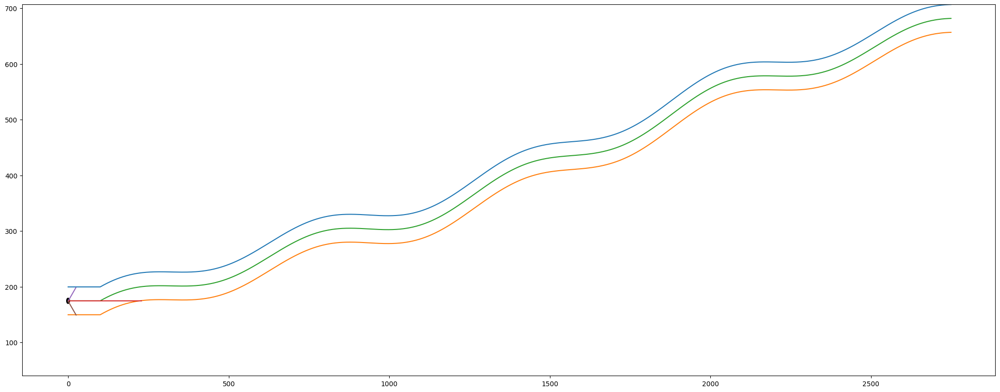

 --------------- plot --------------- 


In [31]:

road = Road2(wide = 50, length = 2750, a=300, b=300, c=100, a1=10, b1=10, c1=20, b2=0.2, s=130, p=100)

plotter = Plotter()
platter = Platter()
storage = Storage()

settings = {
    'hidden_layer_sizes': (5, 3),     # (5, 3)
    'learning_rate_init': 0.01,       # 0.01, 0.0001
    'solver': 'adam',                 # sgd, adam
    'activation': 'tanh',             # tanh, relu, logistic
    'nesterovs_momentum': False,
    'max_iter': 5,                    # 1
    'fit_intercept': False,           # Legyen-e intercept a LinearRegression
    'action_range': (10, 1),           # A lehtséges lépések sávja (-7, ..., +7) és a lépésköz
    'scaler_type': 'FixCenteredMax',             # None, MinMax, Standard, Fix, FixCenteredMax, Cut, Log, SignedLog, Reciprocal, Robust, Quantile
    'feature_range': (20, 20),        # Fix esetén az első az X, a második az y osztója (25, 75), !(25, 25), !(55, 55) (25, 10)
    'feature_range_centered_max_maximum': 50, # Fix CM esetén ez az érték a maximum ameddig a sensor lát
    'multi_sensor_regression': True,  # Ture
    'stop_external_move_at_i': 30,   # Ennyi lépés után már ne csináljon mesterséges mozgatást (30)
    'dynamic_external_step': True,
    'ridge_regression_alpha': 1.0,    # 1.0
    'random_state': 1,
#    'plot_y_min': 0,
#    'plot_y_max': 1200,
}

auto = Car(road, plotter, platter, storage, settings)

auto.sight = 500
auto.sight_center = 250 # 350

auto.calculate_distances()
auto.platter.plot_history(auto, 1)

In [32]:
auto.calculate_distances()

<a name="run"></a> [log](#log) [plt](#plt) [str](#str) [road](#road) [car](#car) run [dev](#dev) [zip](#zip) [tst](#tst)

# RUN

In [33]:
auto.mlp.verbose = False

auto.plot_state_space_discover_flag = 0        # 0 - disable, 1 - plot, 2 - save, 3 - both       0
auto.plotter_flag                   = 1        # 0 - disable, 1 - plot, 2 - save, 3 - both       1
auto.plot_history_flag              = 0        # 0 - disable, 1 - plot, 2 - save, 3 - both       0
auto.plot_trace_flag                = 1
auto.plot_investigation_flag        = 0
auto.plot_investigation_sensor_flag = 0
auto.plot_before_after_sensor_estimation_flag = 1
auto.plot_before_after_sensor_values_flag     = 1

auto.plot_frequency = 500
auto.print_rate = 2000

auto.investigation_figsize = (4, 4)                # (4, 4)
auto.investigation_in_one_figsize   = (12, 3)      # (18, 4.8)
auto.investigation_in_one_figsize_7 = (12, 4)      # (18, 7.5)
auto.test_plot_figsize = (15, 3)


# i =  0


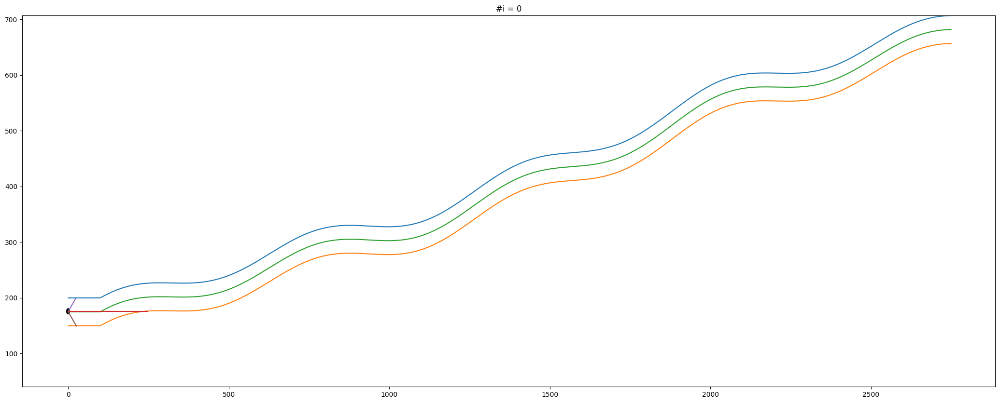

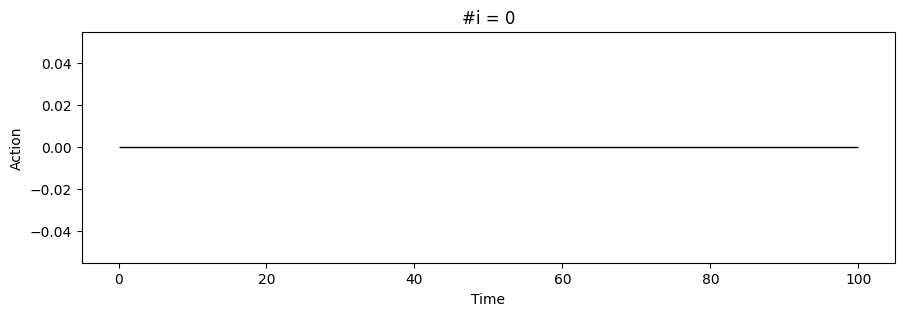

--- Lépés: 0 --- 
Y pozíció: 175.55093612726682 
# i =  100
# i =  200
# i =  300
# i =  400
# i =  500


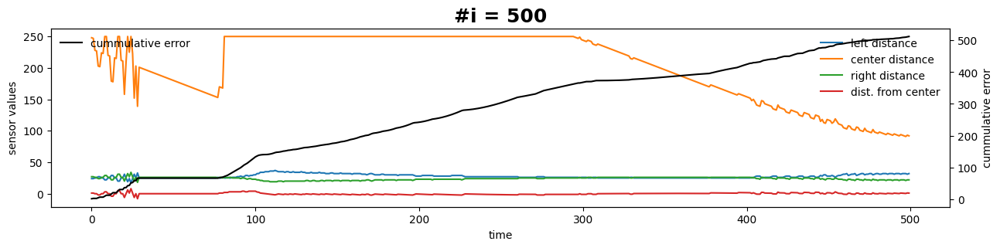

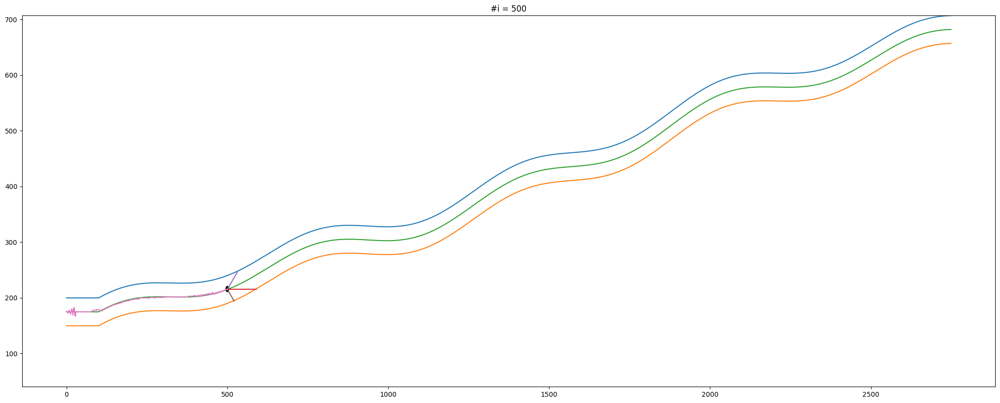

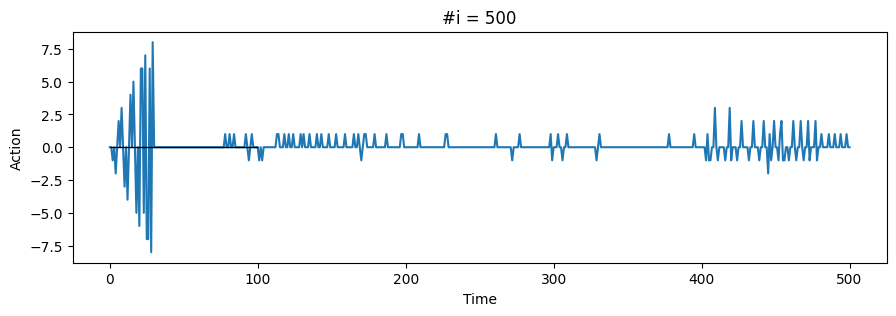

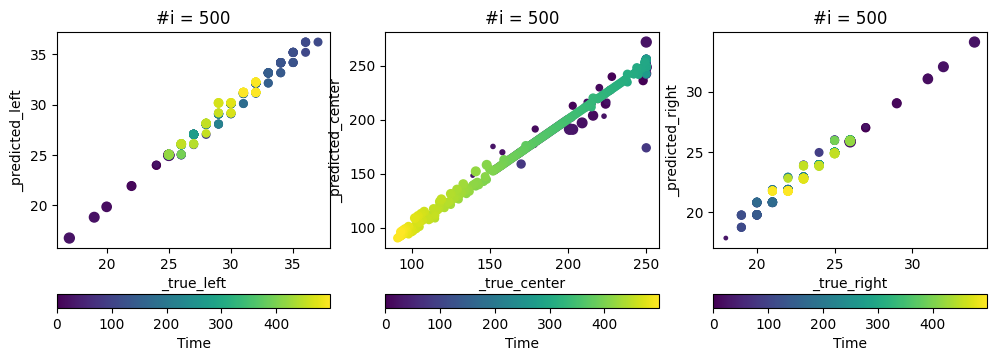

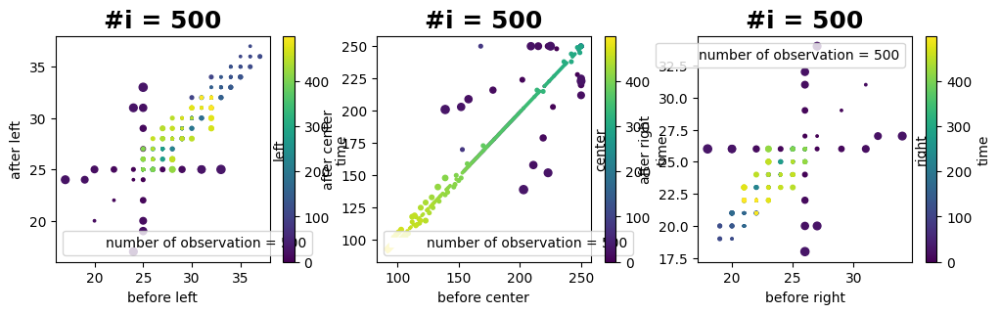

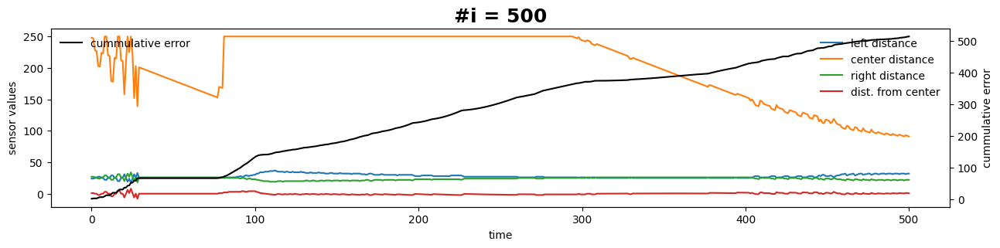

# i =  600
# i =  700
# i =  800
# i =  900
# i =  1000


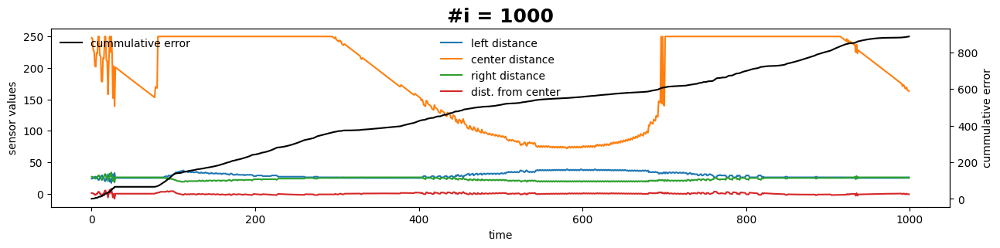

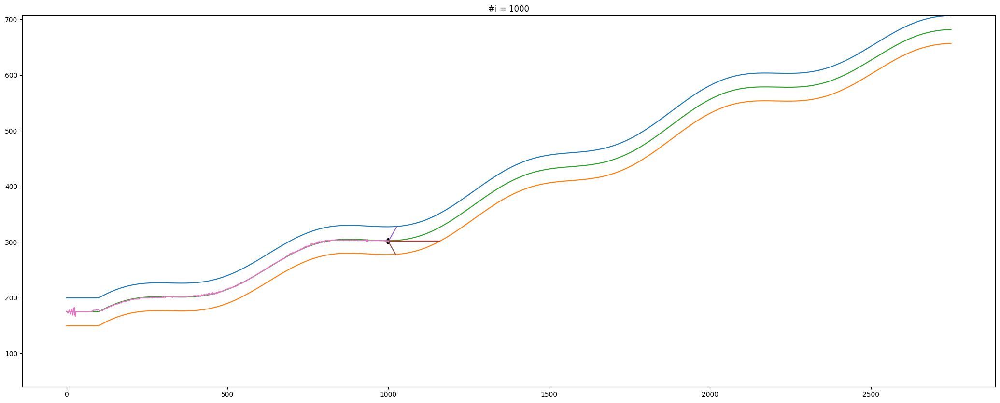

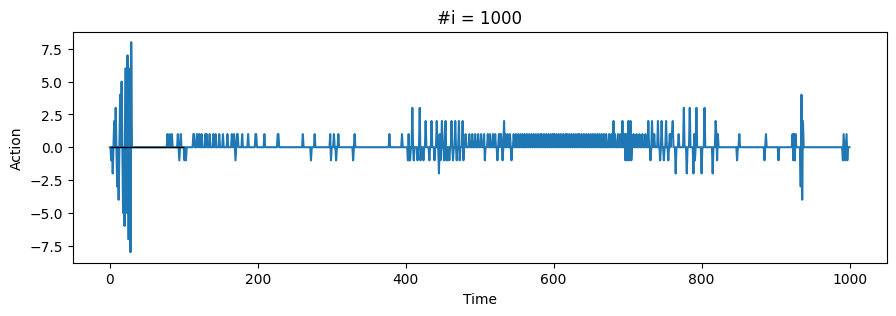

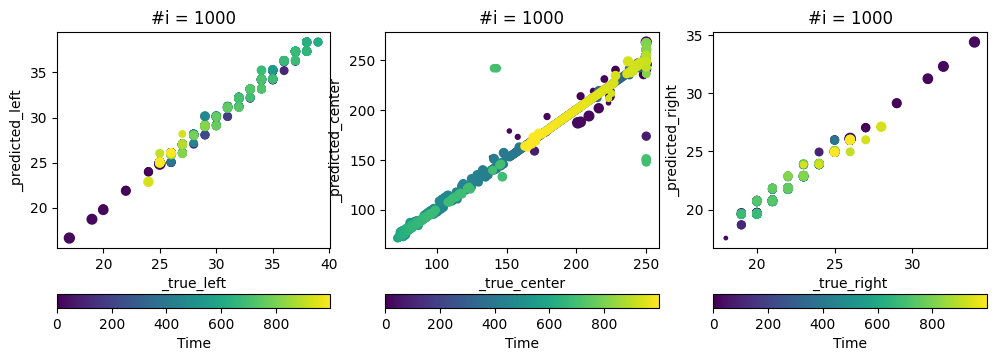

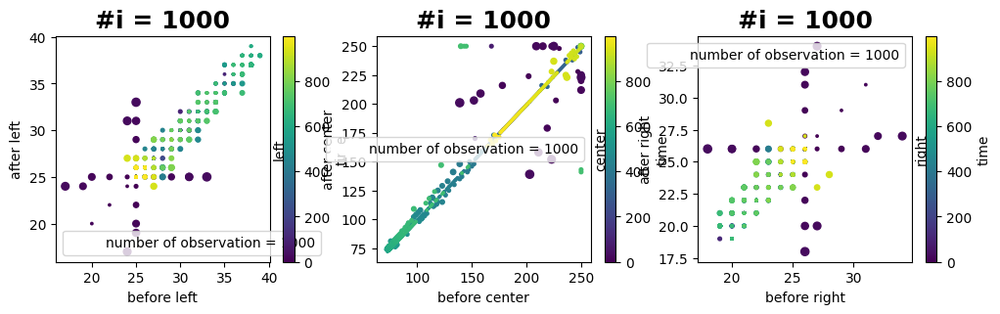

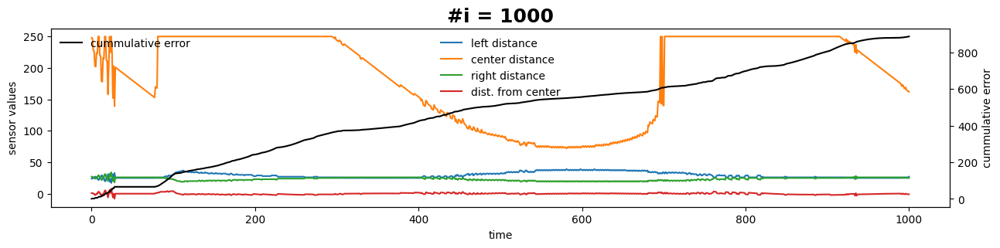

# i =  1100
# i =  1200
# i =  1300
# i =  1400
# i =  1500


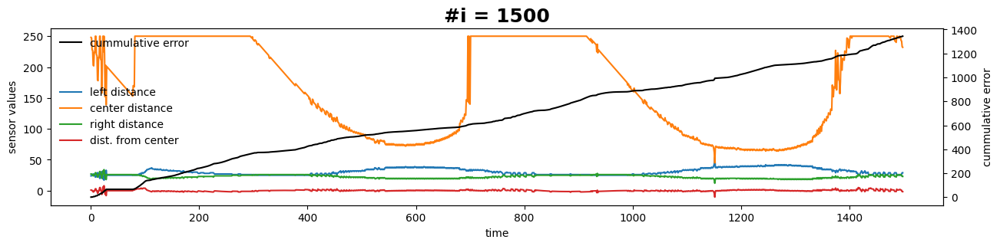

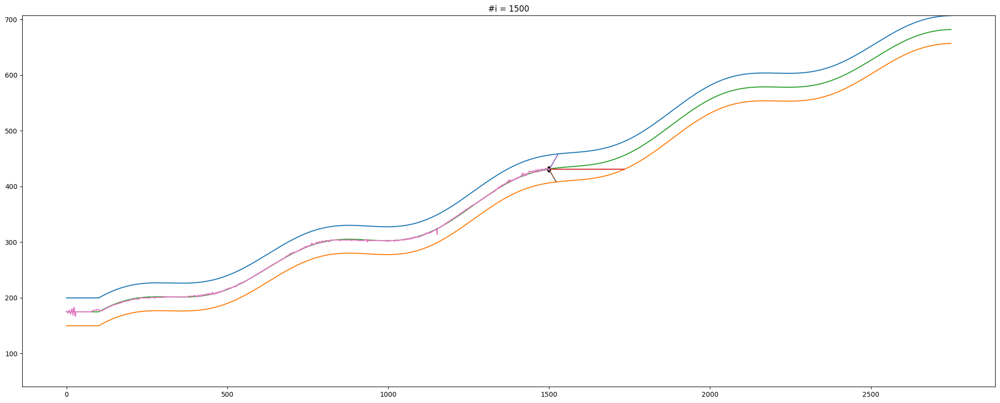

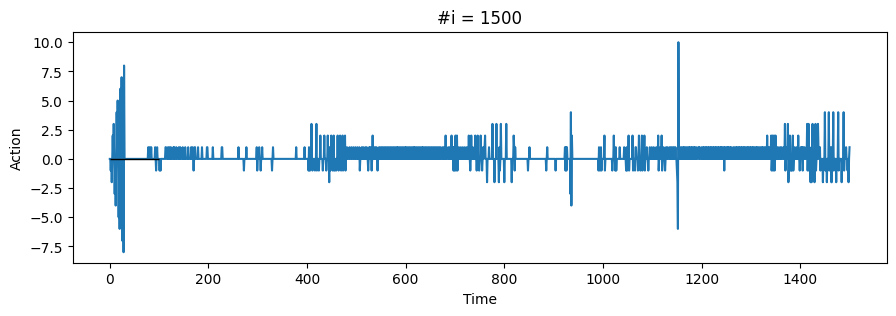

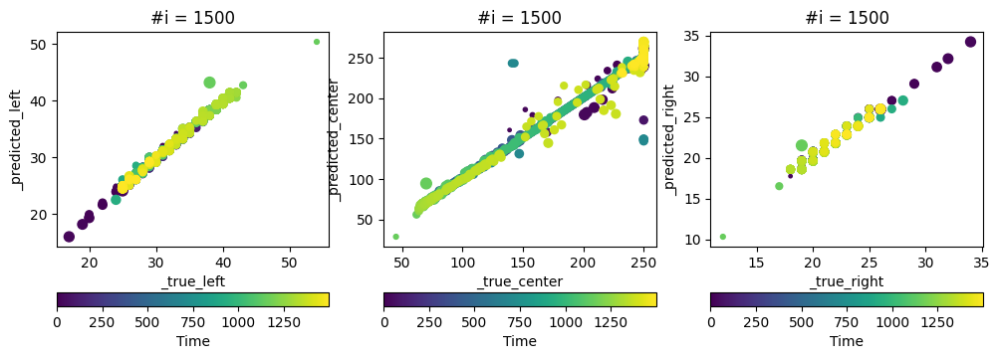

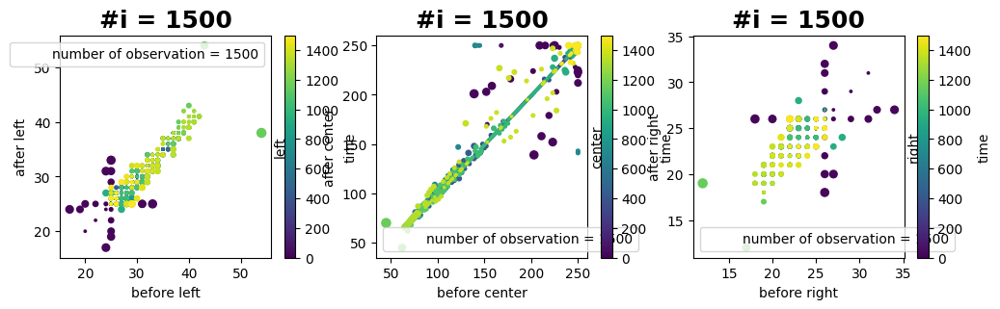

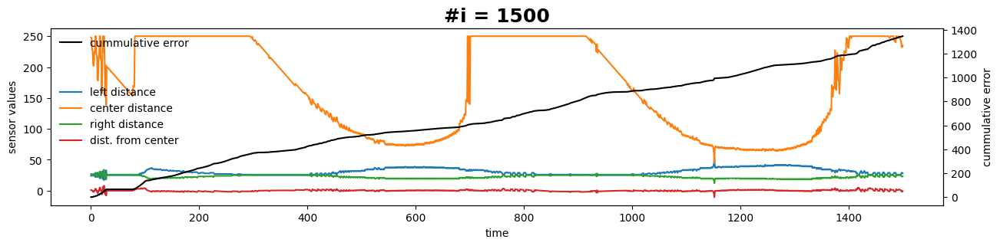

# i =  1600
# i =  1700
# i =  1800
# i =  1900
# i =  2000


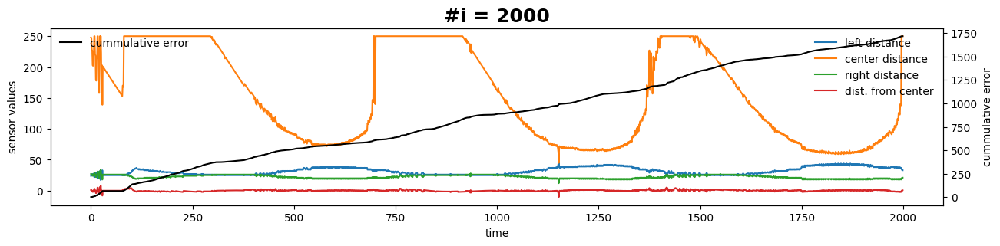

-------- ennyivel módosítom self.y értékét --------
self.y régi értéke = 556.55094
self.y új értéke   = 556.5509361272668
self.y új értéke   = 556.55094
self.y új értéke   = 556.55094
action             = 0
----------------- módosítás vége -----------------


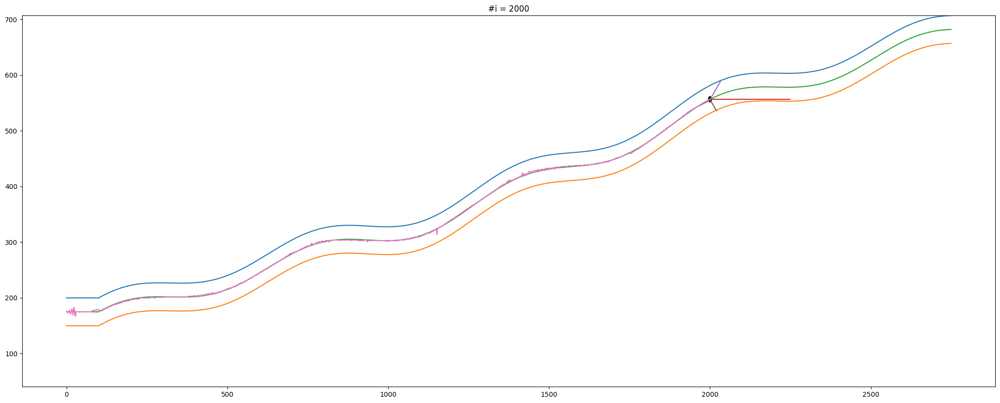

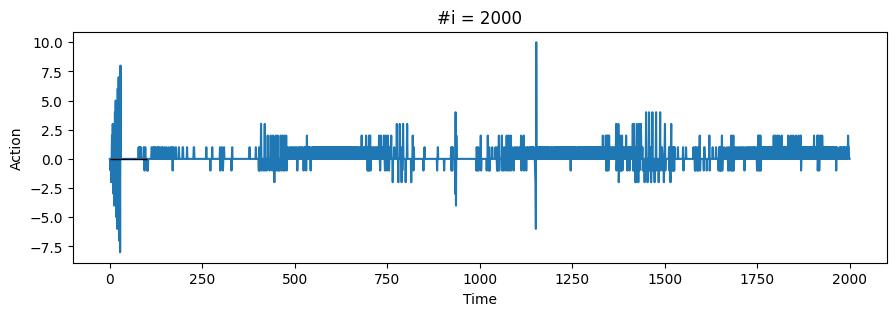

--- Lépés: 2000 --- 
Y pozíció: 556.5509361272668 


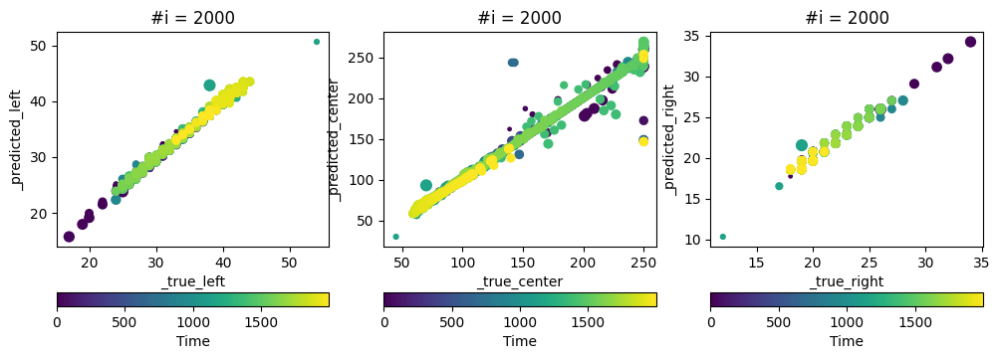

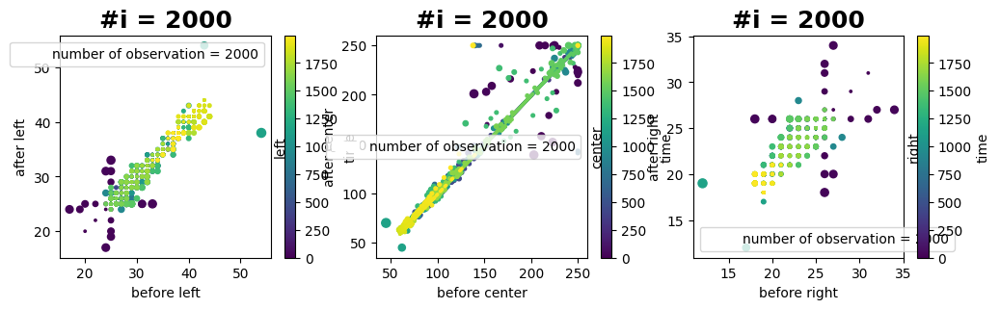

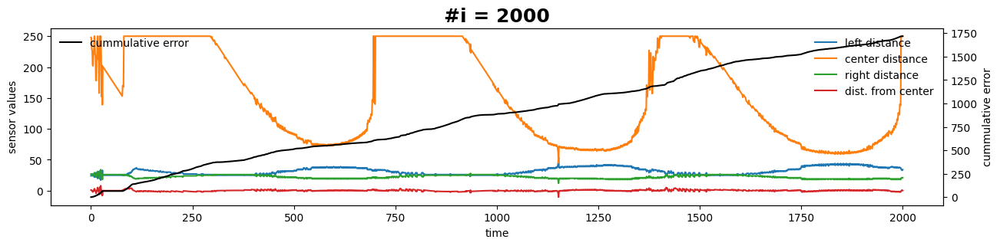

# i =  2100
# i =  2200
CPU times: user 2min 24s, sys: 3.9 s, total: 2min 28s
Wall time: 28 s


In [34]:
%%time

auto.artificial_jump_frequency = 110 # 100
auto.artificial_jump_value     = 5  # 10

auto.run(2230, artificial_jump=False) # 2230

# Itt most azt kéne tesztelni, hogy ha 1500 környékén jól megrángatnám random, akkor jobban teljesítene-e utána mint amikor nem rángattam meg.

    Ehhez annyit kéne tennem, hogy a Car osztályt vagy egy másik Car osztályt megcsinálni úgy, hgoy meg lehessen neki adni egy időpontot
    vagy egy intervallumot amikor meg lehet rángatni.
    
    Ehhez egyébként nem kell lemásolni a Car osztályt hanem lehet örököltenti és csak egy függvényt kellene overridolni meg a konstruktort.

# Most még megpróbálom hogy ne minden lépésben ugráljon csak ritkábban

In [36]:
class ConstantActionCar(Car):
    def __init__(self, road, plotter, platter, storage, settings=None,
                 override_start_i=None, override_end_i=None, override_value=1,
                 artificial_jump_interval=3):  # ÚJ PARAMÉTER
        super().__init__(road, plotter, platter, storage, settings)
        self.override_start_i = override_start_i
        self.override_end_i = override_end_i
        self.override_value = override_value

        self.artificial_jump_interval = artificial_jump_interval  # hányadik lépésben legyen mesterséges ugrás
        self.last_jump_direction = 1  # fel-le váltogatáshoz kezdeti irány


    def run(self, run_length, artificial_jump=False):
        
        __ = 0
        
        for i in range(0, run_length, 1):
            
            if i % 1000 == 0:
                gc.collect()
            
            if i % 100 == 0:
                printer.util('# i = ', i)
            
            # printer.util('# i = ', i)
        
            self.x = i
            
            # self.calculate_distances()

            # --- 1. DÖNTÉS és MOZGÁS (mesterséges vagy modell alapú) ---
            if i < self.stop_external_move_at_i and i % 2 == 0:
            
                # Mesterséges mozgatás
                printer.info(f"# Mesterséges mozgás, i = {i}")
                
                if self.dynamic_external_step == True:
                    if i % 4 == 0:
                        __ += 1
                    self.external_move_value = __
                    pass

                self.before.append(np.array([
                    self.y,
                    self.distance_left_from_wall,
                    self.distance_center_from_wall,
                    self.distance_right_from_wall
                ]))

                if self.mesterseges_coutner == 0:
                    # self.y += 1
                    self.y += self.external_move_value
                    self.mesterseges_coutner = 1
                elif self.mesterseges_coutner == 1:
                    # self.y -= 1
                    self.y -= self.external_move_value
                    self.mesterseges_coutner = 2
                elif self.mesterseges_coutner == 2:
                    # self.y -= 1
                    self.y -= self.external_move_value
                    self.mesterseges_coutner = 3
                elif self.mesterseges_coutner == 3:
                    # self.y += 1
                    self.y += self.external_move_value
                    self.mesterseges_coutner = 0

                self.calculate_distances()

                self.after.append(np.array([
                    self.y,
                    self.distance_left_from_wall,
                    self.distance_center_from_wall,
                    self.distance_right_from_wall
                ]))

            else:
                # Modell alapú döntés és léptetés
                action = 0
                
                if len(self.before) > 19:
                    best_score = float('inf')
                    best_action = 0
                    
                    # Lineáris regresszió kiszámolás az aktuális adatokon (ez egyben tanítás is)
                    before_array = np.array(self.before)
                    after_array = np.array(self.after)
                    y_delta = after_array[:, 0] - before_array[:, 0]
                    delta_array = after_array - before_array

                    # -------------- left
                    if self.multi_sensor_regression:
                        _X_left = np.array([
                            before_array[:, 1],  # left
                            before_array[:, 2],  # center
                            before_array[:, 3],  # right
                            delta_array[:, 0],   # delta_y
                        ]).T
                    else:
                        _X_left = np.array([
                            before_array[:, 1],  # left
                            delta_array[:, 0],   # delta_y
                        ]).T

                    _y_left = after_array[:, 1].reshape(-1, 1)
                    self.regression_left.fit(_X_left, _y_left)
                    
                    # Debud - Ellenőrzésnél plottolásnál használom csak ezt a változót
                    _predicted_left = self.regression_left.predict(_X_left)
                    
                    # -------------- center
                    if self.multi_sensor_regression:
                        _X_center = np.array([
                            before_array[:, 1],  # left
                            before_array[:, 2],  # center
                            before_array[:, 3],  # right
                            delta_array[:, 0],   # delta_y
                        ]).T
                    else:
                        _X_center = np.array([
                            before_array[:, 2],  # center
                            delta_array[:, 0],   # delta_y
                            ]).T  # center és delta_y (before)

                    _y_center = after_array[:, 2].reshape(-1, 1)  # center (after)
                    self.regression_center.fit(_X_center, _y_center)
                    
                    # Debud - Ellenőrzésnél plottolásnál használom csak ezt a változót
                    _predicted_center = self.regression_center.predict(_X_center)
                    
                    # -------------- right
                    if self.multi_sensor_regression:
                        _X_right = np.array([
                            before_array[:, 1],  # left
                            before_array[:, 2],  # center
                            before_array[:, 3],  # right
                            delta_array[:, 0],   # delta_y
                        ]).T
                    else:
                        _X_right = np.array([
                            before_array[:, 3],  # right
                            delta_array[:, 0],   # delta_y
                        ]).T

                    _y_right = after_array[:, 3].reshape(-1, 1)  # right (after)
                    self.regression_right.fit(_X_right, _y_right)
                    
                    # Debud - Ellenőrzésnél plottolásnál használom csak ezt a változót
                    _predicted_right = self.regression_right.predict(_X_right)
                    
                    
                    self.platter.plot_state_space_discover_1(self.plot_state_space_discover_flag)
                    self.platter.plot_state_space_discover_2(self.plot_state_space_discover_flag)
                    self.platter.plot_state_space_discover_3(self.plot_state_space_discover_flag)
                    self.platter.plot_state_space_discover_4(self.plot_state_space_discover_flag)
                    self.platter.plot_state_space_discover_5(self.plot_state_space_discover_flag)
                    
                    self.plotter.test_plot(self, self.x, self.plotter_flag, self.plotter_switch)

                    self.plotter.test_plot2(self, self.x, self.plotter_flag, self.plotter_switch)
                    
                    if self.multi_sensor_regression:
                        proba_X_metrika = np.array([1, 1, 1, 1]).reshape(1, -1)
                    else:
                        proba_X_metrika = np.array([1, 1]).reshape(1, -1)

                    printer.action('proba_X_metrika   = ', proba_X_metrika)
                    predicted_proba_left = self.regression_left.predict(proba_X_metrika)
                    predicted_proba_center = self.regression_center.predict(proba_X_metrika)
                    predicted_proba_right = self.regression_right.predict(proba_X_metrika)

                    printer.action('-------- 1 y up ->  left   = ', predicted_proba_left)
                    printer.action('-------- 1 y up ->  center = ', predicted_proba_center)
                    printer.action('-------- 1 y up ->  right  = ', predicted_proba_right)
                    printer.action('\n')

                    for j in np.arange(-self.action_range[0], self.action_range[0]+1, self.action_range[1]):
                        if self.multi_sensor_regression:
                            features = np.array([[
                                self.distance_left_from_wall,
                                self.distance_center_from_wall,
                                self.distance_right_from_wall,
                                j
                            ]])
                        else:
                            features = np.array([[self.distance_left_from_wall, j]])

                        pred_left = self.regression_left.predict(features)
                        pred_center = self.regression_center.predict(features)
                        pred_right = self.regression_right.predict(features)
                        
                        printer.action('\t\t Actionhöz tartozó pred_left, pred_center, pred_right')
                        printer.action('\t\t pred_left    = ', pred_left)
                        printer.action('\t\t pred_center  = ', pred_center)
                        printer.action('\t\t pred_right   = ', pred_right)
                        
                        X_model = np.array([pred_left.ravel(), pred_center.ravel(), pred_right.ravel()]).T
                        X_scaled = self.x_minmaxscaler.transform(X_model)

                        printer.action('\t\t # Ez lesz a bemenete a neurális hálónak')
                        printer.action('\t\t -------------------------X-------------------------')
                        printer.action('\t\t ', X_model)
                        printer.action('\t\t -------------------------X_scaled------------------')
                        printer.action('\t\t ', X_scaled)
            
                        pred_distance = self.mlp.predict(X_scaled)
                        pred_distance_inv = self.y_minmaxscaler.inverse_transform(pred_distance.reshape(-1, 1))

                        printer.action('\t\t ---------------------')
                        printer.action('\t\t  action = ', j)
                        printer.action('\t\t  predicted_position = ', pred_distance_inv)
                        printer.action('\t\t  absolute distance from 0 (tmp) = ', abs(0 - pred_distance_inv))
                        printer.action('\t\t ---------------------')

                        score = abs(pred_distance_inv[0, 0])
                        if score < best_score:
                            best_score = score
                            best_action = j

                    printer.action('\t minden j-re kiszámoltuk az előrejelzést \n')

                    action = best_action

                # Apply selected action
                self.before.append(np.array([
                    self.y,
                    self.distance_left_from_wall,
                    self.distance_center_from_wall,
                    self.distance_right_from_wall
                ]))
                
                if i % self.print_rate == 0:
                    print('-------- ennyivel módosítom self.y értékét --------')
                    print(f'self.y régi értéke = {self.y:.{self.digit}f}')
                
                # --- Mesterséges ugrás 200-adik lépésenként ---
                if artificial_jump and abs(self.vertical_distance_from_middle) > 9:
#                    print(f"<<< MESTERSÉGES UGRÁS @ i = {i} >>>")
                    if self.vertical_distance_from_middle < 0:
                        self.y += 10
                    if self.vertical_distance_from_middle > 0:
                        self.y -= 10
                    self.jump_flags.append(i)  # opcionálisan naplózzuk a jump-eket
                # lllllllllllllllllllllllllllllllllllllllll:
                # Speciális tartományban állandó lépés
                elif (self.override_start_i is not None and 
                      self.override_end_i is not None and 
                      self.override_start_i <= i <= self.override_end_i):

                    printer.info(f"# ÁLLANDÓ MOZGÁS [{i}]")

                    if (i + 1) % self.artificial_jump_interval == 0:
                        # Mesterséges ugrás váltakozó irányban
                        self.last_jump_direction *= -1
                        jump = np.random.randint(1, self.override_value + 1)
                        self.y += self.last_jump_direction * jump
                        printer.info(f"# MESTERSÉGES UGRÁS [{i}] irány: {self.last_jump_direction} → y += {self.last_jump_direction * jump}")
                        # print(f"# MESTERSÉGES UGRÁS [{i}] irány: {self.last_jump_direction} → y += {self.last_jump_direction * jump}")
                    else:
                        # Normál action
                        self.y += action
                        printer.info(f"# NORMÁL LÉPÉS [{i}] → y += {action}")
                # ---------





                    
                else:
                    # --- modell alapú lépés ---
                    self.y += action
                
                self.calculate_distances()

                self.after.append(np.array([
                    self.y,
                    self.distance_left_from_wall,
                    self.distance_center_from_wall,
                    self.distance_right_from_wall
                ]))
                
                if i % self.print_rate == 0:
                    print(f'self.y új értéke   = {self.y}')
                    print(f'self.y új értéke   = {self.y:.{self.digit}f}')
                    print(f'self.y új értéke   = {self.y:.5f}')
                    print(f'action             = {action}')
                    print('----------------- módosítás vége -----------------')
                
                # print('GECI', i)

            # --- 2. MEGFIGYELÉS ---

            self.append()  # sensor + y_distance mentés

            # --- 3. TANULÁS ---

            if i >= 12:
                X = np.array([self.sensor_left, self.sensor_center, self.sensor_right]).T
                y = np.array([self.y_distance]).T

                self.x_minmaxscaler.fit(X)
                self.y_minmaxscaler.fit(y)

                X_scaled = self.x_minmaxscaler.transform(X)
                y_scaled = self.y_minmaxscaler.transform(y)

                # Réig MLPRegressor megoldásnál
                # self.mlp.fit(X_scaled, y_scaled)
                
                # PyTorch és Tensorflow megoldásnál
                for _ in range(self.max_iter):
                    self.mlp.fit(X_scaled, y_scaled)
                
                # Ha olyanunk van plottoljunk
                self.plotter.plot_mlp(mlp=self.mlp, flag=self.plotter_mlp_flag)

            # --- 4. BECSLÉS és visszamérés ---

            if i >= 22:
                X_test = np.array([[
                    self.sensor_left[-1],
                    self.sensor_center[-1],
                    self.sensor_right[-1]
                ]])
                X_scaled = self.x_minmaxscaler.transform(X_test)
                pred_scaled = self.mlp.predict(X_scaled)

                pred_inv = self.y_minmaxscaler.inverse_transform(pred_scaled.reshape(-1, 1)).flatten()
                self.y_distance_real.append(self.y_distance[-1])
                self.y_distance_predicted.append(pred_scaled)
                self.y_distance_predicted_inv.append(pred_inv)

            # --- 5. LOG + PLOT + TÁROLÁS ---

            self.y_history.append(self.y)

            if i % self.plot_frequency == 0:
                self.platter.plot_history(self, self.plot_history_flag)
                self.platter.plot_trace(self, self.plot_frequency, self.plot_trace_flag, plot_action = False)

            # Tároljuk el minden körben a ml modellek érétkeit
            if hasattr(self.regression_left, 'coef_'):
                self.regression_left_coef_history.append(self.regression_left.coef_)
                self.regression_center_coef_history.append(self.regression_center.coef_)
                self.regression_right_coef_history.append(self.regression_right.coef_)

            if i % self.print_rate == 0:
                printer.util(f"--- Lépés: {i} ---")
                printer.util(f"Y pozíció: {self.y}")

# Ez volt az eredeti
            # if i > 32:
# New X29
            if i > self.stop_external_move_at_i:

                # korábban csak azokat az adatokat plottoltam amik a tanulás után lettek visszamérve,
                # de nézzük meg a teljes adatsoron
                X_test_full = np.array([
                    self.sensor_left, self.sensor_center, self.sensor_right
                ]).T
                _X_test_full = X_test_full
                _X_test_full_scaled = self.x_minmaxscaler.transform(_X_test_full)
                predicted_test_full = self.mlp.predict(_X_test_full_scaled)
                predicted_test_full = self.y_minmaxscaler.inverse_transform(predicted_test_full.reshape(-1, 1))
                _y_test_full = np.array([self.y_distance]).T
                printer.info('_y_test_full.shape = ', _y_test_full.shape)
                printer.info('predicted_test_full.shape = ', predicted_test_full.shape)

                # Plot
                # (flag 0 = disable, flag 1 = plot, 2 = save, 3 = both)
                
                # Vizsgáljuk meg, hogy milyen kapcsolat van a becsült y és a valós y érték között
    
                # self.plot_investigation_flag

                self.platter.plot_investigation_1(self, self.plot_investigation_flag)
                self.platter.plot_investigation_2_wrong(self, self.plot_investigation_flag)
                # self.platter.plot_investigation_2_good(self, self.plot_investigation_flag)
                self.platter.plot_investigation_2_good_color(self, self.plot_investigation_flag)
                # self.platter.plot_investigation_3(self, _y_test_full, predicted_test_full, self.plot_investigation_flag)
                self.platter.plot_investigation_3_color(self, _y_test_full, predicted_test_full, self.plot_investigation_flag)
                self.platter.plot_investigation_3_color_regline(self, _y_test_full, predicted_test_full, self.plot_investigation_flag)
                # self.platter.plot_investigation_3_color_regline_fixaxis_small(self, _y_test_full, predicted_test_full, self.plot_investigation_flag)
                self.platter.plot_investigation_3_color_regline_fixaxis_large(self, _y_test_full, predicted_test_full, self.plot_investigation_flag)
                
                # Illetve, hogy miyen kapcsolat van a szenzorok értékei és a becsült változó között
                self.platter.plot_investigation_senors(self, _y_test_full, predicted_test_full, self.plot_investigation_sensor_flag)

                # Show history plot - Save history plot
                self.platter.plot_history(self, self.plot_history_flag)

                # self.platter.plot_trace(self, self.plot_frequency, self.plot_trace_flag)
                
                # self.platter.fuck(self)
                
                
# Ok -> nem raktam még át másik osztályba

                # Ezek a plottok is olyanok hogy három féle módon ábrázolnják egy szenzornak
                # a becslésének a pontosságát

                # self.platter.plot_before_after_sensor_estimation_in_one_chart(
                #     self, _y_left, _predicted_left, y_delta, 'left',
                #     self.plot_before_after_sensor_estimation_flag)
 
                # self.platter.plot_before_after_sensor_estimation_in_one_chart(
                #     self, _y_center, _predicted_center, y_delta, 'center',
                #     self.plot_before_after_sensor_estimation_flag)
 
                # self.platter.plot_before_after_sensor_estimation_in_one_chart(
                #     self, _y_right, _predicted_right, y_delta, 'right',
                #     self.plot_before_after_sensor_estimation_flag)

                # Ezért ezek helyett inkább kiválasztok egy féle ábrázolás módót és azt
                # alklamazom mind a három szenzor adatra - LCR
                
                self.platter.plot_before_after_sensor_estimation_in_one_chart_LCR_v1(self,
                                                                                     _y_left,
                                                                                     _predicted_left,
                                                                                     _y_center,
                                                                                     _predicted_center,
                                                                                     _y_right,
                                                                                     _predicted_right,
                                                                                     y_delta)



                # Eddig egy konkrét sensor skálázás utáni értéke és skálázás utáni értéke becslés alapján közötti kapcsolatot vizsgáltunk
                # Most vizsgáljuk meg csak a maga egyszerűsgében azt, hogy milyen kapcsolat van a skálás elötti valós és a skálázás utáni valós érté között
                # kiplottolom a before after adatokat egy konkrét szenzor értékeire

                # [[ez a változó is csak azért kell, hogy lássam hogy áll az aktuális sensor before after érteke]]
                # [[sensor link]]
                # [[before_array[:,1](left), after_array[:,1](left), y_delta{action}, time]]
                _array_target_left = np.array([
                    before_array[:, 1].ravel(), after_array[:, 1].ravel(),
                    y_delta.ravel(),
                    np.arange(0, after_array.shape[0], 1)
                ]).T
                
                # [[before_array[:,2](center), after_array[:,2](center), y_delta{action}, time]]
                _array_target_center = np.array([
                    before_array[:, 2].ravel(), after_array[:, 2].ravel(),
                    y_delta.ravel(),
                    np.arange(0, after_array.shape[0], 1)
                ]).T
                
                # [[before_array[:,3](right), after_array[:,3](right), y_delta{action}, time]]
                _array_target_right = np.array([
                    before_array[:, 3].ravel(), after_array[:, 3].ravel(),
                    y_delta.ravel(),
                    np.arange(0, after_array.shape[0], 1)
                ]).T

                # Egy szenzor három féle módon ábrázolva a before - after értéke közötti összefüggés
                # self.platter.plot_before_after_sensor_values_in_one_chart(self, _array_target_left, 'left', self.plot_before_after_sensor_values_flag)
                
                # Mivel kibaszottul redundáns ehelyett csináltam egy olyan megoldást ahol a három szenzor
                # LCR együtt van rajta egy féle módon ábrázolva

                self.platter.plot_before_after_sensor_values_in_one_chart_LCR_v1(self,
                                                                                 _array_target_left,
                                                                                 _array_target_center,
                                                                                 _array_target_right,
                                                                                 'LRC')
                
                self.plotter.test_plot2(self, self.x, self.plotter_flag, self.plotter_switch)

            # if (i % 10 == 0):
            #     clear_output(wait=True)


            


# Akkor ez azt jelenti hogy 4 kísérlet sorozatot kell végeznem.

    1. kicsi háló (5, 3) mesterséges mozgatással az 500-1000 időpont szakaszon
    
    2. kicsi háló (5, 3) mesterséges mozgatás nélkül
    
    3. nagy háló (10, 5) mesterségess mozgatással az 500-1000 időpont szkaszon
    
    4. nagy háló (10, 5) mesterséges mozgatás nélkül

In [ ]:
def plot_before(_from_idx, _to_idx, _y_min=0, _y_max=None):
    # auto.before # [y, l, c, r]
    plt.figure(figsize=(16, 4))
    plt.plot(auto.before[_from_idx : _to_idx])
    plt.ylim(_y_min, _y_max)
    plt.show()

_from_idx = widgets.IntSlider(min=0, max=2000, step=1, value=0)
_to_idx   = widgets.IntSlider(min=-2000, max=-1, step=1, value=-1)
_y_min = widgets.IntSlider(min=0, max=1000, step=1, value=0)
_y_max = widgets.IntSlider(min=0, max=1000, step=1, value=1000)

interact(plot_before, _from_idx=_from_idx, _to_idx=_to_idx, _y_min=_y_min, _y_max=_y_max);

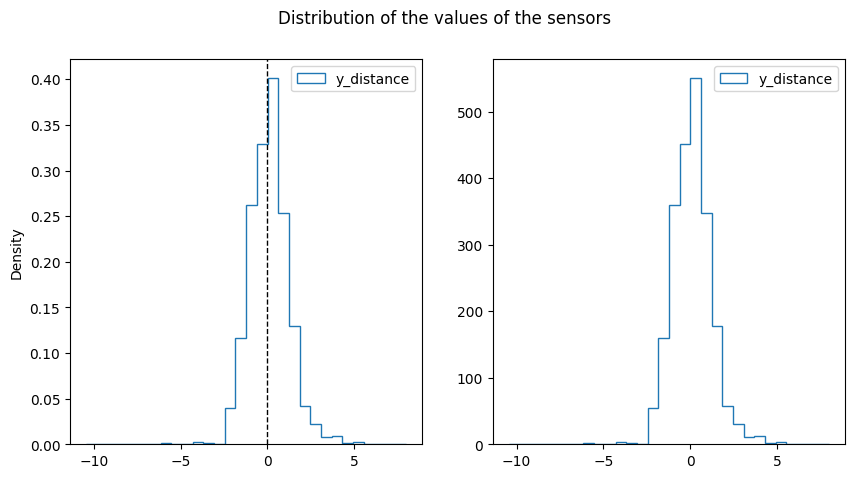

In [38]:
postPlotter = PostPlotter(auto)

postPlotter.plot_y_distance_distibution()

In [39]:


def plot_lr_weight(car, sensors = ['left'], coefs = ['sensor', 'action'], x = 1, flag = 1):

  if( flag != 0 ):

        # _X_left   =  [[51 -3]]
        # _X_center =  [[110  -3]]
        # _X_right  =  [[51 -3]]

        # Emlékeztetőül,
        # A regressziók ilyen bemeneteket várnak, tehát az első coefficiens azt mondja meg,
        # hogy adott szezor értéket ekkora súllyal kell figyelmbe venni
        # a második coefficiens pedig azt modja meg, hogy a változtatás irányát ekkora
        # sullyal kell figelembe venni -> ha azt akarjuk meghatározni, hogy adott szezorértékből
        # mi lesz, ha valamennyivel elmozdítjuk az autót.
        # A szezor értéke és ez elmozdítás mértéke változók (paraméterek) az egyenletben
        # a szorzótényezők (az egyenlet coefficiensei pedig állandók)
        # Ez a plott a coefficienseket jelenítit meg, illetve azt, hogy ezek hogyan változtak
        # a futás során.

    # sajnos át kell alakítanom másképpen nem megy

    array_regression_left_coef_history = np.array(auto.regression_left_coef_history)
    array_regression_left_coef_history = array_regression_left_coef_history[:,[0][0]]

    array_regression_center_coef_history = np.array(auto.regression_center_coef_history)
    array_regression_center_coef_history = array_regression_center_coef_history[:,[0][0]]

    array_regression_right_coef_history = np.array(auto.regression_right_coef_history)
    array_regression_right_coef_history = array_regression_right_coef_history[:,[0][0]]

    a = True if 'action' in coefs else False
    s = True if 'sensor' in coefs else False

    fig = plt.figure(figsize=(8, 3.8))
    ax = fig.add_subplot()

    if ( 'left' in sensors ):
      if a : ax.plot(array_regression_left_coef_history[:,0], c = '#5195c4', linestyle='dashed', label = 'left sensor coef')
      if s : ax.plot(array_regression_left_coef_history[:,1], c = '#5195c4', label = 'left action coef')

    if ( 'center' in sensors ):
      if a : ax.plot(array_regression_center_coef_history[:,0], c = '#000000', linestyle='dashed', label = 'center sensor coef')
      if s : ax.plot(array_regression_center_coef_history[:,1], c = '#000000', label = 'center action coef')

    if ( 'right' in sensors ):
      if a : ax.plot(array_regression_right_coef_history[:,0], c = '#ff8821', linestyle='dashed', label = 'right sensor coef')
      if s : ax.plot(array_regression_right_coef_history[:,1], c = '#ff8821', label = 'right action coef')
    ax.legend(frameon=False)
    # fig.show()

    fileName = 'plot_lr_coefs'
    if( flag == 1 or flag == 3 ): plt.show(); # fig.show();
    if( flag == 2 or flag == 3 ): fig.savefig(fileName + '_{0:04}'.format(x)+'.png', bbox_inches='tight'); plt.close('all'); fig.clf(); ax.cla(); plt.close('all');




<a name='experiments'></a>

# Experiments

[log](#log) [car](#car) [run](#run) [zip](#zip)

[Setup](#setup_current_train)

[Experiments](#experiments)

[Experiment 1](#experiment_1) | [Experiment 2](#experiment_2)

[Top](#top)

In [260]:
def plot_multiple_histories(cars, show_y_distance=False, legend=True):
    if not cars:
        print("Nincs megjeleníthető autó.")
        return

    fig, ax = cars[0].road.show()

    # Viridis színskála létrehozása n autóra
    cmap = plt.get_cmap('viridis')
    cmap = plt.get_cmap('Blues') # Blues_r
    
    colors = [cmap(i / max(len(cars) - 1, 1)) for i in range(len(cars))]

    for idx, car in enumerate(cars):
        color = colors[idx]

        circle = plt.Circle((car.x, car.y), 5, color='black')
        ax.add_patch(circle)

        ax.plot(
            range(int(car.x), int(car.x + car.distance_center_from_wall)),
            [car.y] * car.distance_center_from_wall,
            color=color,
            linestyle='--'
        )

        ax.plot(
            range(int(car.x), int(car.x + car.distance_left_from_wall)),
            range(int(car.y), int(car.y + car.distance_left_from_wall)),
            color=color,
            linestyle=':'
        )

        ax.plot(
            range(int(car.x), int(car.x + car.distance_right_from_wall)),
            range(int(car.y), int(car.y - car.distance_right_from_wall), -1),
            color=color,
            linestyle=':'
        )

        if show_y_distance and hasattr(car, 'y_distance'):
            __ = 500
            ax.plot(
                np.array(car.y_distance) + __,
                label=f'Car {car.x} y_distance',
                color=color
            )
            ax.axhline(__, color='black', lw=1.0, ls='--')

        if hasattr(car, 'y_history') and len(car.y_history) > 0:
            ax.plot(car.y_history, label=f'Car {car.x} y_history', color=color)

        if hasattr(car, 'plot_y_min') and hasattr(car, 'plot_y_max'):
            if car.plot_y_min is not None and car.plot_y_max is not None:
                ax.set_ylim(car.plot_y_min, car.plot_y_max)

    if legend == True:
        ax.legend()
    plt.title("Több autó pályatörténete")
    plt.savefig('Results/Zoo.png', dpi=300, format='png')
    plt.show()

def plot_multiple_histories_fill(cars, show_y_distance=False):
    if not cars:
        print("Nincs megjeleníthető autó.")
        return

    fig, ax = cars[0].road.show()

    # Szín kiválasztása a háttérkitöltéshez
    cmap = plt.get_cmap('viridis')
    fill_color = cmap(0.6)  # pl. középtónusú szín
    fill_alpha = 0.3        # áttetszőség

    # y_history gyűjtése
    histories = [car.y_history for car in cars if hasattr(car, 'y_history') and len(car.y_history) > 0]

    if not histories:
        print("Egyik autónak sincs y_history adata.")
        return

    # Az összes history-t azonos hosszra hozzuk (padding vagy vágás)
    min_len = min(len(h) for h in histories)
    trimmed_histories = [h[:min_len] for h in histories]  # vágjuk őket
    all_histories = np.array(trimmed_histories)

    y_min = np.min(all_histories, axis=0)
    y_max = np.max(all_histories, axis=0)
    x = np.arange(min_len)

    # Kitöltött terület kirajzolása
    ax.fill_between(x, y_min, y_max, color=fill_color, alpha=fill_alpha, label='y_history min-max sáv')

    ax.legend()
    plt.title("Y_history min-max tartomány (több autó)")
    plt.show()

def plot_multiple_histories_bolinger(cars, show_y_distance=False, dpi=80, std=1.0):
    if not cars:
        print("Nincs megjeleníthető autó.")
        return

    fig, ax = cars[0].road.show()

    # Colormap és szín az árnyékoláshoz
    cmap = plt.get_cmap('viridis')
    fill_color = cmap(0.6)
    fill_alpha = 0.3

    # y_history gyűjtése
    histories = [car.y_history for car in cars if hasattr(car, 'y_history') and len(car.y_history) > 0]

    if not histories:
        print("Egyik autónak sincs y_history adata.")
        return

    # Az összes history-t azonos hosszra hozzuk (vágás)
    min_len = min(len(h) for h in histories)
    trimmed_histories = [h[:min_len] for h in histories]
    all_histories = np.array(trimmed_histories)
    
    print('min_ien            ', min_len)
    print('all_histories.shape', all_histories.shape)

    # Statisztika
    y_mean = np.mean(all_histories, axis=0)
    y_median = np.median(all_histories, axis=0)
    y_std = np.std(all_histories, axis=0)
    y_upper = y_median + (y_std * std)
    y_lower = y_median - (y_std * std)
    x = np.arange(min_len)
    
    print('y_mean.shape       ', y_mean.shape)
    print('y_std.shape        ', y_std.shape)

    # Kitöltés: átlag ± szórás
    ax.fill_between(x, y_lower, y_upper, color=fill_color, alpha=fill_alpha, label='mean ± std. dev.')

    # Átlag vonal megjelenítése
    # ax.plot(x, y_mean, color='black', label='average', linewidth=1, ls='--')
    
    # Medián vonal megjelenítése
    ax.plot(x, y_median, color='black', label='median', linewidth=2)

    # Opcionális: autók pozíciójának megjelenítése
    for car in cars:
        circle = plt.Circle((car.x, car.y), 5, color='black')
        ax.add_patch(circle)

    ax.legend()
    plt.title("Deviation from ideal trace: mean ± standard deviation")
    plt.xlabel("Time")
    plt.ylabel("Target value")
    plt.grid(True)
    plt.savefig('Results/Zen.png', format='png', dpi=dpi)
    plt.tight_layout()
    plt.show()


# SIM_N

In [133]:
__SIM_N = 100

In [289]:
# Ebbe fogom gyüjteni az experimentek végén a kocsikat  a későbbi plotolás és elemzés céljából.

cars_in_experiment = {}


# (1.) Small (5, 3) Net without move.

# --------------------- road Description ----------------------------
  		 road.length =  2750
  		 minimum slope (descending) =  -3.2174072638526923
  		 maximum slope (ascending)  =   3.456286285863712
# -----------------------------------------------------------------
FixScalerCenteredMax self.offset 25.0


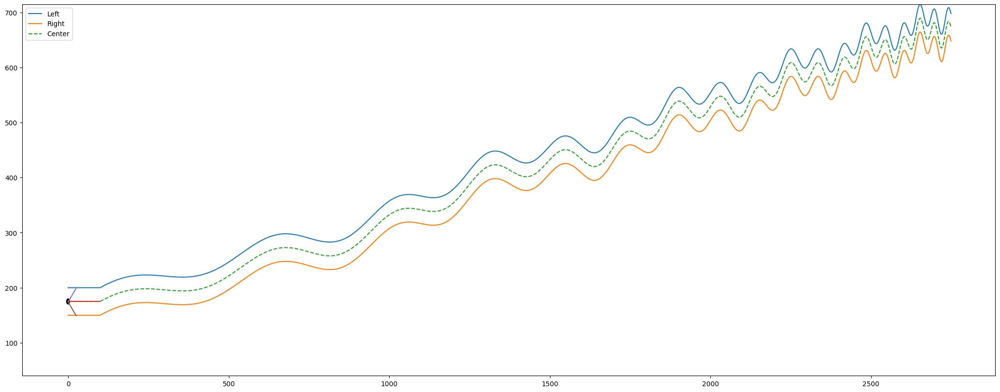

 --------------- plot --------------- 


In [134]:
road = Road2a(wide=50,
              length=2750,
              a=300, a_min=75,
              b=300, b_min=75,
              c=100, c_min=25,
              a1=10,
              b1=10,
              c1=20,
              b2=0.2,
              s=130,
              p=100)

plotter = Plotter()
platter = Platter()
storage = Storage()

settings = {
    'hidden_layer_sizes': (5, 3),     # (5, 3)
    'learning_rate_init': 0.01,       # 0.01, 0.0001
    'solver': 'adam',                 # sgd, adam
    'activation': 'tanh',             # tanh, relu, logistic
    'nesterovs_momentum': False,
    'max_iter': 5,                    # 1
    'fit_intercept': False,           # Legyen-e intercept a LinearRegression
    'action_range': (10, 1),           # A lehtséges lépések sávja (-7, ..., +7) és a lépésköz
    'scaler_type': 'FixCenteredMax',             # None, MinMax, Standard, Fix, FixCenteredMax, Cut, Log, SignedLog, Reciprocal, Robust, Quantile
    'feature_range': (20, 20),        # Fix esetén az első az X, a második az y osztója (25, 75), !(25, 25), !(55, 55) (25, 10)
    'feature_range_centered_max_maximum': 50, # Fix CM esetén ez az érték a maximum ameddig a sensor lát
    'multi_sensor_regression': True,  # Ture
    'stop_external_move_at_i': 30,   # Ennyi lépés után már ne csináljon mesterséges mozgatást (30)
    'dynamic_external_step': True,
    'ridge_regression_alpha': 1.0,    # 1.0
    'random_state': 1,
#    'plot_y_min': 0,
#    'plot_y_max': 1200,
}

auto = ConstantActionCar(
    road=road,
    plotter=plotter,
    platter=platter,
    storage=storage,
    settings=settings,
    override_start_i=30000,
    override_end_i=160000,
    override_value=0,
    artificial_jump_interval=3
)

auto.sight = 250
auto.sight_center = 100 # 250

auto.calculate_distances()
auto.platter.plot_history(auto, 1)

In [135]:
# 2 experiment az 1 perc volt
# akkor 30 exp az kb 15 perc lesz

In [136]:
%%time

experiments = {}

for i in range(__SIM_N):
    settings['random_state'] = i

    auto = ConstantActionCar(
    road=road,
    plotter=plotter,
    platter=platter,
    storage=storage,
    settings=settings,
    override_start_i=30000,
    override_end_i=160000,
    override_value=0,
    artificial_jump_interval=3
)
    
    auto.sight = 250
    auto.sight_center = 100
    
    auto.calculate_distances()
    auto.mlp.verbose = False
    printer._nf = False
    printer._ut = False
    auto.print_rate = 90000
    
    start_time = time.time()
    auto.run(2490, artificial_jump=False)
    end_time = time.time()
    duration = end_time - start_time
    print(f'# {i} run metódus futási ideje: {duration:.3f} másodperc')
    
    
    err = np.cumsum(np.abs(auto.y_distance))
    print(f'cum sum err vége: {err[-1]:.2f}')
    
    experiments[i] = {
        'i': i,
        'settings': copy.deepcopy(settings),
        'auto': copy.deepcopy(auto)
    }

FixScalerCenteredMax self.offset 25.0
# 0 run metódus futási ideje: 32.718 másodperc
cum sum err vége: 9225.03
FixScalerCenteredMax self.offset 25.0
# 1 run metódus futási ideje: 33.385 másodperc
cum sum err vége: 10522.92
FixScalerCenteredMax self.offset 25.0
# 2 run metódus futási ideje: 34.114 másodperc
cum sum err vége: 11132.79
FixScalerCenteredMax self.offset 25.0
# 3 run metódus futási ideje: 32.090 másodperc
cum sum err vége: 9864.63
FixScalerCenteredMax self.offset 25.0
# 4 run metódus futási ideje: 31.304 másodperc
cum sum err vége: 10705.58
FixScalerCenteredMax self.offset 25.0
# 5 run metódus futási ideje: 30.721 másodperc
cum sum err vége: 12643.75
FixScalerCenteredMax self.offset 25.0
# 6 run metódus futási ideje: 30.917 másodperc
cum sum err vége: 1493322.44
FixScalerCenteredMax self.offset 25.0
# 7 run metódus futási ideje: 31.794 másodperc
cum sum err vége: 19198.57
FixScalerCenteredMax self.offset 25.0
# 8 run metódus futási ideje: 32.130 másodperc
cum sum err vége: 8

# 73 run metódus futási ideje: 29.736 másodperc
cum sum err vége: 11080.07
FixScalerCenteredMax self.offset 25.0
# 74 run metódus futási ideje: 31.530 másodperc
cum sum err vége: 9896.81
FixScalerCenteredMax self.offset 25.0
# 75 run metódus futási ideje: 32.325 másodperc
cum sum err vége: 9284.79
FixScalerCenteredMax self.offset 25.0
# 76 run metódus futási ideje: 30.948 másodperc
cum sum err vége: 11032.17
FixScalerCenteredMax self.offset 25.0
# 77 run metódus futási ideje: 31.701 másodperc
cum sum err vége: 8791702.04
FixScalerCenteredMax self.offset 25.0
# 78 run metódus futási ideje: 31.507 másodperc
cum sum err vége: 42872.48
FixScalerCenteredMax self.offset 25.0
# 79 run metódus futási ideje: 31.984 másodperc
cum sum err vége: 9748.58
FixScalerCenteredMax self.offset 25.0
# 80 run metódus futási ideje: 30.158 másodperc
cum sum err vége: 10226.74
FixScalerCenteredMax self.offset 25.0
# 81 run metódus futási ideje: 31.380 másodperc
cum sum err vége: 10997.95
FixScalerCenteredMax s

In [137]:
import pickle

os.makedirs("Experiments", exist_ok=True)

file_path = os.path.join("Experiments", "100_experiments_5_3_net_without_move.pkl")

with open(file_path, "wb") as f:
    pickle.dump(experiments, f)


In [290]:
file_path = os.path.join("Experiments", "100_experiments_5_3_net_without_move.pkl")

with open(file_path, "rb") as f:
    # loaded_experiments = pickle.load(f)
    experiments = pickle.load(f)


In [139]:
experiments

{0: {'i': 0,
  'settings': {'hidden_layer_sizes': (5, 3),
   'learning_rate_init': 0.01,
   'solver': 'adam',
   'activation': 'tanh',
   'nesterovs_momentum': False,
   'max_iter': 5,
   'fit_intercept': False,
   'action_range': (10, 1),
   'scaler_type': 'FixCenteredMax',
   'feature_range': (20, 20),
   'feature_range_centered_max_maximum': 50,
   'multi_sensor_regression': True,
   'stop_external_move_at_i': 30,
   'dynamic_external_step': True,
   'ridge_regression_alpha': 1.0,
   'random_state': 0},
  'auto': <__main__.ConstantActionCar at 0x7a16c014f8e0>},
 1: {'i': 1,
  'settings': {'hidden_layer_sizes': (5, 3),
   'learning_rate_init': 0.01,
   'solver': 'adam',
   'activation': 'tanh',
   'nesterovs_momentum': False,
   'max_iter': 5,
   'fit_intercept': False,
   'action_range': (10, 1),
   'scaler_type': 'FixCenteredMax',
   'feature_range': (20, 20),
   'feature_range_centered_max_maximum': 50,
   'multi_sensor_regression': True,
   'stop_external_move_at_i': 30,
   'dyna

In [140]:
#for e in experiments:
#    print(e)
#    experiments[e]['auto'].platter.plot_history(experiments[e]['auto'], 1)

In [141]:

#para_futasok = (6, 8, 20, 24, 25, 27, 112, 124)
para_futasok = (112, 124)



In [142]:
#for i, e in enumerate(experiments):
#    if i not in para_futasok:
#        print(e)
#        postPlotter = PostPlotter(experiments[e]['auto'])
#        postPlotter.plot_history(flag = 1, show_y_distance=True)

In [143]:
cum_errors_totals = []
nn_cum_errors_totals = []

for i, e in enumerate(experiments):
    if i not in para_futasok:
        print(e)
        a = experiments[e]['auto']
        # a.plotter.test_plot2(a.sensor_left, a.sensor_right, a.y_distance, a.x, flag=1, lists=[6])
        y_real = np.array(a.y_distance_real).flatten()
        y_pred = np.array(a.y_distance_predicted_inv).flatten()
        y_dist = np.array(a.y_distance)

        # Tengelytől vett eltérés értéke
        err = np.cumsum(np.abs(a.y_distance))
        cum_err = err[-1]
        cum_errors_totals.append(cum_err)
        # print(cum_err)

        # A neurális háló által adott becslések hibáinak cumulatív érétkei
        nn_err = np.abs(y_real - y_pred)
        nn_err_cum_sum = np.cumsum(nn_err)
        nn_cum_err = nn_err_cum_sum[-1]
        nn_cum_errors_totals.append(nn_cum_err)
        # print(nn_cum_err)

# A kisérletek végén elért cumulatív error utolsó értékeienek átlaga és szórása
cum_errors_totals = np.array(cum_errors_totals)
cum_errors_totals_avg = np.mean(cum_errors_totals)
cum_errors_totals_std = np.std(cum_errors_totals)

# A kisérletek végén a neurális háló által adott becslések hibáinak összege, átlaga és szórása
nn_cum_errors_totals = np.array(nn_cum_errors_totals)
nn_cum_errors_totals_avg = np.mean(nn_cum_errors_totals)
nn_cum_errors_totals_std = np.std(nn_cum_errors_totals)

print('A kisérletek végén elért cumulatív error utolsó értékeienek átlaga és szórása')
print(f'cum_errors_totals_avg = {cum_errors_totals_avg:.2f}')
print(f'cum_errors_totals_std = {cum_errors_totals_std:.2f}')

print('A kisérletek végén a neurális háló által adott becslések hibáinak összege, átlaga és szórása')
print(f'nn_cum_errors_totals_avg = {nn_cum_errors_totals_avg:.2f}')
print(f'nn_cum_errors_totals_std = {nn_cum_errors_totals_std:.2f}')

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
A kisérletek végén elért cumulatív error utolsó értékeienek átlaga és szórása
cum_errors_totals_avg = 1214437.60
cum_errors_totals_std = 3301894.64
A kisérletek végén a neurális háló által adott becslések hibáinak összege, átlaga és szórása
nn_cum_errors_totals_avg = 569828.12
nn_cum_errors_totals_std = 1543337.97


In [144]:
#for i, e in enumerate(experiments):
#    if i not in para_futasok:
#        print(e)
#        a = experiments[e]['auto']
#        a.plotter.test_plot2(a, a.x, flag=1, lists=[6], force=True)

In [145]:
output_dir = 'Results'
fileName = 'temp'
dpi = 80

In [146]:
#for i, e in enumerate(experiments):
#    if i not in para_futasok:
#        print(e)
#        a = experiments[e]['auto']
#        plot_current_predicted_vs_current_true_dist_during_traing(a, output_dir, fileName, dpi, i=i)

In [147]:
#for i, e in enumerate(experiments):
#    if i not in para_futasok:
#        print(e)
#        a = experiments[e]['auto']
#        plot_satter_pred_during_training_vs_tru_y_distance(a, output_dir, fileName, dpi, stat=True)

In [148]:
#for i, e in enumerate(experiments):
#    if i not in para_futasok:
#        print(e)
#        a = experiments[e]['auto']
#        plot_satter_pred_during_training_vs_tru_y_distance_hist(a, output_dir, fileName, dpi, stat=True)

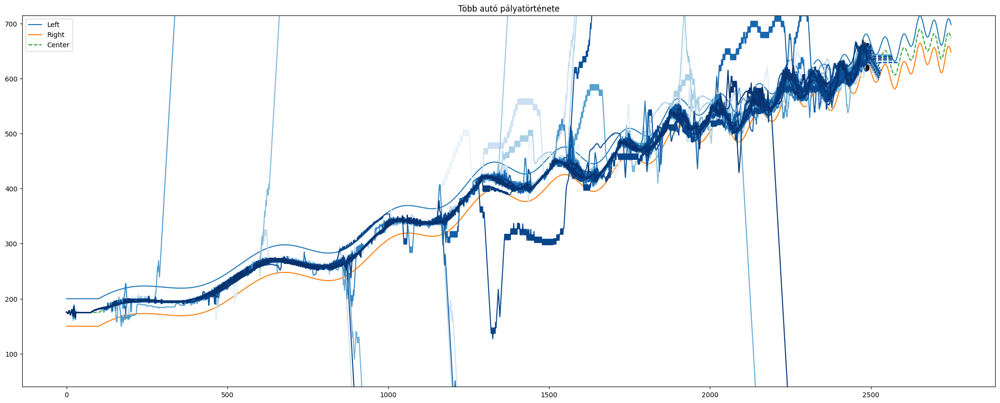

In [292]:
cars = [experiments[e]['auto'] for e in experiments]
plot_multiple_histories(cars, show_y_distance=False, legend=False)


cars_in_experiment['exp1'] = copy.deepcopy(cars)

# Save
with open('Experiments/cars_exp1.pkl', 'wb') as f:
    pickle.dump(cars, f)

# Load
with open('Experiments/cars_exp1.pkl', 'rb') as f:
    cars = pickle.load(f)


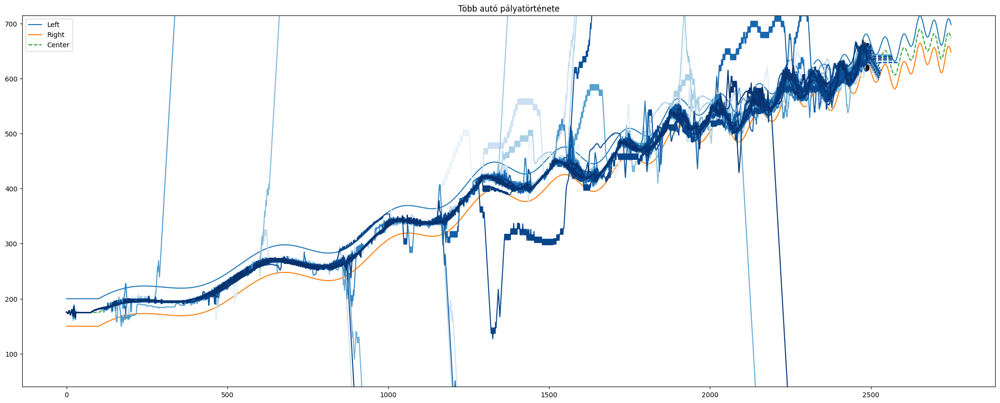

In [150]:
# cars = [experiments[e]['auto'] for e in experiments]
cars = [experiments[e]['auto'] for i, e in enumerate(experiments) if i not in para_futasok]
plot_multiple_histories(cars, show_y_distance=False, legend=False)


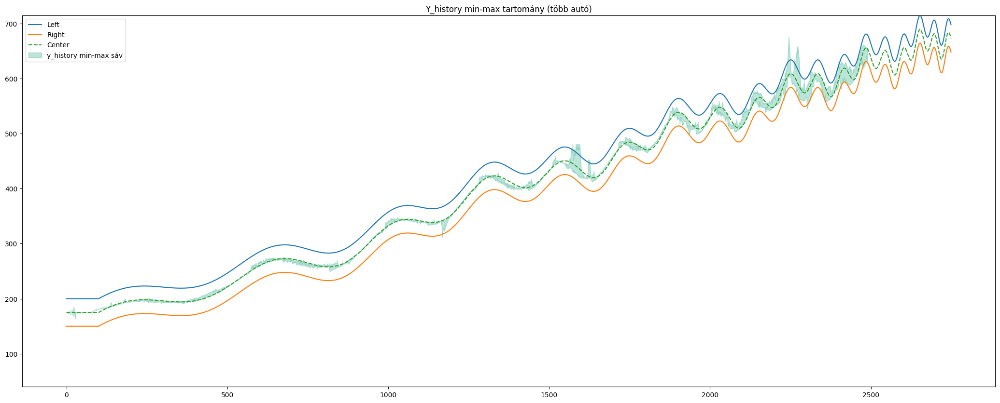

In [151]:
cars = [experiments[e]['auto'] for e in list(experiments)[:5]]
plot_multiple_histories_fill(cars, show_y_distance=False)

min_ien             2490
all_histories.shape (100, 2490)
y_mean.shape        (2490,)
y_std.shape         (2490,)


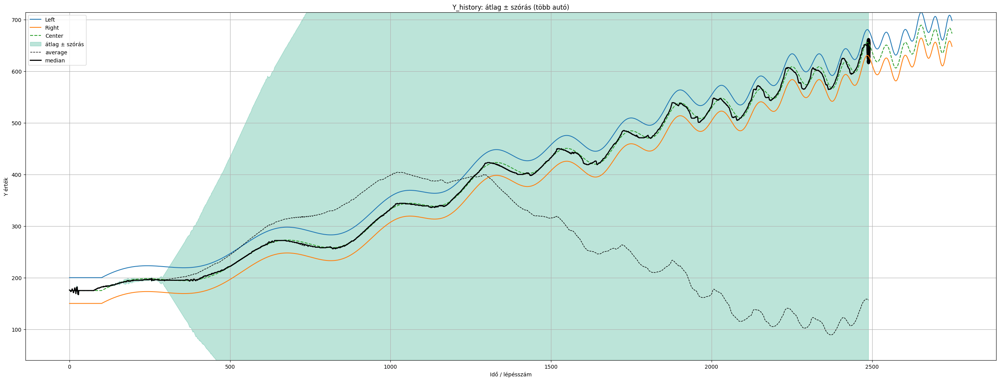

In [152]:
cars = [experiments[e]['auto'] for i, e in enumerate(experiments) if i not in para_futasok]
plot_multiple_histories_bolinger(cars, show_y_distance=False)

[    6023.3     6729.8     7862.3     6409.5     7456.6     7002.3
  1489717.1     6286.3  8352822.      7796.1     7841.6     5955.6
     8858.5     6737.2     5853.5     6239.1     8798.5     7656.7
     7293.9     6949.6  7891735.      6939.3     5815.4     6811.1
 11266466.   4154998.4     5845.2  8124867.      7269.6     5897.1
     7017.2  3689515.5     6186.6    17542.3     9254.9    11797.3
     6992.3     6791.5     6795.4  6329018.      6488.1     6518.7
     7327.5     7238.7     6511.8  7443291.      7944.      6062.6
 11116738.      7785.2     9293.5   763667.3     6655.7     7477.
     5920.2    18249.2     7564.5  6792782.      8244.8     5819.3
     9185.5     8119.2     5637.5     6596.4     6519.7     6908.2
     6599.5     5545.7     6132.3     5470.9     8090.5     6967.2
     7248.4     7790.5     6581.3     6196.8     7476.7  8253942.
    39095.6     6458.8     7311.9     6346.      5736.4     5478.5
     5374.5     6110.5    10881.8  3838190.5     8475.1     8118

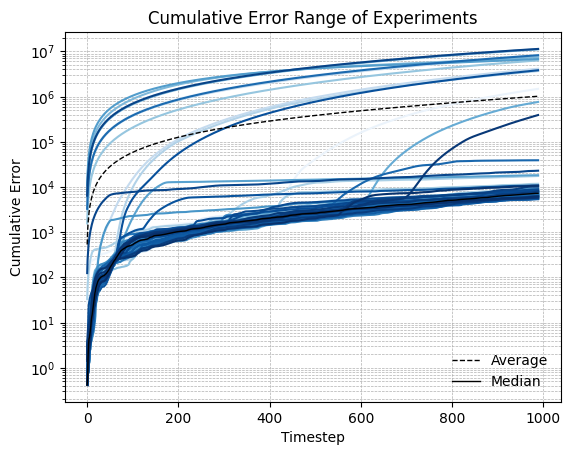

------------------------------------
Végeredményben ez a meghatáró mérés 
------------------------------------
Cumulatív hibák átlagának vége      
------------------------------------
avg = 1019472.34
med = 7281.77
std = 2706311.99


In [153]:

_override_end = 1500

exp_cut_cum_err = []
exp_cut_cum_err_final_value = []

# Végig megyek a kisérletben szereplő car elemeken hogy kinyerjem belőlük a futás során mért hibákat
for car in cars:
    # Teljes cummulativ hiba egy adott auto futása esetén
    err = np.cumsum(np.abs(car.y_distance))
    # print(f'cum sum err vége: {err[-1]:.2f}')
    
    # Csak a bemozgatás utáni rész és a vége közötti különgség érdekel.
    err = np.cumsum(np.abs(car.y_distance[_override_end:]))             # ez egy cumsum array nem peidig egy konkrét szám
    # print(f'cum sum err vége: {err[-1]:.2f}')

    exp_cut_cum_err.append(err)
    exp_cut_cum_err_final_value.append(err[-1])
    
# A cumulatív hibák listája
exp_cut_cum_err = np.array(exp_cut_cum_err)               # .shape -> (30, 990) (kisérletek száma, _override_end-től mért szakasz a végéig)

# A cumulativ hibák utolsó értékének listája
exp_cut_cum_err_final_value = np.array(exp_cut_cum_err_final_value)  # .shape -> (30,)

with np.printoptions(precision=1, suppress=True):
    print(exp_cut_cum_err_final_value)

with np.printoptions(precision=1, suppress=True):
    print(exp_cut_cum_err)

# -----------------------------------------------

# Lehet hogy itt még valami area plotal lehetne próbálkozni ami azt mutatja meg hogy melyik volt a mamimum és a minimum az adott experimentben
exp_cut_cum_err_avg = np.mean(exp_cut_cum_err, axis=0)
exp_cut_cum_err_min = np.min(exp_cut_cum_err, axis=0)
exp_cut_cum_err_max = np.max(exp_cut_cum_err, axis=0)
exp_cut_cum_err_std = np.std(exp_cut_cum_err, axis=0)
exp_cut_cum_err_med = np.median(exp_cut_cum_err, axis=0)

x = np.arange(exp_cut_cum_err.shape[1])  # időlépések

# Ez a blue amin minden mérés rajta van és még ráteszem az Átlagot, a Min-Max értéket és a Mediánt
cmap = cm.get_cmap('Blues', exp_cut_cum_err.shape[0]) # 'viridis', 'plasma', 'Blues', 'Purples'
plt.figure()
for i in range(exp_cut_cum_err.shape[0]):
    # plt.plot(exp_cut_cum_err[i], color=cmap(i), label=f'{i}')
    plt.plot(exp_cut_cum_err[i], color=cmap(i))
plt.plot(x, exp_cut_cum_err_avg, color='black', lw=1.0, ls='--', label='Average')
plt.plot(x, exp_cut_cum_err_med, color='black', lw=1.0, label='Median')
plt.yscale('log')
plt.title('Cumulative Error Range of Experiments')
plt.xlabel('Timestep')
plt.ylabel('Cumulative Error')
# plt.grid(True, which='major', ls='--', lw=0.5)
plt.grid(True, which='both', ls='--', lw=0.5)
plt.legend(frameon=False)
plt.show()

print('------------------------------------')
print('Végeredményben ez a meghatáró mérés ')
print('------------------------------------')
print('Cumulatív hibák átlagának vége      ')
print('------------------------------------')

print(f'avg = {exp_cut_cum_err_avg[-1]:.2f}')
print(f'med = {exp_cut_cum_err_med[-1]:.2f}')
print(f'std = {exp_cut_cum_err_std[-1]:.2f}')


exp1 = {}
exp1['exp_cut_cum_err'] = copy.deepcopy(exp_cut_cum_err)
exp1['exp_cut_cum_err_avg'] = copy.deepcopy(exp_cut_cum_err_avg)
exp1['exp_cut_cum_err_min'] = copy.deepcopy(exp_cut_cum_err_min)
exp1['exp_cut_cum_err_max'] = copy.deepcopy(exp_cut_cum_err_max)
exp1['exp_cut_cum_err_std'] = copy.deepcopy(exp_cut_cum_err_std)
exp1['exp_cut_cum_err_med'] = copy.deepcopy(exp_cut_cum_err_med)
exp1['last_exp_cut_cum_err_avg'] = copy.deepcopy(exp_cut_cum_err_avg[-1])
exp1['last_exp_cut_cum_err_med'] = copy.deepcopy(exp_cut_cum_err_med[-1])
exp1['last_exp_cut_cum_err_std'] = copy.deepcopy(exp_cut_cum_err_std[-1])


In [154]:
# Save
with open('Experiments/exp1.pkl', 'wb') as f:
    pickle.dump(exp1, f)

# Load
with open('Experiments/exp1.pkl', 'rb') as f:
    exp1 = pickle.load(f)

<a name='experiment_2'></a>

[log](#log) [car](#car) [run](#run) [zip](#zip)

[Setup](#setup_current_train)

[Experiments](#experiments)

[Experiment 1](#experiment_1) | [Experiment 2](#experiment_2)

[Top](#top)

# <font color='red'>(2.) Small (5, 3) Net with move</font>

# --------------------- road Description ----------------------------
  		 road.length =  2750
  		 minimum slope (descending) =  -3.2174072638526923
  		 maximum slope (ascending)  =   3.456286285863712
# -----------------------------------------------------------------
FixScalerCenteredMax self.offset 25.0


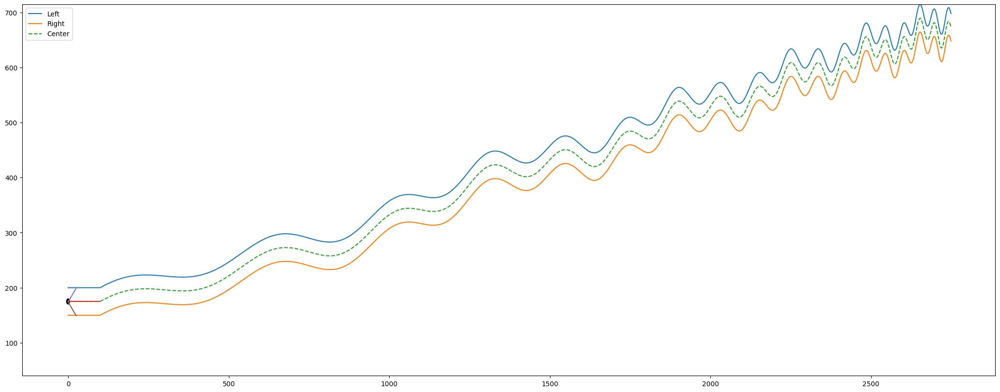

 --------------- plot --------------- 


In [155]:
road = Road2a(wide=50,
              length=2750,
              a=300, a_min=75,
              b=300, b_min=75,
              c=100, c_min=25,
              a1=10,
              b1=10,
              c1=20,
              b2=0.2,
              s=130,
              p=100)

plotter = Plotter()
platter = Platter()
storage = Storage()

settings = {
    'hidden_layer_sizes': (5, 3),     # (5, 3)
    'learning_rate_init': 0.01,       # 0.01, 0.0001
    'solver': 'adam',                 # sgd, adam
    'activation': 'tanh',             # tanh, relu, logistic
    'nesterovs_momentum': False,
    'max_iter': 5,                    # 1
    'fit_intercept': False,           # Legyen-e intercept a LinearRegression
    'action_range': (10, 1),           # A lehtséges lépések sávja (-7, ..., +7) és a lépésköz
    'scaler_type': 'FixCenteredMax',             # None, MinMax, Standard, Fix, FixCenteredMax, Cut, Log, SignedLog, Reciprocal, Robust, Quantile
    'feature_range': (20, 20),        # Fix esetén az első az X, a második az y osztója (25, 75), !(25, 25), !(55, 55) (25, 10)
    'feature_range_centered_max_maximum': 50, # Fix CM esetén ez az érték a maximum ameddig a sensor lát
    'multi_sensor_regression': True,  # Ture
    'stop_external_move_at_i': 30,   # Ennyi lépés után már ne csináljon mesterséges mozgatást (30)
    'dynamic_external_step': True,
    'ridge_regression_alpha': 1.0,    # 1.0
    'random_state': 1,
#    'plot_y_min': 0,
#    'plot_y_max': 1200,
}

auto = ConstantActionCar(
    road=road,
    plotter=plotter,
    platter=platter,
    storage=storage,
    settings=settings,
    override_start_i=200,                           # <---------------------- ezek amik az (1.) kisérlethez képest változznak
    override_end_i=1500,                            # <---------------------- ezek amik az (1.) kisérlethez képest változznak
    override_value=10,                              # <---------------------- ezek amik az (1.) kisérlethez képest változznak
    artificial_jump_interval=3                      # <---------------------- ezek amik az (1.) kisérlethez képest változznak
)

auto.sight = 250
auto.sight_center = 100 # 250

auto.calculate_distances()
auto.platter.plot_history(auto, 1)

In [156]:
%%time

experiments = {}

for i in range(__SIM_N):
    settings['random_state'] = i

    auto = ConstantActionCar(
    road=road,
    plotter=plotter,
    platter=platter,
    storage=storage,
    settings=settings,
    override_start_i=200,                           # <---------------------- ezek amik az (1.) kisérlethez képest változznak
    override_end_i=1500,                            # <---------------------- ezek amik az (1.) kisérlethez képest változznak
    override_value=10,                              # <---------------------- ezek amik az (1.) kisérlethez képest változznak
    artificial_jump_interval=3                      # <---------------------- ezek amik az (1.) kisérlethez képest változznak
)
    
    auto.sight = 250
    auto.sight_center = 100
    
    auto.calculate_distances()
    auto.mlp.verbose = False
    printer._nf = False
    printer._ut = False
    auto.print_rate = 90000
    
    start_time = time.time()
    auto.run(2490, artificial_jump=False)
    end_time = time.time()
    duration = end_time - start_time
    print(f'# {i} run metódus futási ideje: {duration:.3f} másodperc')
    
    
    err = np.cumsum(np.abs(auto.y_distance))
    print(f'cum sum err vége: {err[-1]:.2f}')
    
    experiments[i] = {
        'i': i,
        'settings': copy.deepcopy(settings),
        'auto': copy.deepcopy(auto)
    }

FixScalerCenteredMax self.offset 25.0
# 0 run metódus futási ideje: 31.956 másodperc
cum sum err vége: 12991.31
FixScalerCenteredMax self.offset 25.0
# 1 run metódus futási ideje: 31.299 másodperc
cum sum err vége: 12883.36
FixScalerCenteredMax self.offset 25.0
# 2 run metódus futási ideje: 31.599 másodperc
cum sum err vége: 12480.32
FixScalerCenteredMax self.offset 25.0
# 3 run metódus futási ideje: 31.197 másodperc
cum sum err vége: 15655.54
FixScalerCenteredMax self.offset 25.0
# 4 run metódus futási ideje: 29.817 másodperc
cum sum err vége: 12783.72
FixScalerCenteredMax self.offset 25.0
# 5 run metódus futási ideje: 31.916 másodperc
cum sum err vége: 12421.88
FixScalerCenteredMax self.offset 25.0
# 6 run metódus futási ideje: 31.747 másodperc
cum sum err vége: 12445.79
FixScalerCenteredMax self.offset 25.0
# 7 run metódus futási ideje: 29.721 másodperc
cum sum err vége: 11884.91
FixScalerCenteredMax self.offset 25.0
# 8 run metódus futási ideje: 31.653 másodperc
cum sum err vége: 1

# 73 run metódus futási ideje: 30.567 másodperc
cum sum err vége: 12160.40
FixScalerCenteredMax self.offset 25.0
# 74 run metódus futási ideje: 31.472 másodperc
cum sum err vége: 1040941.09
FixScalerCenteredMax self.offset 25.0
# 75 run metódus futási ideje: 31.171 másodperc
cum sum err vége: 12075.39
FixScalerCenteredMax self.offset 25.0
# 76 run metódus futási ideje: 31.193 másodperc
cum sum err vége: 12375.77
FixScalerCenteredMax self.offset 25.0
# 77 run metódus futási ideje: 29.460 másodperc
cum sum err vége: 12046.62
FixScalerCenteredMax self.offset 25.0
# 78 run metódus futási ideje: 30.761 másodperc
cum sum err vége: 13442.82
FixScalerCenteredMax self.offset 25.0
# 79 run metódus futási ideje: 31.212 másodperc
cum sum err vége: 38804.61
FixScalerCenteredMax self.offset 25.0
# 80 run metódus futási ideje: 31.049 másodperc
cum sum err vége: 12261.87
FixScalerCenteredMax self.offset 25.0
# 81 run metódus futási ideje: 31.520 másodperc
cum sum err vége: 12427.79
FixScalerCenteredMa

In [157]:
import pickle

os.makedirs("Experiments", exist_ok=True)

file_path = os.path.join("Experiments", "100_experiments_5_3_net_with_move.pkl")

with open(file_path, "wb") as f:
    pickle.dump(experiments, f)


In [293]:
file_path = os.path.join("Experiments", "100_experiments_5_3_net_with_move.pkl")

with open(file_path, "rb") as f:
    # loaded_experiments = pickle.load(f)
    experiments = pickle.load(f)


In [159]:
experiments

{0: {'i': 0,
  'settings': {'hidden_layer_sizes': (5, 3),
   'learning_rate_init': 0.01,
   'solver': 'adam',
   'activation': 'tanh',
   'nesterovs_momentum': False,
   'max_iter': 5,
   'fit_intercept': False,
   'action_range': (10, 1),
   'scaler_type': 'FixCenteredMax',
   'feature_range': (20, 20),
   'feature_range_centered_max_maximum': 50,
   'multi_sensor_regression': True,
   'stop_external_move_at_i': 30,
   'dynamic_external_step': True,
   'ridge_regression_alpha': 1.0,
   'random_state': 0},
  'auto': <__main__.ConstantActionCar at 0x7a16c02c78b0>},
 1: {'i': 1,
  'settings': {'hidden_layer_sizes': (5, 3),
   'learning_rate_init': 0.01,
   'solver': 'adam',
   'activation': 'tanh',
   'nesterovs_momentum': False,
   'max_iter': 5,
   'fit_intercept': False,
   'action_range': (10, 1),
   'scaler_type': 'FixCenteredMax',
   'feature_range': (20, 20),
   'feature_range_centered_max_maximum': 50,
   'multi_sensor_regression': True,
   'stop_external_move_at_i': 30,
   'dyna

In [160]:
# for e in experiments:
#     print(e)
#     experiments[e]['auto'].platter.plot_history(experiments[e]['auto'], 1)

In [161]:

# para_futasok = (14, 16, 19, 112, 124)
para_futasok = (112, 124)


In [162]:
# for i, e in enumerate(experiments):
#     if i not in para_futasok:
#         print(e)
#         postPlotter = PostPlotter(experiments[e]['auto'])
#         postPlotter.plot_history(flag = 1, show_y_distance=True)

In [163]:
cum_errors_totals = []
nn_cum_errors_totals = []

for e in experiments:
    print(e)
    a = experiments[e]['auto']
    # a.plotter.test_plot2(a.sensor_left, a.sensor_right, a.y_distance, a.x, flag=1, lists=[6])
    y_real = np.array(a.y_distance_real).flatten()
    y_pred = np.array(a.y_distance_predicted_inv).flatten()
    y_dist = np.array(a.y_distance)

    # Tengelytől vett eltérés értéke
    err = np.cumsum(np.abs(a.y_distance))
    cum_err = err[-1]
    cum_errors_totals.append(cum_err)
    # print(cum_err)
    
    # A neurális háló által adott becslések hibáinak cumulatív érétkei
    nn_err = np.abs(y_real - y_pred)
    nn_err_cum_sum = np.cumsum(nn_err)
    nn_cum_err = nn_err_cum_sum[-1]
    nn_cum_errors_totals.append(nn_cum_err)
    # print(nn_cum_err)

# A kisérletek végén elért cumulatív error utolsó értékeienek átlaga és szórása
cum_errors_totals = np.array(cum_errors_totals)
cum_errors_totals_avg = np.mean(cum_errors_totals)
cum_errors_totals_std = np.std(cum_errors_totals)

# A kisérletek végén a neurális háló által adott becslések hibáinak összege, átlaga és szórása
nn_cum_errors_totals = np.array(nn_cum_errors_totals)
nn_cum_errors_totals_avg = np.mean(nn_cum_errors_totals)
nn_cum_errors_totals_std = np.std(nn_cum_errors_totals)

print('A kisérletek végén elért cumulatív error utolsó értékeienek átlaga és szórása')
print(f'cum_errors_totals_avg = {cum_errors_totals_avg:.2f}')
print(f'cum_errors_totals_std = {cum_errors_totals_std:.2f}')

print('A kisérletek végén a neurális háló által adott becslések hibáinak összege, átlaga és szórása')
print(f'nn_cum_errors_totals_avg = {nn_cum_errors_totals_avg:.2f}')
print(f'nn_cum_errors_totals_std = {nn_cum_errors_totals_std:.2f}')

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
A kisérletek végén elért cumulatív error utolsó értékeienek átlaga és szórása
cum_errors_totals_avg = 203915.34
cum_errors_totals_std = 1039098.28
A kisérletek végén a neurális háló által adott becslések hibáinak összege, átlaga és szórása
nn_cum_errors_totals_avg = 104505.10
nn_cum_errors_totals_std = 525841.50


In [164]:
# Ki kell venni belőle egyet mert volt egy extrem rossz meres

In [165]:
cum_errors_totals = []
nn_cum_errors_totals = []

for i, e in enumerate(experiments):
    if i not in para_futasok:
        print(e)
        a = experiments[e]['auto']
        # a.plotter.test_plot2(a.sensor_left, a.sensor_right, a.y_distance, a.x, flag=1, lists=[6])
        y_real = np.array(a.y_distance_real).flatten()
        y_pred = np.array(a.y_distance_predicted_inv).flatten()
        y_dist = np.array(a.y_distance)

        # Tengelytől vett eltérés értéke
        err = np.cumsum(np.abs(a.y_distance))
        cum_err = err[-1]
        cum_errors_totals.append(cum_err)
        # print(cum_err)

        # A neurális háló által adott becslések hibáinak cumulatív érétkei
        nn_err = np.abs(y_real - y_pred)
        nn_err_cum_sum = np.cumsum(nn_err)
        nn_cum_err = nn_err_cum_sum[-1]
        nn_cum_errors_totals.append(nn_cum_err)
        # print(nn_cum_err)

# A kisérletek végén elért cumulatív error utolsó értékeienek átlaga és szórása
cum_errors_totals = np.array(cum_errors_totals)
cum_errors_totals_avg = np.mean(cum_errors_totals)
cum_errors_totals_std = np.std(cum_errors_totals)

# A kisérletek végén a neurális háló által adott becslések hibáinak összege, átlaga és szórása
nn_cum_errors_totals = np.array(nn_cum_errors_totals)
nn_cum_errors_totals_avg = np.mean(nn_cum_errors_totals)
nn_cum_errors_totals_std = np.std(nn_cum_errors_totals)

print('A kisérletek végén elért cumulatív error utolsó értékeienek átlaga és szórása')
print(f'cum_errors_totals_avg = {cum_errors_totals_avg:.2f}')
print(f'cum_errors_totals_std = {cum_errors_totals_std:.2f}')

print('A kisérletek végén a neurális háló által adott becslések hibáinak összege, átlaga és szórása')
print(f'nn_cum_errors_totals_avg = {nn_cum_errors_totals_avg:.2f}')
print(f'nn_cum_errors_totals_std = {nn_cum_errors_totals_std:.2f}')

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
A kisérletek végén elért cumulatív error utolsó értékeienek átlaga és szórása
cum_errors_totals_avg = 203915.34
cum_errors_totals_std = 1039098.28
A kisérletek végén a neurális háló által adott becslések hibáinak összege, átlaga és szórása
nn_cum_errors_totals_avg = 104505.10
nn_cum_errors_totals_std = 525841.50


In [166]:
# for i, e in enumerate(experiments):
#     if i not in para_futasok:
#         print(e)
#         a = experiments[e]['auto']
#         a.plotter.test_plot2(a, a.x, flag=1, lists=[6], force=True)

In [167]:
# output_dir = 'Results2'
# fileName = 'temp2'
# dpi = 80
# 
# for i, e in enumerate(experiments):
#     if i not in para_futasok:
#         print(e)
#         a = experiments[e]['auto']
#         plot_current_predicted_vs_current_true_dist_during_traing(a, output_dir, fileName, dpi, i=i)

In [168]:
# for i, e in enumerate(experiments):
#     if i not in para_futasok:
#         print(e)
#         a = experiments[e]['auto']
#         plot_satter_pred_during_training_vs_tru_y_distance(a, output_dir, fileName, dpi)

In [169]:
# for i, e in enumerate(experiments):
#     if i not in para_futasok:
#         print(e)
#         a = experiments[e]['auto']
#         plot_satter_pred_during_training_vs_tru_y_distance_hist(a, output_dir, fileName, dpi)

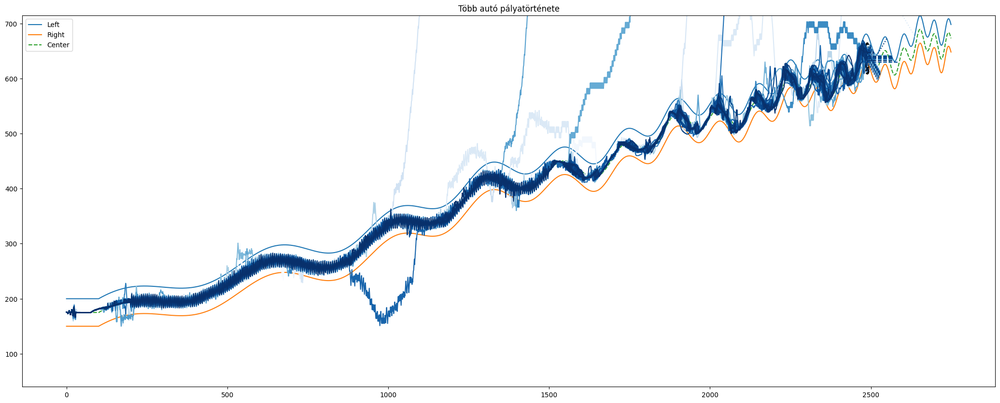

In [294]:
cars = [experiments[e]['auto'] for e in experiments]
plot_multiple_histories(cars, show_y_distance=False, legend=False)

cars_in_experiment['exp2'] = copy.deepcopy(cars)

# Save
with open('Experiments/cars_exp2.pkl', 'wb') as f:
    pickle.dump(cars, f)

# Load
with open('Experiments/cars_exp2.pkl', 'rb') as f:
    cars = pickle.load(f)


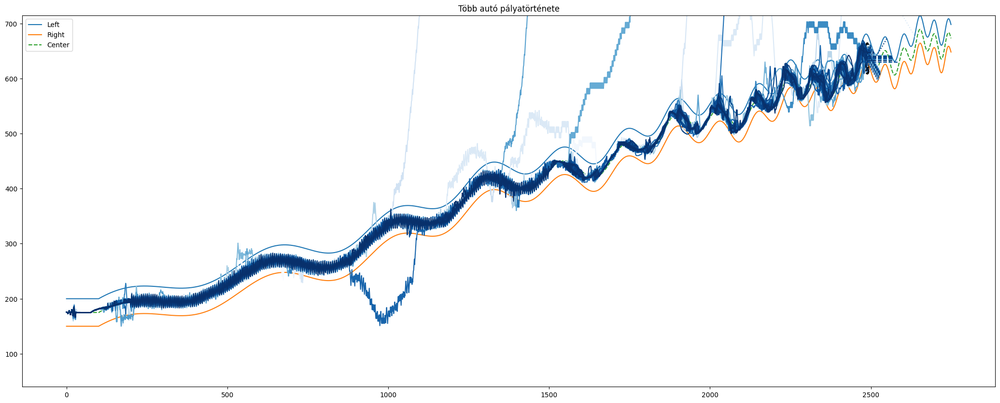

In [171]:
# cars = [experiments[e]['auto'] for e in experiments]
cars = [experiments[e]['auto'] for i, e in enumerate(experiments) if i not in para_futasok]
plot_multiple_histories(cars, show_y_distance=False, legend=False)


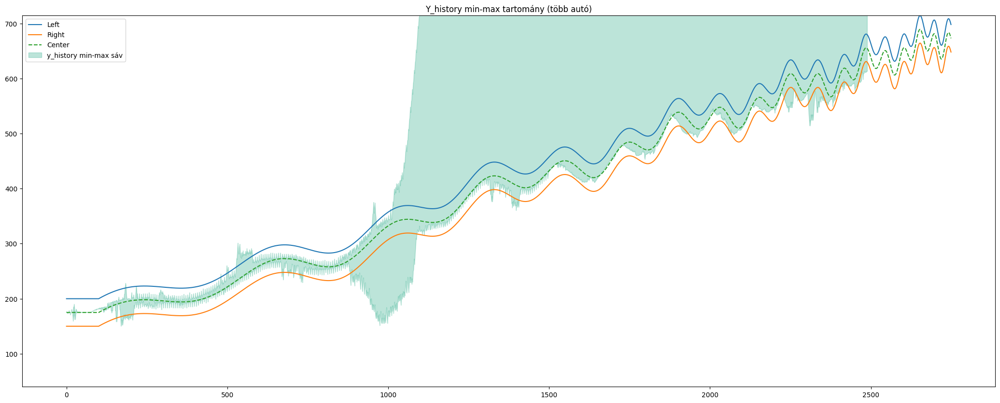

In [172]:
# cars = [experiments[e]['auto'] for e in experiments]
cars = [experiments[e]['auto'] for i, e in enumerate(experiments) if i not in para_futasok]
plot_multiple_histories_fill(cars, show_y_distance=False)


min_ien             2490
all_histories.shape (100, 2490)
y_mean.shape        (2490,)
y_std.shape         (2490,)


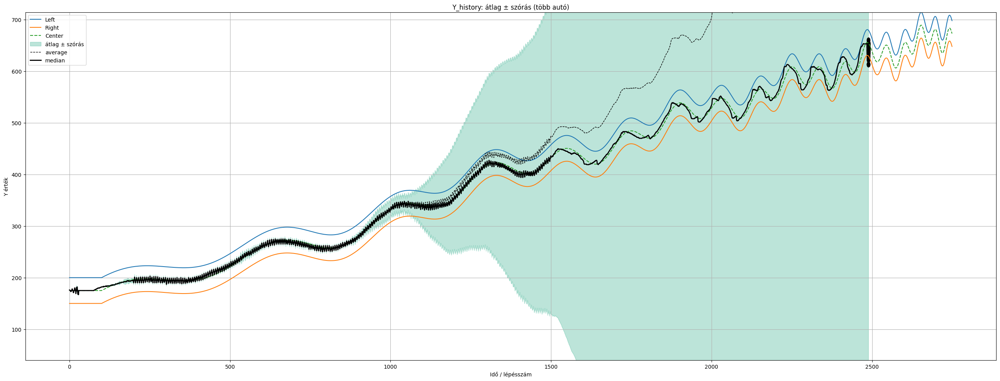

In [173]:
cars = [experiments[e]['auto'] for i, e in enumerate(experiments) if i not in para_futasok]
plot_multiple_histories_bolinger(cars, show_y_distance=False)


min_ien             2490
all_histories.shape (100, 2490)
y_mean.shape        (2490,)
y_std.shape         (2490,)


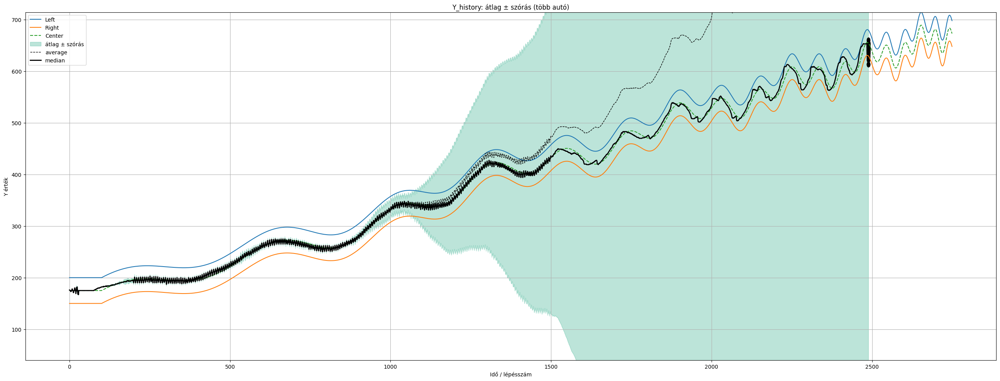

In [174]:
cars = [experiments[e]['auto'] for i, e in enumerate(experiments) if i not in para_futasok]
plot_multiple_histories_bolinger(cars, show_y_distance=False)


[   6956.7    7542.5    6776.8   10474.4    7179.     7339.5    6970.5
    6587.1    7284.8    7564.4    6919.5    7275.2    7462.8    7347.8
   52600.     7793.4 1267445.6    7695.8    6999.6 7704158.     6824.1
    6997.3    7589.     6974.1    6907.5    6641.2    6593.9    8000.4
    7010.6    9161.4    7372.1    5880.1    6742.1    6153.1    7052.2
    7391.7    5466.5    7152.6    8167.7    7185.9    7881.     7874.2
    6615.9    6604.7    5885.6    6646.4    7179.5    7739.6    9522.3
    7106.     7705.4 2797047.8    6282.1    7562.     7429.9 5528668.
    7219.4    8181.5    6769.9    6012.2    6247.1    7597.4    8301.6
    7444.9   21911.8    6969.5    7042.7    6430.4    7277.6    7535.9
    8037.4    7092.7    6300.8    6781.2 1035245.4    6969.5    7052.5
    6673.1    7726.2    9135.8    7155.     7116.1    7075.2    6608.7
    7437.2    6662.2    7043.6    7728.6    6272.3    6421.6    9106.2
    6768.1    6941.1    7752.5    5770.4    6688.2    7597.2    6991.6
    633

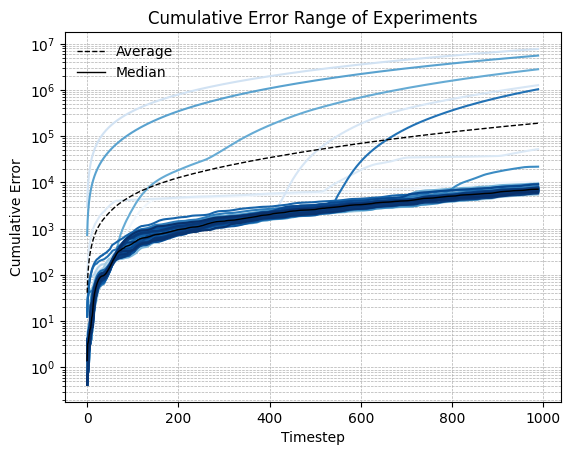

------------------------------------
Végeredményben ez a meghatáró mérés 
------------------------------------
Cumulatív hibák átlagának vége      
------------------------------------
avg = 190748.99
med = 7134.36
std = 983826.36


In [175]:

_override_end = 1500

exp_cut_cum_err = []
exp_cut_cum_err_final_value = []

# Végig megyek a kisérletben szereplő car elemeken hogy kinyerjem belőlük a futás során mért hibákat
for car in cars:
    # Teljes cummulativ hiba egy adott auto futása esetén
    err = np.cumsum(np.abs(car.y_distance))
    # print(f'cum sum err vége: {err[-1]:.2f}')
    
    # Csak a bemozgatás utáni rész és a vége közötti különgség érdekel.
    err = np.cumsum(np.abs(car.y_distance[_override_end:]))             # ez egy cumsum array nem peidig egy konkrét szám
    # print(f'cum sum err vége: {err[-1]:.2f}')

    exp_cut_cum_err.append(err)
    exp_cut_cum_err_final_value.append(err[-1])
    
# A cumulatív hibák listája
exp_cut_cum_err = np.array(exp_cut_cum_err)               # .shape -> (30, 990) (kisérletek száma, _override_end-től mért szakasz a végéig)

# A cumulativ hibák utolsó értékének listája
exp_cut_cum_err_final_value = np.array(exp_cut_cum_err_final_value)  # .shape -> (30,)

with np.printoptions(precision=1, suppress=True):
    print(exp_cut_cum_err_final_value)

with np.printoptions(precision=1, suppress=True):
    print(exp_cut_cum_err)

# -----------------------------------------------

# Lehet hogy itt még valami area plotal lehetne próbálkozni ami azt mutatja meg hogy melyik volt a mamimum és a minimum az adott experimentben
exp_cut_cum_err_avg = np.mean(exp_cut_cum_err, axis=0)
exp_cut_cum_err_min = np.min(exp_cut_cum_err, axis=0)
exp_cut_cum_err_max = np.max(exp_cut_cum_err, axis=0)
exp_cut_cum_err_std = np.std(exp_cut_cum_err, axis=0)
exp_cut_cum_err_med = np.median(exp_cut_cum_err, axis=0)

x = np.arange(exp_cut_cum_err.shape[1])  # időlépések

# Ez a blue amin minden mérés rajta van és még ráteszem az Átlagot, a Min-Max értéket és a Mediánt
cmap = cm.get_cmap('Blues', exp_cut_cum_err.shape[0]) # 'viridis', 'plasma', 'Blues', 'Purples'
plt.figure()
for i in range(exp_cut_cum_err.shape[0]):
    # plt.plot(exp_cut_cum_err[i], color=cmap(i), label=f'{i}')
    plt.plot(exp_cut_cum_err[i], color=cmap(i))
plt.plot(x, exp_cut_cum_err_avg, color='black', lw=1.0, ls='--', label='Average')
plt.plot(x, exp_cut_cum_err_med, color='black', lw=1.0, label='Median')
plt.yscale('log')
plt.title('Cumulative Error Range of Experiments')
plt.xlabel('Timestep')
plt.ylabel('Cumulative Error')
# plt.grid(True, which='major', ls='--', lw=0.5)
plt.grid(True, which='both', ls='--', lw=0.5)
plt.legend(frameon=False)
plt.show()

print('------------------------------------')
print('Végeredményben ez a meghatáró mérés ')
print('------------------------------------')
print('Cumulatív hibák átlagának vége      ')
print('------------------------------------')

print(f'avg = {exp_cut_cum_err_avg[-1]:.2f}')
print(f'med = {exp_cut_cum_err_med[-1]:.2f}')
print(f'std = {exp_cut_cum_err_std[-1]:.2f}')


exp2 = {}
exp2['exp_cut_cum_err'] = copy.deepcopy(exp_cut_cum_err)
exp2['exp_cut_cum_err_avg'] = copy.deepcopy(exp_cut_cum_err_avg)
exp2['exp_cut_cum_err_min'] = copy.deepcopy(exp_cut_cum_err_min)
exp2['exp_cut_cum_err_max'] = copy.deepcopy(exp_cut_cum_err_max)
exp2['exp_cut_cum_err_std'] = copy.deepcopy(exp_cut_cum_err_std)
exp2['exp_cut_cum_err_med'] = copy.deepcopy(exp_cut_cum_err_med)
exp2['last_exp_cut_cum_err_avg'] = copy.deepcopy(exp_cut_cum_err_avg[-1])
exp2['last_exp_cut_cum_err_med'] = copy.deepcopy(exp_cut_cum_err_med[-1])
exp2['last_exp_cut_cum_err_std'] = copy.deepcopy(exp_cut_cum_err_std[-1])



In [176]:
# Save
with open('Experiments/exp2.pkl', 'wb') as f:
    pickle.dump(exp2, f)

# Load
with open('Experiments/exp2.pkl', 'rb') as f:
    exp2 = pickle.load(f)

[Experiment_1](#experiment_1)

<a name='experiment_4'></a>

[log](#log) [car](#car) [run](#run) [zip](#zip)

[Setup](#setup_current_train)

[Experiments](#experiments)

[Experiment 1](#experiment_1) | [Experiment 2](#experiment_2)

[Top](#top)

# <font color='red'>(3.) Large (10, 5) Net without move</font>

# --------------------- road Description ----------------------------
  		 road.length =  2750
  		 minimum slope (descending) =  -3.2174072638526923
  		 maximum slope (ascending)  =   3.456286285863712
# -----------------------------------------------------------------
FixScalerCenteredMax self.offset 25.0


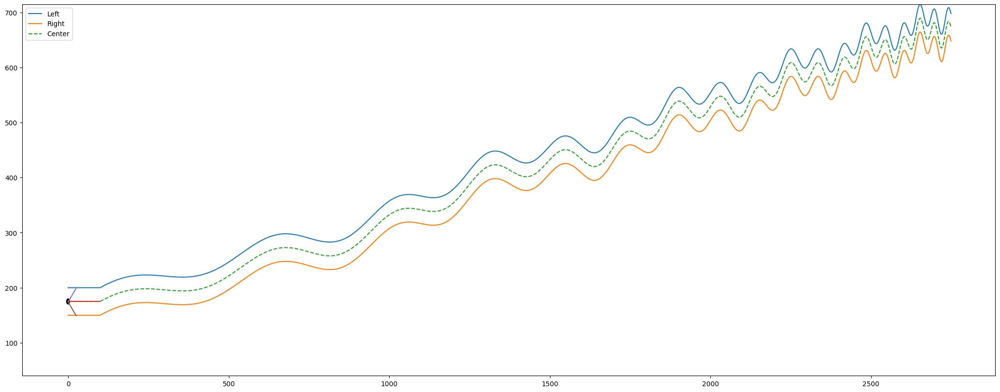

 --------------- plot --------------- 


In [177]:
road = Road2a(wide=50,
              length=2750,
              a=300, a_min=75,
              b=300, b_min=75,
              c=100, c_min=25,
              a1=10,
              b1=10,
              c1=20,
              b2=0.2,
              s=130,
              p=100)

plotter = Plotter()
platter = Platter()
storage = Storage()

settings = {
    'hidden_layer_sizes': (10, 5),     # (5, 3)
    'learning_rate_init': 0.01,       # 0.01, 0.0001
    'solver': 'adam',                 # sgd, adam
    'activation': 'tanh',             # tanh, relu, logistic
    'nesterovs_momentum': False,
    'max_iter': 5,                    # 1
    'fit_intercept': False,           # Legyen-e intercept a LinearRegression
    'action_range': (10, 1),           # A lehtséges lépések sávja (-7, ..., +7) és a lépésköz
    'scaler_type': 'FixCenteredMax',             # None, MinMax, Standard, Fix, FixCenteredMax, Cut, Log, SignedLog, Reciprocal, Robust, Quantile
    'feature_range': (20, 20),        # Fix esetén az első az X, a második az y osztója (25, 75), !(25, 25), !(55, 55) (25, 10)
    'feature_range_centered_max_maximum': 50, # Fix CM esetén ez az érték a maximum ameddig a sensor lát
    'multi_sensor_regression': True,  # Ture
    'stop_external_move_at_i': 30,   # Ennyi lépés után már ne csináljon mesterséges mozgatást (30)
    'dynamic_external_step': True,
    'ridge_regression_alpha': 1.0,    # 1.0
    'random_state': 1,
#    'plot_y_min': 0,
#    'plot_y_max': 1200,
}

auto = ConstantActionCar(
    road=road,
    plotter=plotter,
    platter=platter,
    storage=storage,
    settings=settings,
    override_start_i=30000,                           # <---------------------- ezek amik az (1.) kisérlethez képest változznak
    override_end_i=160000,                            # <---------------------- ezek amik az (1.) kisérlethez képest változznak
    override_value=0,                              # <---------------------- ezek amik az (1.) kisérlethez képest változznak
    artificial_jump_interval=3                      # <---------------------- ezek amik az (1.) kisérlethez képest változznak
)

auto.sight = 250
auto.sight_center = 100 # 250

auto.calculate_distances()
auto.platter.plot_history(auto, 1)

In [178]:
%%time

experiments = {}

for i in range(__SIM_N):
    settings['random_state'] = i

    auto = ConstantActionCar(
    road=road,
    plotter=plotter,
    platter=platter,
    storage=storage,
    settings=settings,
    override_start_i=30000,                           # <---------------------- ezek amik az (1.) kisérlethez képest változznak
    override_end_i=160000,                            # <---------------------- ezek amik az (1.) kisérlethez képest változznak
    override_value=0,                              # <---------------------- ezek amik az (1.) kisérlethez képest változznak
    artificial_jump_interval=3                      # <---------------------- ezek amik az (1.) kisérlethez képest változznak
)
    
    auto.sight = 250    # 500
    auto.sight_center = 100
    
    auto.calculate_distances()
    auto.mlp.verbose = False
    printer._nf = False
    printer._ut = False
    auto.print_rate = 90000
    
    start_time = time.time()
    auto.run(2490, artificial_jump=False)
    end_time = time.time()
    duration = end_time - start_time
    print(f'# {i} run metódus futási ideje: {duration:.3f} másodperc')
    
    
    err = np.cumsum(np.abs(auto.y_distance))
    print(f'cum sum err vége: {err[-1]:.2f}')
    
    experiments[i] = {
        'i': i,
        'settings': copy.deepcopy(settings),
        'auto': copy.deepcopy(auto)
    }

FixScalerCenteredMax self.offset 25.0
# 0 run metódus futási ideje: 31.693 másodperc
cum sum err vége: 9433.72
FixScalerCenteredMax self.offset 25.0
# 1 run metódus futási ideje: 32.614 másodperc
cum sum err vége: 8865099.36
FixScalerCenteredMax self.offset 25.0
# 2 run metódus futási ideje: 32.409 másodperc
cum sum err vége: 10385.89
FixScalerCenteredMax self.offset 25.0
# 3 run metódus futási ideje: 32.091 másodperc
cum sum err vége: 14627.23
FixScalerCenteredMax self.offset 25.0
# 4 run metódus futási ideje: 32.320 másodperc
cum sum err vége: 3492652.70
FixScalerCenteredMax self.offset 25.0
# 5 run metódus futási ideje: 33.464 másodperc
cum sum err vége: 8884487.75
FixScalerCenteredMax self.offset 25.0
# 6 run metódus futási ideje: 32.134 másodperc
cum sum err vége: 9177.88
FixScalerCenteredMax self.offset 25.0
# 7 run metódus futási ideje: 32.051 másodperc
cum sum err vége: 10760.99
FixScalerCenteredMax self.offset 25.0
# 8 run metódus futási ideje: 32.849 másodperc
cum sum err vég

# 73 run metódus futási ideje: 33.623 másodperc
cum sum err vége: 13242.62
FixScalerCenteredMax self.offset 25.0
# 74 run metódus futási ideje: 30.927 másodperc
cum sum err vége: 9680.49
FixScalerCenteredMax self.offset 25.0
# 75 run metódus futási ideje: 30.884 másodperc
cum sum err vége: 14487.39
FixScalerCenteredMax self.offset 25.0
# 76 run metódus futási ideje: 31.079 másodperc
cum sum err vége: 10794.55
FixScalerCenteredMax self.offset 25.0
# 77 run metódus futási ideje: 31.921 másodperc
cum sum err vége: 10107.89
FixScalerCenteredMax self.offset 25.0
# 78 run metódus futási ideje: 31.201 másodperc
cum sum err vége: 10442.09
FixScalerCenteredMax self.offset 25.0
# 79 run metódus futási ideje: 32.601 másodperc
cum sum err vége: 9895.33
FixScalerCenteredMax self.offset 25.0
# 80 run metódus futási ideje: 32.354 másodperc
cum sum err vége: 10818.17
FixScalerCenteredMax self.offset 25.0
# 81 run metódus futási ideje: 32.844 másodperc
cum sum err vége: 22814.04
FixScalerCenteredMax se

In [179]:
import pickle

os.makedirs("Experiments", exist_ok=True)

file_path = os.path.join("Experiments", "100_experiments_10_5_net_without_move.pkl")

with open(file_path, "wb") as f:
    pickle.dump(experiments, f)


In [295]:
file_path = os.path.join("Experiments", "100_experiments_10_5_net_without_move.pkl")

with open(file_path, "rb") as f:
    # loaded_experiments = pickle.load(f)
    experiments = pickle.load(f)


In [181]:
experiments

{0: {'i': 0,
  'settings': {'hidden_layer_sizes': (10, 5),
   'learning_rate_init': 0.01,
   'solver': 'adam',
   'activation': 'tanh',
   'nesterovs_momentum': False,
   'max_iter': 5,
   'fit_intercept': False,
   'action_range': (10, 1),
   'scaler_type': 'FixCenteredMax',
   'feature_range': (20, 20),
   'feature_range_centered_max_maximum': 50,
   'multi_sensor_regression': True,
   'stop_external_move_at_i': 30,
   'dynamic_external_step': True,
   'ridge_regression_alpha': 1.0,
   'random_state': 0},
  'auto': <__main__.ConstantActionCar at 0x7a15d9ccc190>},
 1: {'i': 1,
  'settings': {'hidden_layer_sizes': (10, 5),
   'learning_rate_init': 0.01,
   'solver': 'adam',
   'activation': 'tanh',
   'nesterovs_momentum': False,
   'max_iter': 5,
   'fit_intercept': False,
   'action_range': (10, 1),
   'scaler_type': 'FixCenteredMax',
   'feature_range': (20, 20),
   'feature_range_centered_max_maximum': 50,
   'multi_sensor_regression': True,
   'stop_external_move_at_i': 30,
   'dy

In [182]:
# for e in experiments:
#     print(e)
#     experiments[e]['auto'].platter.plot_history(experiments[e]['auto'], 1)

In [183]:

para_futasok = (112, 124)


In [184]:
# for i, e in enumerate(experiments):
#     if i not in para_futasok:
#         print(e)
#         postPlotter = PostPlotter(experiments[e]['auto'])
#         postPlotter.plot_history(flag = 1, show_y_distance=True)

In [185]:
cum_errors_totals = []
nn_cum_errors_totals = []

for e in experiments:
    print(e)
    a = experiments[e]['auto']
    # a.plotter.test_plot2(a.sensor_left, a.sensor_right, a.y_distance, a.x, flag=1, lists=[6])
    y_real = np.array(a.y_distance_real).flatten()
    y_pred = np.array(a.y_distance_predicted_inv).flatten()
    y_dist = np.array(a.y_distance)

    # Tengelytől vett eltérés értéke
    err = np.cumsum(np.abs(a.y_distance))
    cum_err = err[-1]
    cum_errors_totals.append(cum_err)
    # print(cum_err)
    
    # A neurális háló által adott becslések hibáinak cumulatív érétkei
    nn_err = np.abs(y_real - y_pred)
    nn_err_cum_sum = np.cumsum(nn_err)
    nn_cum_err = nn_err_cum_sum[-1]
    nn_cum_errors_totals.append(nn_cum_err)
    # print(nn_cum_err)

# A kisérletek végén elért cumulatív error utolsó értékeienek átlaga és szórása
cum_errors_totals = np.array(cum_errors_totals)
cum_errors_totals_avg = np.mean(cum_errors_totals)
cum_errors_totals_std = np.std(cum_errors_totals)

# A kisérletek végén a neurális háló által adott becslések hibáinak összege, átlaga és szórása
nn_cum_errors_totals = np.array(nn_cum_errors_totals)
nn_cum_errors_totals_avg = np.mean(nn_cum_errors_totals)
nn_cum_errors_totals_std = np.std(nn_cum_errors_totals)

print('A kisérletek végén elért cumulatív error utolsó értékeienek átlaga és szórása')
print(f'cum_errors_totals_avg = {cum_errors_totals_avg:.2f}')
print(f'cum_errors_totals_std = {cum_errors_totals_std:.2f}')

print('A kisérletek végén a neurális háló által adott becslések hibáinak összege, átlaga és szórása')
print(f'nn_cum_errors_totals_avg = {nn_cum_errors_totals_avg:.2f}')
print(f'nn_cum_errors_totals_std = {nn_cum_errors_totals_std:.2f}')

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
A kisérletek végén elért cumulatív error utolsó értékeienek átlaga és szórása
cum_errors_totals_avg = 892544.14
cum_errors_totals_std = 2223930.46
A kisérletek végén a neurális háló által adott becslések hibáinak összege, átlaga és szórása
nn_cum_errors_totals_avg = 427530.75
nn_cum_errors_totals_std = 1073212.50


In [186]:
# Ki kell venni belőle egyet mert volt egy extrem rossz meres

In [187]:
cum_errors_totals = []
nn_cum_errors_totals = []

for i, e in enumerate(experiments):
    if i not in para_futasok:
        print(e)
        a = experiments[e]['auto']
        # a.plotter.test_plot2(a.sensor_left, a.sensor_right, a.y_distance, a.x, flag=1, lists=[6])
        y_real = np.array(a.y_distance_real).flatten()
        y_pred = np.array(a.y_distance_predicted_inv).flatten()
        y_dist = np.array(a.y_distance)

        # Tengelytől vett eltérés értéke
        err = np.cumsum(np.abs(a.y_distance))
        cum_err = err[-1]
        cum_errors_totals.append(cum_err)
        # print(cum_err)

        # A neurális háló által adott becslések hibáinak cumulatív érétkei
        nn_err = np.abs(y_real - y_pred)
        nn_err_cum_sum = np.cumsum(nn_err)
        nn_cum_err = nn_err_cum_sum[-1]
        nn_cum_errors_totals.append(nn_cum_err)
        # print(nn_cum_err)

# A kisérletek végén elért cumulatív error utolsó értékeienek átlaga és szórása
cum_errors_totals = np.array(cum_errors_totals)
cum_errors_totals_avg = np.mean(cum_errors_totals)
cum_errors_totals_std = np.std(cum_errors_totals)

# A kisérletek végén a neurális háló által adott becslések hibáinak összege, átlaga és szórása
nn_cum_errors_totals = np.array(nn_cum_errors_totals)
nn_cum_errors_totals_avg = np.mean(nn_cum_errors_totals)
nn_cum_errors_totals_std = np.std(nn_cum_errors_totals)

print('A kisérletek végén elért cumulatív error utolsó értékeienek átlaga és szórása')
print(f'cum_errors_totals_avg = {cum_errors_totals_avg:.2f}')
print(f'cum_errors_totals_std = {cum_errors_totals_std:.2f}')

print('A kisérletek végén a neurális háló által adott becslések hibáinak összege, átlaga és szórása')
print(f'nn_cum_errors_totals_avg = {nn_cum_errors_totals_avg:.2f}')
print(f'nn_cum_errors_totals_std = {nn_cum_errors_totals_std:.2f}')

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
A kisérletek végén elért cumulatív error utolsó értékeienek átlaga és szórása
cum_errors_totals_avg = 892544.14
cum_errors_totals_std = 2223930.46
A kisérletek végén a neurális háló által adott becslések hibáinak összege, átlaga és szórása
nn_cum_errors_totals_avg = 427530.75
nn_cum_errors_totals_std = 1073212.50


In [188]:
# for i, e in enumerate(experiments):
#     if i not in para_futasok:
#         print(e)
#         a = experiments[e]['auto']
#         a.plotter.test_plot2(a, a.x, flag=1, lists=[6], force=True)

In [189]:
# output_dir = 'Results3'
# fileName = 'temp3'
# dpi = 80
# 
# for i, e in enumerate(experiments):
#     if i not in para_futasok:
#         print(e)
#         a = experiments[e]['auto']
#         plot_current_predicted_vs_current_true_dist_during_traing(a, output_dir, fileName, dpi, i=i)

In [190]:
# for i, e in enumerate(experiments):
#     if i not in para_futasok:
#         print(e)
#         a = experiments[e]['auto']
#         plot_satter_pred_during_training_vs_tru_y_distance(a, output_dir, fileName, dpi)

In [191]:
# for i, e in enumerate(experiments):
#     if i not in para_futasok:
#         print(e)
#         a = experiments[e]['auto']
#         plot_satter_pred_during_training_vs_tru_y_distance_hist(a, output_dir, fileName, dpi)

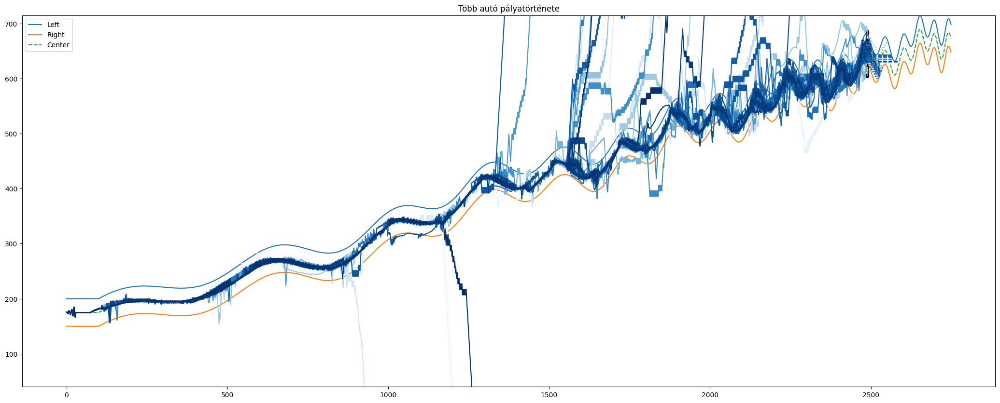

In [296]:
cars = [experiments[e]['auto'] for e in experiments]
plot_multiple_histories(cars, show_y_distance=False, legend=False)

cars_in_experiment['exp3'] = copy.deepcopy(cars)

# Save
with open('Experiments/cars_exp3.pkl', 'wb') as f:
    pickle.dump(cars, f)

# Load
with open('Experiments/cars_exp3.pkl', 'rb') as f:
    cars = pickle.load(f)


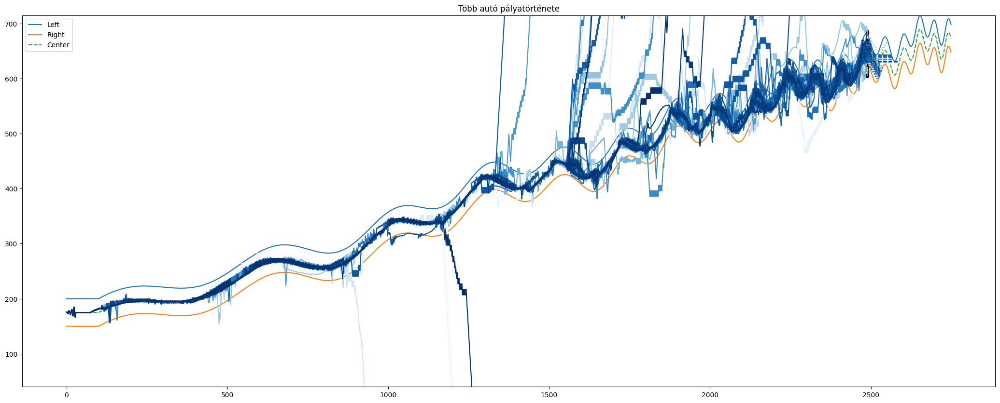

In [193]:
# cars = [experiments[e]['auto'] for e in experiments]
cars = [experiments[e]['auto'] for i, e in enumerate(experiments) if i not in para_futasok]
plot_multiple_histories(cars, show_y_distance=False, legend=False)


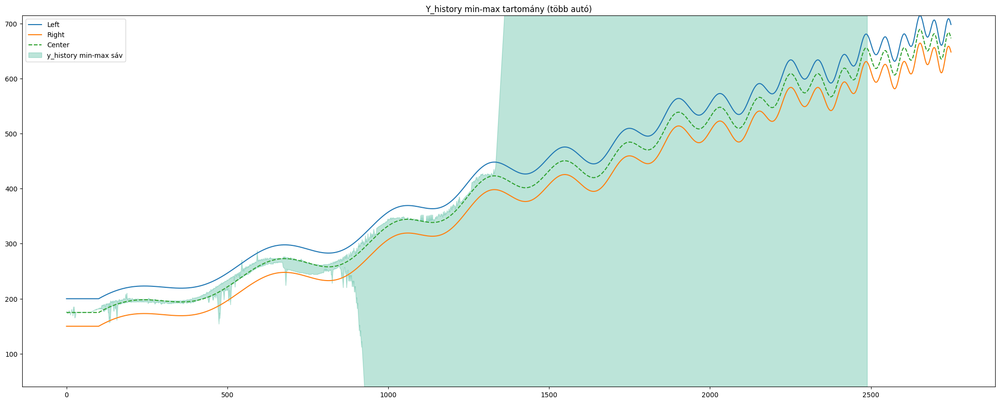

In [194]:
# cars = [experiments[e]['auto'] for e in experiments]
cars = [experiments[e]['auto'] for i, e in enumerate(experiments) if i not in para_futasok]
plot_multiple_histories_fill(cars, show_y_distance=False)


min_ien             2490
all_histories.shape (100, 2490)
y_mean.shape        (2490,)
y_std.shape         (2490,)


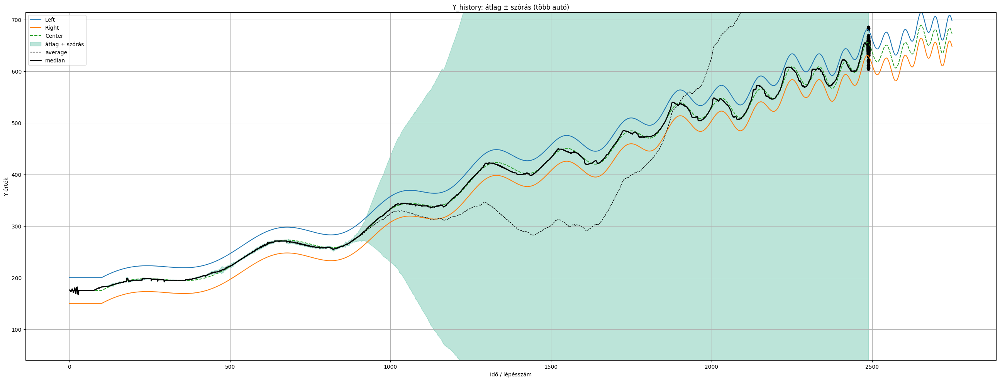

In [195]:
cars = [experiments[e]['auto'] for i, e in enumerate(experiments) if i not in para_futasok]
plot_multiple_histories_bolinger(cars, show_y_distance=False)


[    5780.   8303632.      5833.      7969.1  3489539.   8307372.
     4855.4     7106.9    13916.2     6436.4     4893.     63018.7
     6005.5     6964.5     4749.9  4069765.1 11034852.   2278373.2
    16416.5     5266.3     6062.7     6354.6     6973.9    12985.8
   548184.2     5697.5     6388.6     7673.9     6552.9     5942.1
     5689.3     6445.      4946.1  1603269.1  3593999.2     4973.7
    18116.2     7458.4     7079.4    24514.4  3121054.9     5229.1
     6454.1     4998.2     7765.9     5673.6     7455.8    10344.3
     7814.7     5782.6     5508.9     5856.7     5815.1     6407.5
     6633.1     6600.4     9113.6  3846926.1     6892.1  5279038.
     6132.4     6263.9    13799.4  2307968.3     9793.7     5706.6
     6280.4     5966.8  2986851.      6886.1     6638.      7728.2
     6249.5     8057.6     6237.8    10910.5     7152.      6787.8
     7120.      6683.3     6902.7    18872.1  2968628.2    18150.4
  6284402.     10509.      5952.9     5811.9     6180.    320510

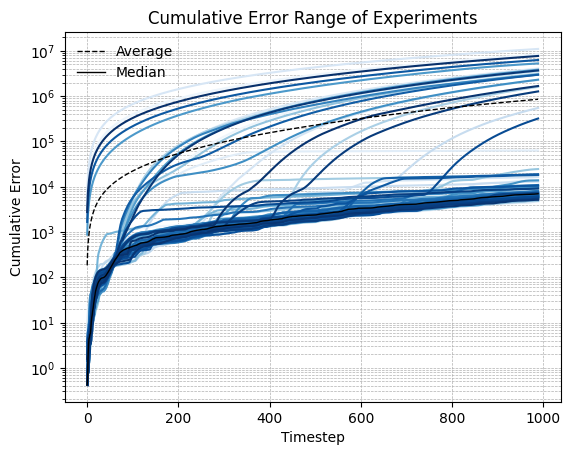

------------------------------------
Végeredményben ez a meghatáró mérés 
------------------------------------
Cumulatív hibák átlagának vége      
------------------------------------
avg = 853557.48
med = 6969.18
std = 2071720.65


In [196]:

_override_end = 1500

exp_cut_cum_err = []
exp_cut_cum_err_final_value = []

# Végig megyek a kisérletben szereplő car elemeken hogy kinyerjem belőlük a futás során mért hibákat
for car in cars:
    # Teljes cummulativ hiba egy adott auto futása esetén
    err = np.cumsum(np.abs(car.y_distance))
    # print(f'cum sum err vége: {err[-1]:.2f}')
    
    # Csak a bemozgatás utáni rész és a vége közötti különgség érdekel.
    err = np.cumsum(np.abs(car.y_distance[_override_end:]))             # ez egy cumsum array nem peidig egy konkrét szám
    # print(f'cum sum err vége: {err[-1]:.2f}')

    exp_cut_cum_err.append(err)
    exp_cut_cum_err_final_value.append(err[-1])
    
# A cumulatív hibák listája
exp_cut_cum_err = np.array(exp_cut_cum_err)               # .shape -> (30, 990) (kisérletek száma, _override_end-től mért szakasz a végéig)

# A cumulativ hibák utolsó értékének listája
exp_cut_cum_err_final_value = np.array(exp_cut_cum_err_final_value)  # .shape -> (30,)

with np.printoptions(precision=1, suppress=True):
    print(exp_cut_cum_err_final_value)

with np.printoptions(precision=1, suppress=True):
    print(exp_cut_cum_err)

# -----------------------------------------------

# Lehet hogy itt még valami area plotal lehetne próbálkozni ami azt mutatja meg hogy melyik volt a mamimum és a minimum az adott experimentben
exp_cut_cum_err_avg = np.mean(exp_cut_cum_err, axis=0)
exp_cut_cum_err_min = np.min(exp_cut_cum_err, axis=0)
exp_cut_cum_err_max = np.max(exp_cut_cum_err, axis=0)
exp_cut_cum_err_std = np.std(exp_cut_cum_err, axis=0)
exp_cut_cum_err_med = np.median(exp_cut_cum_err, axis=0)

x = np.arange(exp_cut_cum_err.shape[1])  # időlépések

# Ez a blue amin minden mérés rajta van és még ráteszem az Átlagot, a Min-Max értéket és a Mediánt
cmap = cm.get_cmap('Blues', exp_cut_cum_err.shape[0]) # 'viridis', 'plasma', 'Blues', 'Purples'
plt.figure()
for i in range(exp_cut_cum_err.shape[0]):
    # plt.plot(exp_cut_cum_err[i], color=cmap(i), label=f'{i}')
    plt.plot(exp_cut_cum_err[i], color=cmap(i))
plt.plot(x, exp_cut_cum_err_avg, color='black', lw=1.0, ls='--', label='Average')
plt.plot(x, exp_cut_cum_err_med, color='black', lw=1.0, label='Median')
plt.yscale('log')
plt.title('Cumulative Error Range of Experiments')
plt.xlabel('Timestep')
plt.ylabel('Cumulative Error')
# plt.grid(True, which='major', ls='--', lw=0.5)
plt.grid(True, which='both', ls='--', lw=0.5)
plt.legend(frameon=False)
plt.show()

print('------------------------------------')
print('Végeredményben ez a meghatáró mérés ')
print('------------------------------------')
print('Cumulatív hibák átlagának vége      ')
print('------------------------------------')

print(f'avg = {exp_cut_cum_err_avg[-1]:.2f}')
print(f'med = {exp_cut_cum_err_med[-1]:.2f}')
print(f'std = {exp_cut_cum_err_std[-1]:.2f}')


exp3 = {}
exp3['exp_cut_cum_err'] = copy.deepcopy(exp_cut_cum_err)
exp3['exp_cut_cum_err_avg'] = copy.deepcopy(exp_cut_cum_err_avg)
exp3['exp_cut_cum_err_min'] = copy.deepcopy(exp_cut_cum_err_min)
exp3['exp_cut_cum_err_max'] = copy.deepcopy(exp_cut_cum_err_max)
exp3['exp_cut_cum_err_std'] = copy.deepcopy(exp_cut_cum_err_std)
exp3['exp_cut_cum_err_med'] = copy.deepcopy(exp_cut_cum_err_med)
exp3['last_exp_cut_cum_err_avg'] = copy.deepcopy(exp_cut_cum_err_avg[-1])
exp3['last_exp_cut_cum_err_med'] = copy.deepcopy(exp_cut_cum_err_med[-1])
exp3['last_exp_cut_cum_err_std'] = copy.deepcopy(exp_cut_cum_err_std[-1])


In [197]:
# Save
with open('Experiments/exp3.pkl', 'wb') as f:
    pickle.dump(exp3, f)

# Load
with open('Experiments/exp3.pkl', 'rb') as f:
    exp3 = pickle.load(f)

<a name='experiment_4'></a>

[log](#log) [car](#car) [run](#run) [zip](#zip)

[Setup](#setup_current_train)

[Experiments](#experiments)

[Experiment 1](#experiment_1) | [Experiment 2](#experiment_2)

[Top](#top)

# <font color='red'>(4.) Large (10, 5) Net with move</font>

# --------------------- road Description ----------------------------
  		 road.length =  2750
  		 minimum slope (descending) =  -3.2174072638526923
  		 maximum slope (ascending)  =   3.456286285863712
# -----------------------------------------------------------------
FixScalerCenteredMax self.offset 25.0


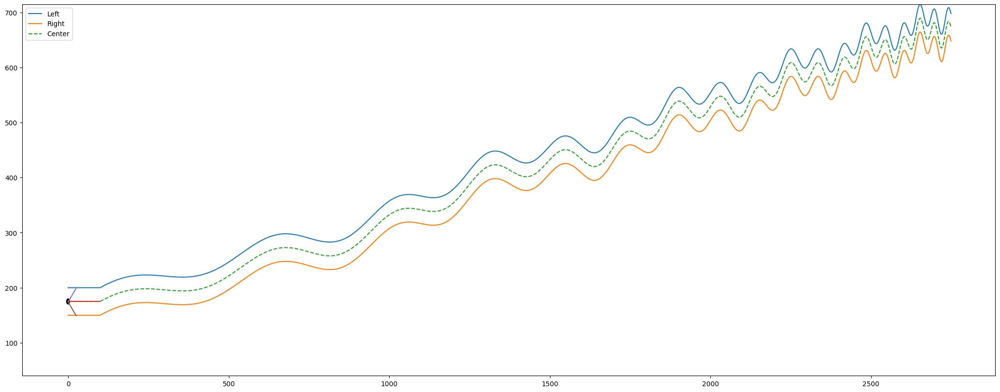

 --------------- plot --------------- 


In [198]:
road = Road2a(wide=50,
              length=2750,
              a=300, a_min=75,
              b=300, b_min=75,
              c=100, c_min=25,
              a1=10,
              b1=10,
              c1=20,
              b2=0.2,
              s=130,
              p=100)

plotter = Plotter()
platter = Platter()
storage = Storage()

settings = {
    'hidden_layer_sizes': (10, 5),     # (5, 3)
    'learning_rate_init': 0.01,       # 0.01, 0.0001
    'solver': 'adam',                 # sgd, adam
    'activation': 'tanh',             # tanh, relu, logistic
    'nesterovs_momentum': False,
    'max_iter': 5,                    # 1
    'fit_intercept': False,           # Legyen-e intercept a LinearRegression
    'action_range': (10, 1),           # A lehtséges lépések sávja (-7, ..., +7) és a lépésköz
    'scaler_type': 'FixCenteredMax',             # None, MinMax, Standard, Fix, FixCenteredMax, Cut, Log, SignedLog, Reciprocal, Robust, Quantile
    'feature_range': (20, 20),        # Fix esetén az első az X, a második az y osztója (25, 75), !(25, 25), !(55, 55) (25, 10)
    'feature_range_centered_max_maximum': 50, # Fix CM esetén ez az érték a maximum ameddig a sensor lát
    'multi_sensor_regression': True,  # Ture
    'stop_external_move_at_i': 30,   # Ennyi lépés után már ne csináljon mesterséges mozgatást (30)
    'dynamic_external_step': True,
    'ridge_regression_alpha': 1.0,    # 1.0
    'random_state': 1,
#    'plot_y_min': 0,
#    'plot_y_max': 1200,
}

auto = ConstantActionCar(
    road=road,
    plotter=plotter,
    platter=platter,
    storage=storage,
    settings=settings,
    override_start_i=200,                           # <---------------------- ezek amik az (1.) kisérlethez képest változznak
    override_end_i=1500,                            # <---------------------- ezek amik az (1.) kisérlethez képest változznak
    override_value=10,                              # <---------------------- ezek amik az (1.) kisérlethez képest változznak
    artificial_jump_interval=3                      # <---------------------- ezek amik az (1.) kisérlethez képest változznak
)

auto.sight = 250
auto.sight_center = 100 # 250

auto.calculate_distances()
auto.platter.plot_history(auto, 1)

In [199]:
%%time

experiments = {}

for i in range(__SIM_N):
    settings['random_state'] = i

    auto = ConstantActionCar(
    road=road,
    plotter=plotter,
    platter=platter,
    storage=storage,
    settings=settings,
    override_start_i=200,                           # <---------------------- ezek amik az (1.) kisérlethez képest változznak
    override_end_i=1500,                            # <---------------------- ezek amik az (1.) kisérlethez képest változznak
    override_value=10,                              # <---------------------- ezek amik az (1.) kisérlethez képest változznak
    artificial_jump_interval=3                      # <---------------------- ezek amik az (1.) kisérlethez képest változznak
)
    
    auto.sight = 250    # 500
    auto.sight_center = 100
    
    auto.calculate_distances()
    auto.mlp.verbose = False
    printer._nf = False
    printer._ut = False
    auto.print_rate = 90000
    
    start_time = time.time()
    auto.run(2490, artificial_jump=False)
    end_time = time.time()
    duration = end_time - start_time
    print(f'# {i} run metódus futási ideje: {duration:.3f} másodperc')
    
    
    err = np.cumsum(np.abs(auto.y_distance))
    print(f'cum sum err vége: {err[-1]:.2f}')
    
    experiments[i] = {
        'i': i,
        'settings': copy.deepcopy(settings),
        'auto': copy.deepcopy(auto)
    }

FixScalerCenteredMax self.offset 25.0
# 0 run metódus futási ideje: 33.020 másodperc
cum sum err vége: 11647.42
FixScalerCenteredMax self.offset 25.0
# 1 run metódus futási ideje: 31.952 másodperc
cum sum err vége: 11897.29
FixScalerCenteredMax self.offset 25.0
# 2 run metódus futási ideje: 32.993 másodperc
cum sum err vége: 12050.65
FixScalerCenteredMax self.offset 25.0
# 3 run metódus futási ideje: 31.703 másodperc
cum sum err vége: 11419.07
FixScalerCenteredMax self.offset 25.0
# 4 run metódus futási ideje: 32.626 másodperc
cum sum err vége: 12752.35
FixScalerCenteredMax self.offset 25.0
# 5 run metódus futási ideje: 31.039 másodperc
cum sum err vége: 12099.16
FixScalerCenteredMax self.offset 25.0
# 6 run metódus futási ideje: 32.658 másodperc
cum sum err vége: 12163.98
FixScalerCenteredMax self.offset 25.0
# 7 run metódus futási ideje: 31.812 másodperc
cum sum err vége: 11409.35
FixScalerCenteredMax self.offset 25.0
# 8 run metódus futási ideje: 32.588 másodperc
cum sum err vége: 1

# 73 run metódus futási ideje: 32.326 másodperc
cum sum err vége: 11753.20
FixScalerCenteredMax self.offset 25.0
# 74 run metódus futási ideje: 32.090 másodperc
cum sum err vége: 62404.16
FixScalerCenteredMax self.offset 25.0
# 75 run metódus futási ideje: 31.446 másodperc
cum sum err vége: 11676.55
FixScalerCenteredMax self.offset 25.0
# 76 run metódus futási ideje: 32.467 másodperc
cum sum err vége: 11395.39
FixScalerCenteredMax self.offset 25.0
# 77 run metódus futási ideje: 30.704 másodperc
cum sum err vége: 10569.88
FixScalerCenteredMax self.offset 25.0
# 78 run metódus futási ideje: 32.056 másodperc
cum sum err vége: 12191.43
FixScalerCenteredMax self.offset 25.0
# 79 run metódus futási ideje: 31.071 másodperc
cum sum err vége: 12365.23
FixScalerCenteredMax self.offset 25.0
# 80 run metódus futási ideje: 32.227 másodperc
cum sum err vége: 261347.46
FixScalerCenteredMax self.offset 25.0
# 81 run metódus futási ideje: 32.737 másodperc
cum sum err vége: 11636.60
FixScalerCenteredMax

In [200]:
import pickle

os.makedirs("Experiments", exist_ok=True)

file_path = os.path.join("Experiments", "100_experiments_10_5_net_with_move.pkl")

with open(file_path, "wb") as f:
    pickle.dump(experiments, f)


In [297]:
file_path = os.path.join("Experiments", "100_experiments_10_5_net_with_move.pkl")

with open(file_path, "rb") as f:
    # loaded_experiments = pickle.load(f)
    experiments = pickle.load(f)


In [202]:
experiments

{0: {'i': 0,
  'settings': {'hidden_layer_sizes': (10, 5),
   'learning_rate_init': 0.01,
   'solver': 'adam',
   'activation': 'tanh',
   'nesterovs_momentum': False,
   'max_iter': 5,
   'fit_intercept': False,
   'action_range': (10, 1),
   'scaler_type': 'FixCenteredMax',
   'feature_range': (20, 20),
   'feature_range_centered_max_maximum': 50,
   'multi_sensor_regression': True,
   'stop_external_move_at_i': 30,
   'dynamic_external_step': True,
   'ridge_regression_alpha': 1.0,
   'random_state': 0},
  'auto': <__main__.ConstantActionCar at 0x7a15de4a1160>},
 1: {'i': 1,
  'settings': {'hidden_layer_sizes': (10, 5),
   'learning_rate_init': 0.01,
   'solver': 'adam',
   'activation': 'tanh',
   'nesterovs_momentum': False,
   'max_iter': 5,
   'fit_intercept': False,
   'action_range': (10, 1),
   'scaler_type': 'FixCenteredMax',
   'feature_range': (20, 20),
   'feature_range_centered_max_maximum': 50,
   'multi_sensor_regression': True,
   'stop_external_move_at_i': 30,
   'dy

In [241]:
# for e in experiments:
#     print(e)
#     experiments[e]['auto'].platter.plot_history(experiments[e]['auto'], 1)

In [242]:

para_futasok = (112, 124)

para_futasok = (41, 112, 124)



In [244]:
# Meg kell találnom azt az egyet ami elmegy, de ezt most már automatizálnom kell mert túl sok futás van.

_threshold = 20_000

for i, e in enumerate(experiments):
    _ = experiments[e]['auto'].y_distance
    _ = np.array(_)
    _ = np.abs(_)
    _ = np.cumsum(_)
    _ = _[-1]
    # print(f'{_:.1f}')
    if _ > _threshold:
        print(f'{i} : {_:.0f}')

15 : 59150
19 : 1014769
23 : 74790
38 : 88338
41 : 5290824
48 : 878395
61 : 1469719
67 : 410184
68 : 713347
74 : 62404
80 : 261347
82 : 159469
91 : 1290950


In [245]:
# for i, e in enumerate(experiments):
#     if i not in para_futasok:
#         print(e)
#         postPlotter = PostPlotter(experiments[e]['auto'])
#         postPlotter.plot_history(flag = 1, show_y_distance=True)

In [246]:
cum_errors_totals = []
nn_cum_errors_totals = []

for e in experiments:
    print(e)
    a = experiments[e]['auto']
    # a.plotter.test_plot2(a.sensor_left, a.sensor_right, a.y_distance, a.x, flag=1, lists=[6])
    y_real = np.array(a.y_distance_real).flatten()
    y_pred = np.array(a.y_distance_predicted_inv).flatten()
    y_dist = np.array(a.y_distance)

    # Tengelytől vett eltérés értéke
    err = np.cumsum(np.abs(a.y_distance))
    cum_err = err[-1]
    cum_errors_totals.append(cum_err)
    # print(cum_err)
    
    # A neurális háló által adott becslések hibáinak cumulatív érétkei
    nn_err = np.abs(y_real - y_pred)
    nn_err_cum_sum = np.cumsum(nn_err)
    nn_cum_err = nn_err_cum_sum[-1]
    nn_cum_errors_totals.append(nn_cum_err)
    # print(nn_cum_err)

# A kisérletek végén elért cumulatív error utolsó értékeienek átlaga és szórása
cum_errors_totals = np.array(cum_errors_totals)
cum_errors_totals_avg = np.mean(cum_errors_totals)
cum_errors_totals_std = np.std(cum_errors_totals)

# A kisérletek végén a neurális háló által adott becslések hibáinak összege, átlaga és szórása
nn_cum_errors_totals = np.array(nn_cum_errors_totals)
nn_cum_errors_totals_avg = np.mean(nn_cum_errors_totals)
nn_cum_errors_totals_std = np.std(nn_cum_errors_totals)

print('A kisérletek végén elért cumulatív error utolsó értékeienek átlaga és szórása')
print(f'cum_errors_totals_avg = {cum_errors_totals_avg:.2f}')
print(f'cum_errors_totals_std = {cum_errors_totals_std:.2f}')

print('A kisérletek végén a neurális háló által adott becslések hibáinak összege, átlaga és szórása')
print(f'nn_cum_errors_totals_avg = {nn_cum_errors_totals_avg:.2f}')
print(f'nn_cum_errors_totals_std = {nn_cum_errors_totals_std:.2f}')

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
A kisérletek végén elért cumulatív error utolsó értékeienek átlaga és szórása
cum_errors_totals_avg = 127949.73
cum_errors_totals_std = 572602.41
A kisérletek végén a neurális háló által adott becslések hibáinak összege, átlaga és szórása
nn_cum_errors_totals_avg = 61765.70
nn_cum_errors_totals_std = 275426.54


In [247]:
# Ki kell venni belőle egyet mert volt egy extrem rossz meres

In [248]:
cum_errors_totals = []
nn_cum_errors_totals = []

for i, e in enumerate(experiments):
    if i not in para_futasok:
        print(e)
        a = experiments[e]['auto']
        # a.plotter.test_plot2(a.sensor_left, a.sensor_right, a.y_distance, a.x, flag=1, lists=[6])
        y_real = np.array(a.y_distance_real).flatten()
        y_pred = np.array(a.y_distance_predicted_inv).flatten()
        y_dist = np.array(a.y_distance)

        # Tengelytől vett eltérés értéke
        err = np.cumsum(np.abs(a.y_distance))
        cum_err = err[-1]
        cum_errors_totals.append(cum_err)
        # print(cum_err)

        # A neurális háló által adott becslések hibáinak cumulatív érétkei
        nn_err = np.abs(y_real - y_pred)
        nn_err_cum_sum = np.cumsum(nn_err)
        nn_cum_err = nn_err_cum_sum[-1]
        nn_cum_errors_totals.append(nn_cum_err)
        # print(nn_cum_err)

# A kisérletek végén elért cumulatív error utolsó értékeienek átlaga és szórása
cum_errors_totals = np.array(cum_errors_totals)
cum_errors_totals_avg = np.mean(cum_errors_totals)
cum_errors_totals_std = np.std(cum_errors_totals)

# A kisérletek végén a neurális háló által adott becslések hibáinak összege, átlaga és szórása
nn_cum_errors_totals = np.array(nn_cum_errors_totals)
nn_cum_errors_totals_avg = np.mean(nn_cum_errors_totals)
nn_cum_errors_totals_std = np.std(nn_cum_errors_totals)

print('A kisérletek végén elért cumulatív error utolsó értékeienek átlaga és szórása')
print(f'cum_errors_totals_avg = {cum_errors_totals_avg:.2f}')
print(f'cum_errors_totals_std = {cum_errors_totals_std:.2f}')

print('A kisérletek végén a neurális háló által adott becslések hibáinak összege, átlaga és szórása')
print(f'nn_cum_errors_totals_avg = {nn_cum_errors_totals_avg:.2f}')
print(f'nn_cum_errors_totals_std = {nn_cum_errors_totals_std:.2f}')

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
A kisérletek végén elért cumulatív error utolsó értékeienek átlaga és szórása
cum_errors_totals_avg = 75799.48
cum_errors_totals_std = 243352.76
A kisérletek végén a neurális háló által adott becslések hibáinak összege, átlaga és szórása
nn_cum_errors_totals_avg = 36228.51
nn_cum_errors_totals_std = 106823.45


In [209]:
# for i, e in enumerate(experiments):
#     if i not in para_futasok:
#         print(e)
#         a = experiments[e]['auto']
#         a.plotter.test_plot2(a, a.x, flag=1, lists=[6], force=True)

In [210]:
# output_dir = 'Results4'
# fileName = 'temp4'
# dpi = 80
# 
# for i, e in enumerate(experiments):
#     if i not in para_futasok:
#         print(e)
#         a = experiments[e]['auto']
#         plot_current_predicted_vs_current_true_dist_during_traing(a, output_dir, fileName, dpi, i=i)

In [211]:
# for i, e in enumerate(experiments):
#     if i not in para_futasok:
#         print(e)
#         a = experiments[e]['auto']
#         plot_satter_pred_during_training_vs_tru_y_distance(a, output_dir, fileName, dpi)

In [212]:
# for i, e in enumerate(experiments):
#     if i not in para_futasok:
#         print(e)
#         a = experiments[e]['auto']
#         plot_satter_pred_during_training_vs_tru_y_distance_hist(a, output_dir, fileName, dpi)

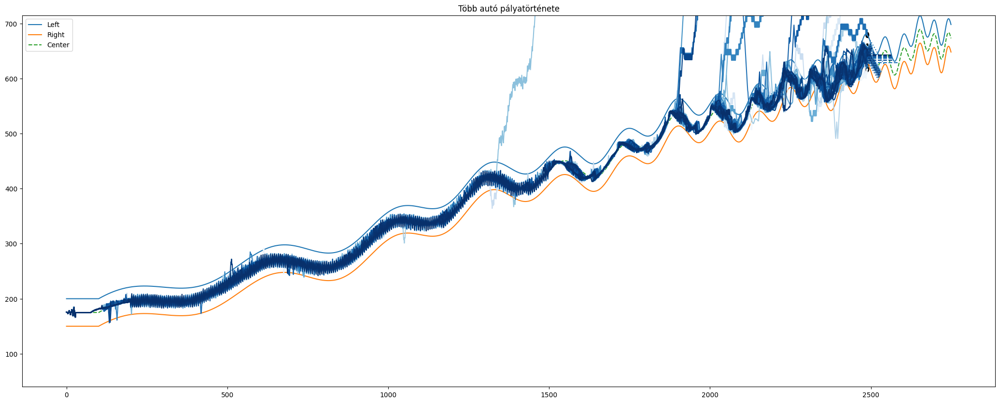

In [298]:
cars = [experiments[e]['auto'] for e in experiments]
plot_multiple_histories(cars, show_y_distance=False, legend=False)

cars_in_experiment['exp4'] = copy.deepcopy(cars)

# Save
with open('Experiments/cars_exp4.pkl', 'wb') as f:
    pickle.dump(cars, f)

# Load
with open('Experiments/cars_exp4.pkl', 'rb') as f:
    cars = pickle.load(f)


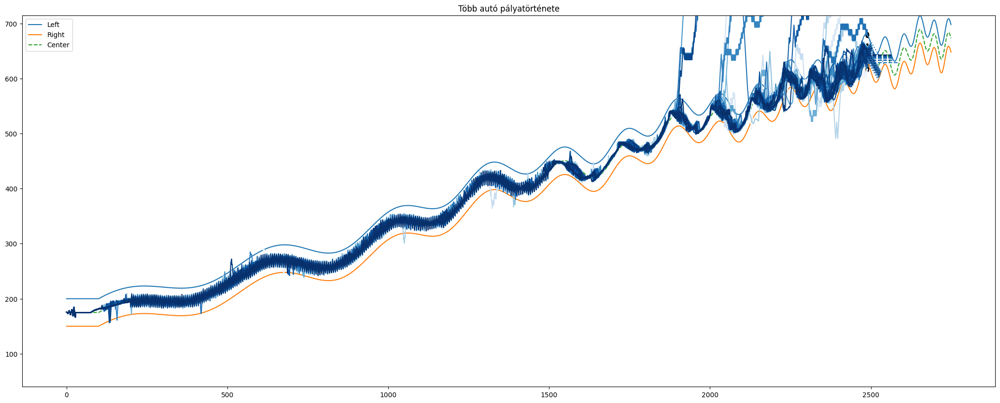

In [249]:
# cars = [experiments[e]['auto'] for e in experiments]
cars = [experiments[e]['auto'] for i, e in enumerate(experiments) if i not in para_futasok]
plot_multiple_histories(cars, show_y_distance=False, legend=False)


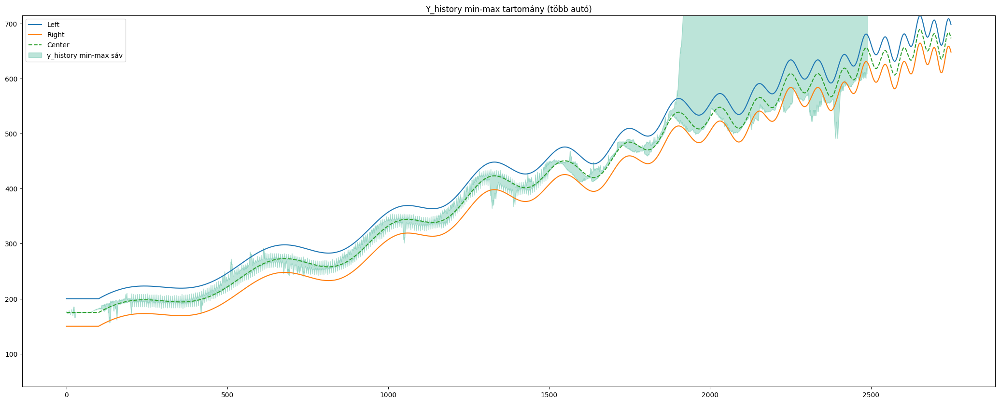

In [250]:
# cars = [experiments[e]['auto'] for e in experiments]
cars = [experiments[e]['auto'] for i, e in enumerate(experiments) if i not in para_futasok]
plot_multiple_histories_fill(cars, show_y_distance=False)


min_ien             2490
all_histories.shape (99, 2490)
y_mean.shape        (2490,)
y_std.shape         (2490,)


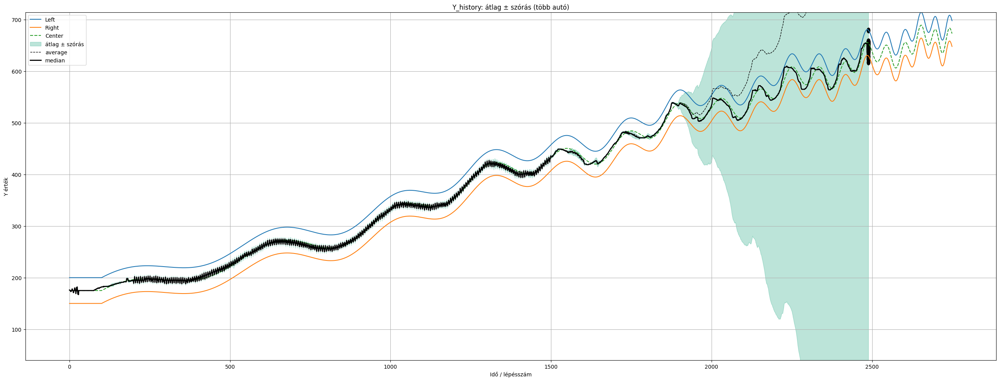

In [251]:
cars = [experiments[e]['auto'] for i, e in enumerate(experiments) if i not in para_futasok]
plot_multiple_histories_bolinger(cars, show_y_distance=False)


min_ien             2490
all_histories.shape (99, 2490)
y_mean.shape        (2490,)
y_std.shape         (2490,)


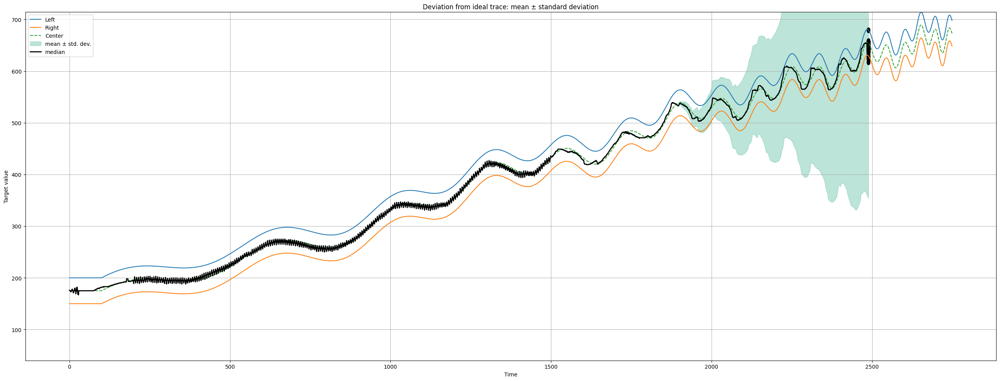

In [261]:
cars = [experiments[e]['auto'] for i, e in enumerate(experiments) if i not in para_futasok]
plot_multiple_histories_bolinger(cars, show_y_distance=False, std=0.3)


In [262]:
from datetime import datetime

_ = time.time()

readable_time = datetime.fromtimestamp(1753720979.6980512)
readable_time = datetime.fromtimestamp(_)
print(readable_time)

readable_utc = datetime.utcfromtimestamp(1753720979.6980512)
readable_utc = datetime.utcfromtimestamp(_)
print(readable_utc.strftime("%Y-%m-%d %H:%M:%S"))


2025-07-30 12:03:30.898179
2025-07-30 10:03:30


## Ez itt csak a dev verziója annak, hogyan kéne ábrázolnom az eredményeket.

In [263]:

_override_end = 1500

exp_4_cut_cum_err = []

for car in cars:
    # Teljes cummulativ hiba egy adott auto futása esetén
    err = np.cumsum(np.abs(car.y_distance))
    # print(f'cum sum err vége: {err[-1]:.2f}')
    
    # Csak a bemozgatás utáni rész és a vége közötti különgség érdekel.
    err = np.cumsum(np.abs(car.y_distance[_override_end:]))
    # print(f'cum sum err vége: {err[-1]:.2f}')

    exp_4_cut_cum_err.append(err)
    

avg = 70399.66
med = 6376.84
std = 243319.54
[   6207.5    6390.1    6093.2    5890.8    7365.3    6638.2    6759.8
    5939.7    6762.6    5340.4    6146.5    6242.1    7015.5    5405.1
    7067.4   53743.     5945.9    5759.7    5848.8 1009472.4    6783.4
    5797.     6417.2   68550.6    6333.     6617.4    6377.6    6680.8
    5542.7    6140.8    7283.2    5843.5    6304.8    5674.1   11631.4
    5783.6    6252.7    7050.    82692.     6361.9    5312.6    7029.7
    6376.8    6237.8    4736.8    5502.9    5618.8  872184.8    7572.
    6027.6    7222.5    6756.9    5583.7    6197.4    5892.8    5963.5
    5538.6    7222.8    5235.7    6518.5 1464322.6    6506.5    6402.6
    6168.2    6575.4    6501.4  405184.1  708030.8    8068.3    6505.3
    6685.9    6215.9    5830.8   56980.6    6539.1    5506.6    5544.8
    6569.5    7199.1  255500.     6362.5  154198.9    6453.8    5484.5
    6467.2    6123.5    6333.5    6175.2    6218.2    6644.4 1285346.7
    6789.1    6053.1    8580.8   

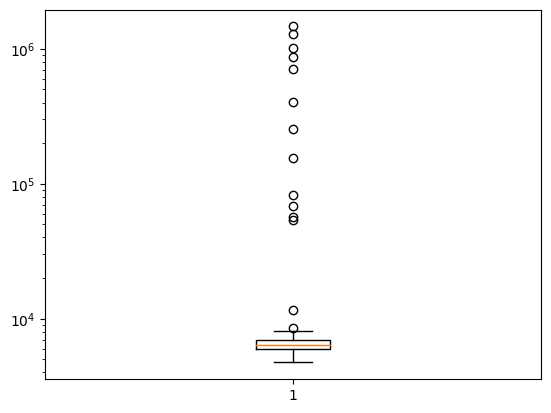

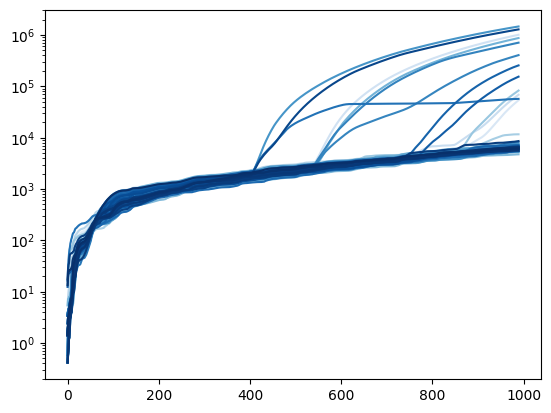

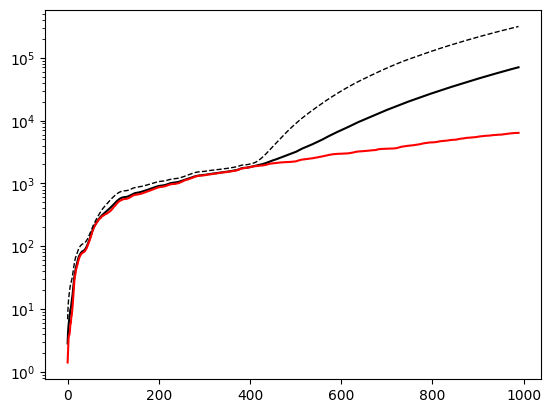

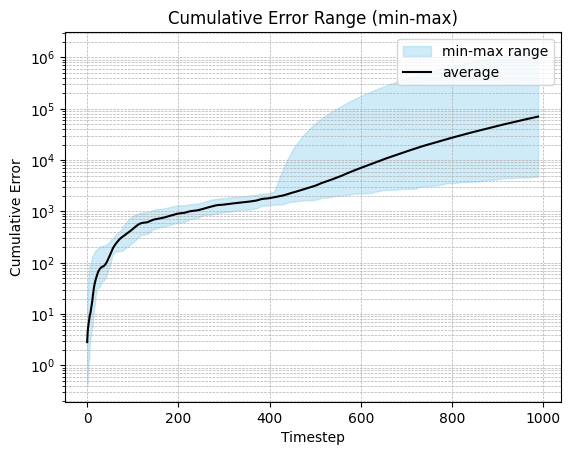

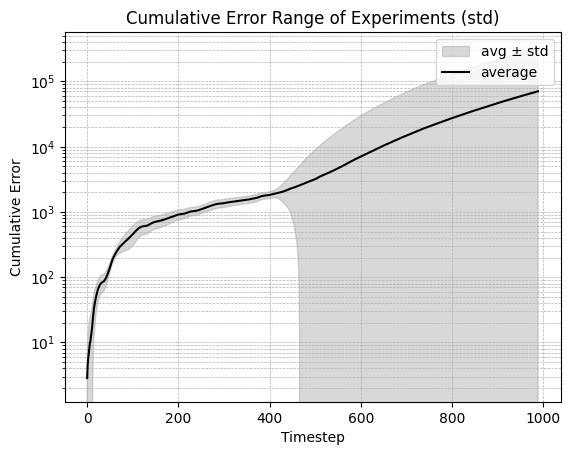

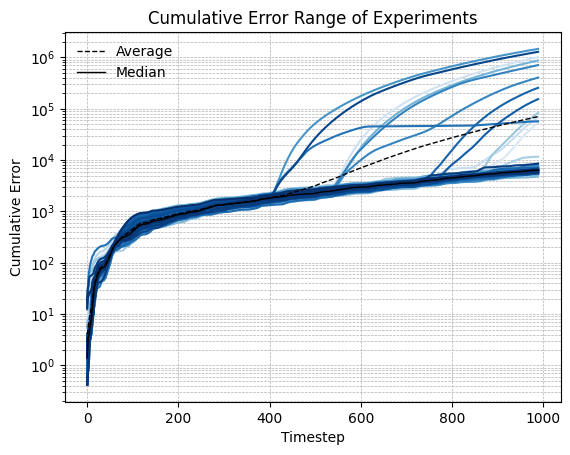

In [264]:

_override_end = 1500

exp_cut_cum_err = []
exp_cut_cum_err_final_value = []

for car in cars:
    # Teljes cummulativ hiba egy adott auto futása esetén
    err = np.cumsum(np.abs(car.y_distance))
    # print(f'cum sum err vége: {err[-1]:.2f}')
    
    # Csak a bemozgatás utáni rész és a vége közötti különgség érdekel.
    err = np.cumsum(np.abs(car.y_distance[_override_end:]))             # ez egy cumsum array nem peidig egy konkrét szám
    # print(f'cum sum err vége: {err[-1]:.2f}')

    exp_cut_cum_err.append(err)
    exp_cut_cum_err_final_value.append(err[-1])
    
# A cumulatív hibák listája
exp_cut_cum_err = np.array(exp_cut_cum_err)               # .shape -> (30, 990) (kisérletek száma, _override_end-től mért szakasz a végéig)

# A cumulativ hibák utolsó értékének listája
exp_cut_cum_err_final_value = np.array(exp_cut_cum_err_final_value)  # .shape -> (30,)

# A cumulatív hibák utolsó érékeinek mutatói
exp_4_cut_cum_err_avg = np.mean(exp_cut_cum_err_final_value)      # Az utolsó értékek (tehát a cummulatív számsor végén mért érték)
exp_4_cut_cum_err_med = np.median(exp_cut_cum_err_final_value)    # Az utolsó értékek (tehát a cummulatív számsor végén mért érték)
exp_4_cut_cum_err_std = np.std(exp_cut_cum_err_final_value)       # Az utolsó értékek (tehát a cummulatív számsor végén mért érték)

print(f'avg = {exp_4_cut_cum_err_avg:.2f}')
print(f'med = {exp_4_cut_cum_err_med:.2f}')
print(f'std = {exp_4_cut_cum_err_std:.2f}')



with np.printoptions(precision=1, suppress=True):
    print(exp_cut_cum_err_final_value)

with np.printoptions(precision=1, suppress=True):
    print(exp_cut_cum_err)


# Az utolsó értékekből képzett tömbből - 'exp_cut_cum_err_final_value' - érdemes lehet majd histogrammot, vagy boxplottot csinálni
_ = exp_cut_cum_err_final_value
# _ = np.log(_)
# plt.hist(_)
# plt.yscale('log') 
# plt.show()

_ = exp_cut_cum_err_final_value
# _ = np.log(_)
plt.boxplot(_)
plt.yscale('log')
plt.show()


# Lehet hogy érdemesebb lenne egyébnént a '_override_end' utáni szakaszok np.cumsum(np.abs()) görbéket egy ploton ábrázolni
cmap = cm.get_cmap('Blues', exp_cut_cum_err.shape[0]) # 'viridis', 'plasma', 'Blues', 'Purples'
plt.figure()
for i in range(exp_cut_cum_err.shape[0]):
    plt.plot(exp_cut_cum_err[i], color=cmap(i), label=f'{i}')
plt.yscale('log')
plt.show()


# Végül arra gondoltam, hogy ezekenek az '_override_end' utáni szakaszoknak a cummalatív hibáját is megcsinálnám átlagra és szórásra
# -- Egy ilyen plot azt ábrázolja, hogy az adott beállítás melett lefuttatott 30 darab experimentben hogyan alakultak a '_override_end'
#    utáni időpontokban a hibák.


exp_cut_cum_err_avg = np.mean(exp_cut_cum_err, axis=0)
exp_cut_cum_err_std = np.std(exp_cut_cum_err, axis=0)
exp_cut_cum_err_med = np.median(exp_cut_cum_err, axis=0)

plt.figure()
plt.plot(exp_cut_cum_err_avg, color='black', label='Mean')
plt.plot(exp_cut_cum_err_med, color='red', label='Median')
plt.plot(exp_cut_cum_err_avg + exp_cut_cum_err_std, ls='--',lw=1.0, c='black')
plt.yscale('log')
plt.show()

# Lehet hogy itt még valami area plotal lehetne próbálkozni ami azt mutatja meg hogy melyik volt a mamimum és a minimum az adott experimentben
exp_cut_cum_err_avg = np.mean(exp_cut_cum_err, axis=0)
exp_cut_cum_err_min = np.min(exp_cut_cum_err, axis=0)
exp_cut_cum_err_max = np.max(exp_cut_cum_err, axis=0)

plt.figure()
x = np.arange(exp_cut_cum_err.shape[1])  # időlépések
plt.fill_between(x, exp_cut_cum_err_min, exp_cut_cum_err_max, color='skyblue', alpha=0.4, label='min-max range')
plt.plot(x, exp_cut_cum_err_avg, color='black', label='average')
plt.yscale('log')
plt.legend()
plt.title('Cumulative Error Range (min-max)')
plt.xlabel('Timestep')
plt.ylabel('Cumulative Error')
plt.grid(True, which='both', ls='--', lw=0.5)
plt.show()

# Ugyan ez csak az átlag és szórásra kiszámolva
plt.figure()
x = np.arange(exp_cut_cum_err.shape[1])  # időlépések
plt.fill_between(x, exp_cut_cum_err_avg - exp_cut_cum_err_std, exp_cut_cum_err_avg + exp_cut_cum_err_std, 
                 color='gray', alpha=0.3, label='avg ± std')
plt.plot(x, exp_cut_cum_err_avg, color='black', label='average')
plt.yscale('log')
plt.legend()
plt.title('Cumulative Error Range of Experiments (std)')
plt.xlabel('Timestep')
plt.ylabel('Cumulative Error')
plt.grid(True, which='both', ls='--', lw=0.5)
plt.show()


# Ez a blue amin minden mérés rajta van és még ráteszem az Átlagot, a Min-Max értéket és a Mediánt
cmap = cm.get_cmap('Blues', exp_cut_cum_err.shape[0]) # 'viridis', 'plasma', 'Blues', 'Purples'
plt.figure()
for i in range(exp_cut_cum_err.shape[0]):
    # plt.plot(exp_cut_cum_err[i], color=cmap(i), label=f'{i}')
    plt.plot(exp_cut_cum_err[i], color=cmap(i))
plt.plot(x, exp_cut_cum_err_avg, color='black', lw=1.0, ls='--', label='Average')
plt.plot(x, exp_cut_cum_err_med, color='black', lw=1.0, label='Median')
plt.yscale('log')
plt.title('Cumulative Error Range of Experiments')
plt.xlabel('Timestep')
plt.ylabel('Cumulative Error')
# plt.grid(True, which='major', ls='--', lw=0.5)
plt.grid(True, which='both', ls='--', lw=0.5)
plt.legend(frameon=False)
plt.show()


In [265]:
# Ez lesz a végső változat amivel tesztelem a méréseket

[   6207.5    6390.1    6093.2    5890.8    7365.3    6638.2    6759.8
    5939.7    6762.6    5340.4    6146.5    6242.1    7015.5    5405.1
    7067.4   53743.     5945.9    5759.7    5848.8 1009472.4    6783.4
    5797.     6417.2   68550.6    6333.     6617.4    6377.6    6680.8
    5542.7    6140.8    7283.2    5843.5    6304.8    5674.1   11631.4
    5783.6    6252.7    7050.    82692.     6361.9    5312.6    7029.7
    6376.8    6237.8    4736.8    5502.9    5618.8  872184.8    7572.
    6027.6    7222.5    6756.9    5583.7    6197.4    5892.8    5963.5
    5538.6    7222.8    5235.7    6518.5 1464322.6    6506.5    6402.6
    6168.2    6575.4    6501.4  405184.1  708030.8    8068.3    6505.3
    6685.9    6215.9    5830.8   56980.6    6539.1    5506.6    5544.8
    6569.5    7199.1  255500.     6362.5  154198.9    6453.8    5484.5
    6467.2    6123.5    6333.5    6175.2    6218.2    6644.4 1285346.7
    6789.1    6053.1    8580.8    6357.3    6026.8    5612.6    6515.1
    610

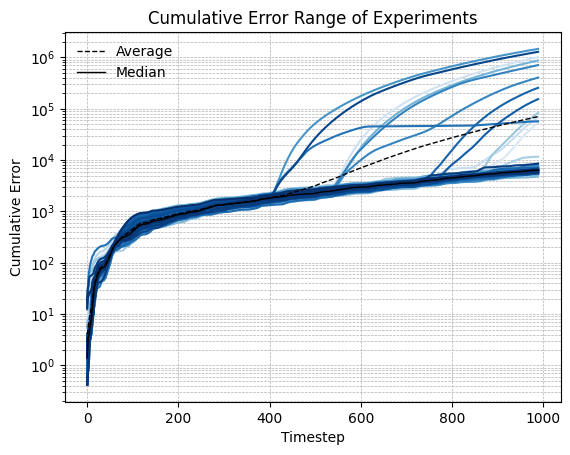

------------------------------------
Végeredményben ez a meghatáró mérés 
------------------------------------
Cumulatív hibák átlagának vége      
------------------------------------
avg = 70399.66
med = 6376.84
std = 243319.54


In [266]:

_override_end = 1500

exp_cut_cum_err = []
exp_cut_cum_err_final_value = []

# Végig megyek a kisérletben szereplő car elemeken hogy kinyerjem belőlük a futás során mért hibákat
for car in cars:
    # Teljes cummulativ hiba egy adott auto futása esetén
    err = np.cumsum(np.abs(car.y_distance))
    # print(f'cum sum err vége: {err[-1]:.2f}')
    
    # Csak a bemozgatás utáni rész és a vége közötti különgség érdekel.
    err = np.cumsum(np.abs(car.y_distance[_override_end:]))             # ez egy cumsum array nem peidig egy konkrét szám
    # print(f'cum sum err vége: {err[-1]:.2f}')

    exp_cut_cum_err.append(err)
    exp_cut_cum_err_final_value.append(err[-1])
    
# A cumulatív hibák listája
exp_cut_cum_err = np.array(exp_cut_cum_err)               # .shape -> (30, 990) (kisérletek száma, _override_end-től mért szakasz a végéig)

# A cumulativ hibák utolsó értékének listája
exp_cut_cum_err_final_value = np.array(exp_cut_cum_err_final_value)  # .shape -> (30,)

with np.printoptions(precision=1, suppress=True):
    print(exp_cut_cum_err_final_value)

with np.printoptions(precision=1, suppress=True):
    print(exp_cut_cum_err)

# -----------------------------------------------

# Lehet hogy itt még valami area plotal lehetne próbálkozni ami azt mutatja meg hogy melyik volt a mamimum és a minimum az adott experimentben
exp_cut_cum_err_avg = np.mean(exp_cut_cum_err, axis=0)
exp_cut_cum_err_min = np.min(exp_cut_cum_err, axis=0)
exp_cut_cum_err_max = np.max(exp_cut_cum_err, axis=0)
exp_cut_cum_err_std = np.std(exp_cut_cum_err, axis=0)
exp_cut_cum_err_med = np.median(exp_cut_cum_err, axis=0)

x = np.arange(exp_cut_cum_err.shape[1])  # időlépések

# Ez a blue amin minden mérés rajta van és még ráteszem az Átlagot, a Min-Max értéket és a Mediánt
cmap = cm.get_cmap('Blues', exp_cut_cum_err.shape[0]) # 'viridis', 'plasma', 'Blues', 'Purples'
plt.figure()
for i in range(exp_cut_cum_err.shape[0]):
    # plt.plot(exp_cut_cum_err[i], color=cmap(i), label=f'{i}')
    plt.plot(exp_cut_cum_err[i], color=cmap(i))
plt.plot(x, exp_cut_cum_err_avg, color='black', lw=1.0, ls='--', label='Average')
plt.plot(x, exp_cut_cum_err_med, color='black', lw=1.0, label='Median')
plt.yscale('log')
plt.title('Cumulative Error Range of Experiments')
plt.xlabel('Timestep')
plt.ylabel('Cumulative Error')
# plt.grid(True, which='major', ls='--', lw=0.5)
plt.grid(True, which='both', ls='--', lw=0.5)
plt.legend(frameon=False)
plt.show()

print('------------------------------------')
print('Végeredményben ez a meghatáró mérés ')
print('------------------------------------')
print('Cumulatív hibák átlagának vége      ')
print('------------------------------------')

print(f'avg = {exp_cut_cum_err_avg[-1]:.2f}')
print(f'med = {exp_cut_cum_err_med[-1]:.2f}')
print(f'std = {exp_cut_cum_err_std[-1]:.2f}')


exp4 = {}
exp4['exp_cut_cum_err'] = copy.deepcopy(exp_cut_cum_err)
exp4['exp_cut_cum_err_avg'] = copy.deepcopy(exp_cut_cum_err_avg)
exp4['exp_cut_cum_err_min'] = copy.deepcopy(exp_cut_cum_err_min)
exp4['exp_cut_cum_err_max'] = copy.deepcopy(exp_cut_cum_err_max)
exp4['exp_cut_cum_err_std'] = copy.deepcopy(exp_cut_cum_err_std)
exp4['exp_cut_cum_err_med'] = copy.deepcopy(exp_cut_cum_err_med)
exp4['last_exp_cut_cum_err_avg'] = copy.deepcopy(exp_cut_cum_err_avg[-1])
exp4['last_exp_cut_cum_err_med'] = copy.deepcopy(exp_cut_cum_err_med[-1])
exp4['last_exp_cut_cum_err_std'] = copy.deepcopy(exp_cut_cum_err_std[-1])


In [268]:
# Save
with open('Experiments/exp4.pkl', 'wb') as f:
    pickle.dump(exp4, f)

# Load
with open('Experiments/exp4.pkl', 'rb') as f:
    exp4 = pickle.load(f)


In [132]:
Még meg kell írnom a 4 betöltését és utána meg lesz a négy változó ami alapján meg tudom csinálni a 4 plotot.


SyntaxError: invalid syntax (1882220908.py, line 1)

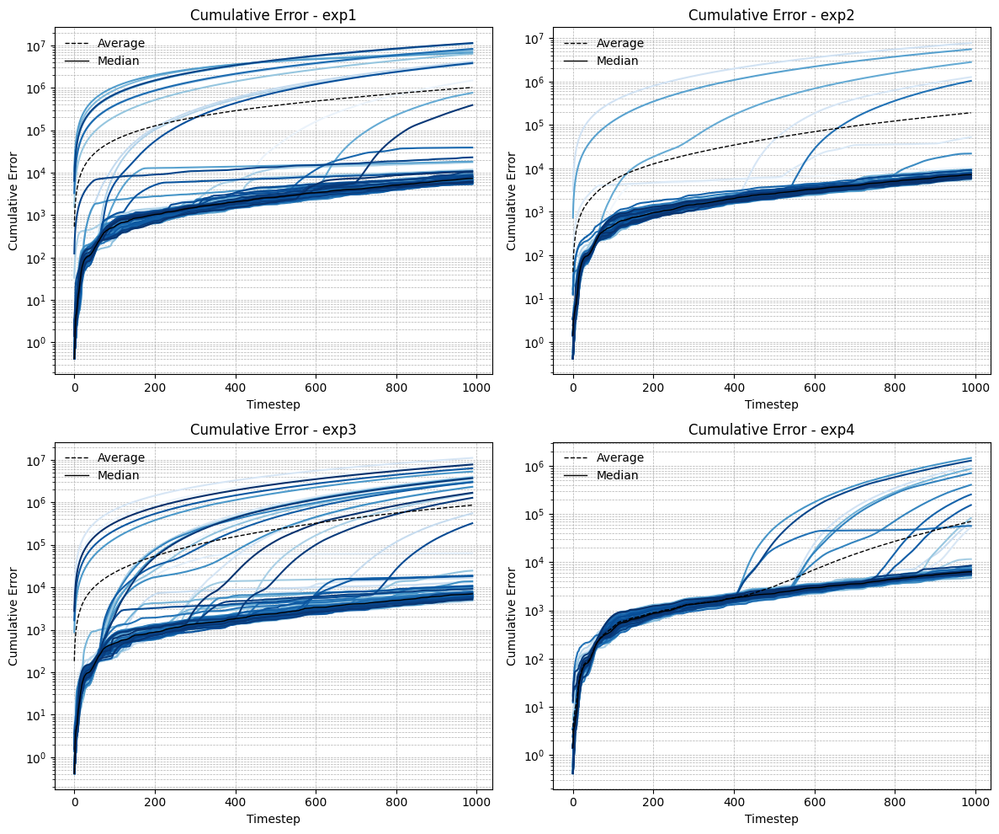

In [271]:
experiments = {
    'exp1': exp1,
    'exp2': exp2,
    'exp3': exp3,
    'exp4': exp4,
}

fig, axes = plt.subplots(2, 2, figsize=(12, 10))  # 2x2 plot

for ax, (key, exp) in zip(axes.flat, experiments.items()):
    cmap = cm.get_cmap('Blues', exp['exp_cut_cum_err'].shape[0])
    for i in range(exp['exp_cut_cum_err'].shape[0]):
        ax.plot(exp['exp_cut_cum_err'][i], color=cmap(i))
    ax.plot(x, exp['exp_cut_cum_err_avg'], color='black', lw=1.0, ls='--', label='Average')
    ax.plot(x, exp['exp_cut_cum_err_med'], color='black', lw=1.0, label='Median')
    ax.set_yscale('log')
    ax.set_title(f'Cumulative Error - {key}')
    ax.set_xlabel('Timestep')
    ax.set_ylabel('Cumulative Error')
    ax.grid(True, which='both', ls='--', lw=0.5)
    ax.legend(frameon=False)

plt.tight_layout()
plt.show()


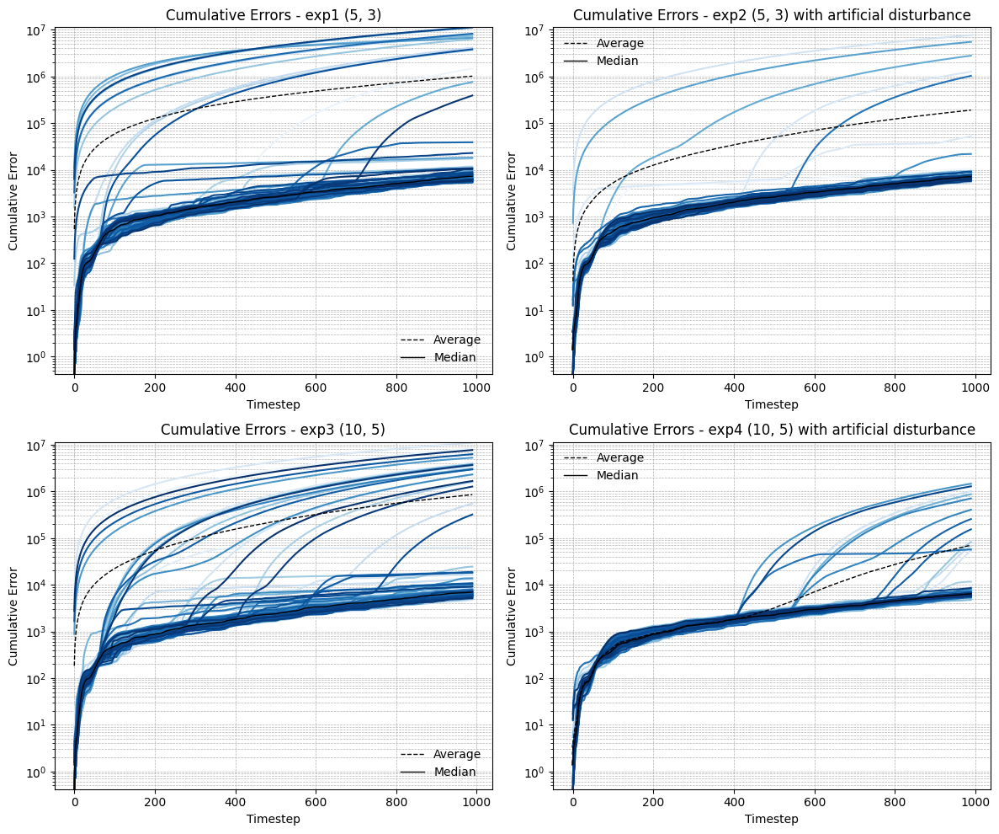

In [276]:
experiments = {
    'exp1 (5, 3)': exp1,
    'exp2 (5, 3) with artificial disturbance': exp2,
    'exp3 (10, 5)': exp3,
    'exp4 (10, 5) with artificial disturbance': exp4,
}

# --- 1. Globális y-min és y-max meghatározása ---
y_min = float('inf')
y_max = float('-inf')

for exp in experiments.values():
    data = exp['exp_cut_cum_err']
    y_min = min(y_min, np.min(data))
    y_max = max(y_max, np.max(data))

# --- 2. Plotolás ---
fig, axes = plt.subplots(2, 2, figsize=(12, 10))

for ax, (key, exp) in zip(axes.flat, experiments.items()):
    cmap = cm.get_cmap('Blues', exp['exp_cut_cum_err'].shape[0])
    for i in range(exp['exp_cut_cum_err'].shape[0]):
        ax.plot(exp['exp_cut_cum_err'][i], color=cmap(i))
    ax.plot(x, exp['exp_cut_cum_err_avg'], color='black', lw=1.0, ls='--', label='Average')
    ax.plot(x, exp['exp_cut_cum_err_med'], color='black', lw=1.0, label='Median')

    ax.set_yscale('log')
    ax.set_ylim([y_min, y_max])  # Azonos Y-tartomány
    ax.set_title(f'Cumulative Errors - {key}')
    ax.set_xlabel('Timestep')
    ax.set_ylabel('Cumulative Error')
    ax.grid(True, which='both', ls='--', lw=0.5)
    ax.legend(frameon=False)

plt.tight_layout()

plt.savefig('Results/Figure_4x4_300dpi.png', dpi=300, format='png')

plt.show()


In [277]:
# bbbbbbbbbbbbbbbbbbbbb

In [305]:
# Meg kell találnom azt az egyet ami elmegy, de ezt most már automatizálnom kell mert túl sok futás van.

_threshold = 20_000

_ids = []
for i, c in enumerate(cars):
    _ = c.y_distance
    _ = np.array(_)
    _ = np.abs(_)
    _ = np.cumsum(_)
    _ = _[-1]
    # print(f'{_:.1f}')
    if _ > _threshold:
        print(f'{i} : {_:.0f}')
        _ids.append(i)

print(len(_ids))

15 : 59150
19 : 1014769
23 : 74790
38 : 88338
41 : 5290824
48 : 878395
61 : 1469719
67 : 410184
68 : 713347
74 : 62404
80 : 261347
82 : 159469
91 : 1290950
13


In [299]:
len(cars_in_experiment['exp1'])

100

In [300]:
len(cars_in_experiment['exp2'])

100

In [301]:
len(cars_in_experiment)

4

In [312]:
_threshold = 20_000

for j, e, in enumerate(cars_in_experiment):

    print('---------')
    print(e)
    print('---------')
    _ids = []
    for i, c in enumerate(cars_in_experiment[e]):
        _ = c.y_distance
        _ = np.array(_)
        _ = np.abs(_)
        _ = np.cumsum(_)
        _ = _[-1]
        # print(f'{_:.1f}')
        if _ > _threshold:
            print(f'{i} : {_:.0f}')
            _ids.append(i)

    print(len(_ids))

---------
exp1
---------
6 : 1493322
8 : 8929972
20 : 8414459
22 : 28519
24 : 13348403
25 : 4158681
27 : 8663059
31 : 3694012
33 : 29294
39 : 6457918
45 : 11084069
48 : 13006794
51 : 766603
55 : 21607
57 : 13936226
77 : 8791702
78 : 42872
87 : 3842238
91 : 56663
92 : 13417033
96 : 394820
21
---------
exp2
---------
14 : 75276
16 : 1272987
19 : 8392684
51 : 2802757
55 : 5577754
64 : 27271
74 : 1040941
79 : 38805
8
---------
exp3
---------
1 : 8865099
4 : 3492653
5 : 8884488
11 : 66368
15 : 4073127
16 : 12868073
17 : 2281304
24 : 551222
33 : 1607080
34 : 3598348
36 : 22049
39 : 28440
40 : 3125249
57 : 3851415
59 : 5326740
63 : 2311268
68 : 2990392
81 : 22814
82 : 2972111
83 : 21225
84 : 6434183
89 : 324272
95 : 1274769
96 : 3694601
98 : 1677207
99 : 8100043
26
---------
exp4
---------
15 : 59150
19 : 1014769
23 : 74790
38 : 88338
41 : 5290824
48 : 878395
61 : 1469719
67 : 410184
68 : 713347
74 : 62404
80 : 261347
82 : 159469
91 : 1290950
13


In [ ]:
cccccccccccccccc

In [313]:
# rájöttem, hogy van egy ilyen plot és ami egy experimentet ábrázol - de meg kell csinálni úgy hogy egy ábrán
# legyen rajta mind a kettő (10, 5) perturbáicóval és anélkül

min_ien             2490
all_histories.shape (100, 2490)
y_mean.shape        (2490,)
y_std.shape         (2490,)


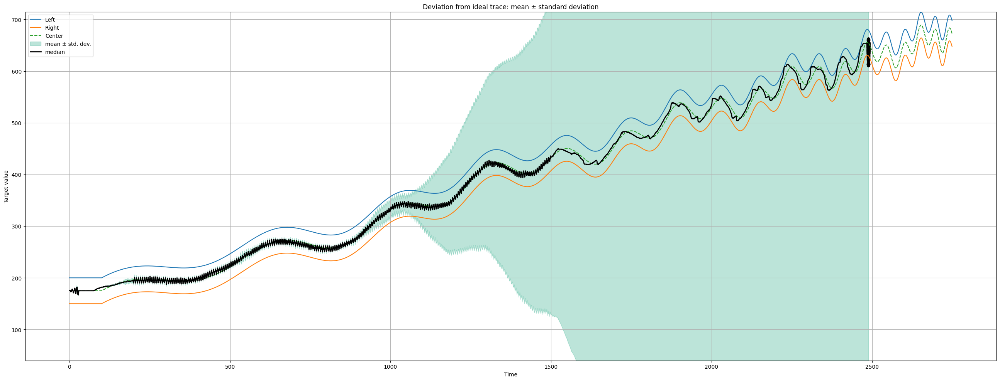

min_ien             2490
all_histories.shape (100, 2490)
y_mean.shape        (2490,)
y_std.shape         (2490,)


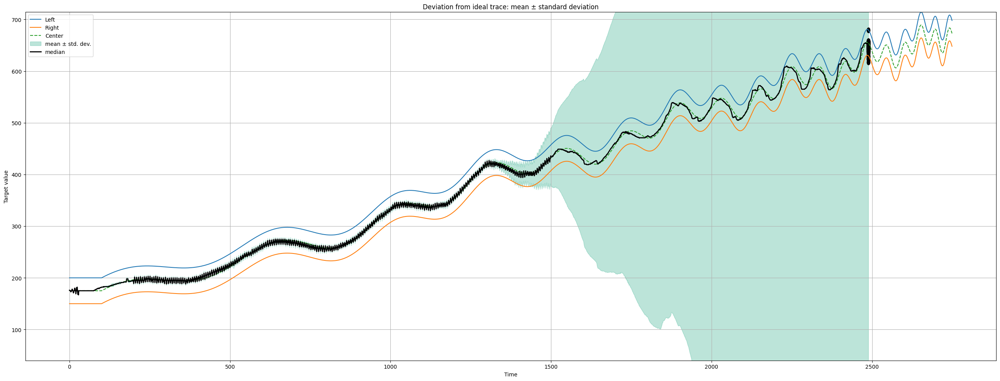

In [320]:
plot_multiple_histories_bolinger(cars_in_experiment['exp2'], show_y_distance=False)
plot_multiple_histories_bolinger(cars_in_experiment['exp4'], show_y_distance=False)

In [360]:
def plot_multiple_histories_bolinger_2(cars_1, cars_2, show_y_distance=False, dpi=80, std=1.0):

    fig, ax = cars_1[0].road.show()

    # Colormap és szín az árnyékoláshoz
    cmap = plt.get_cmap('viridis')
    fill_color_1 = cmap(0.6)
    fill_color_2 = cmap(0.3)
    
    fill_alpha = 0.3

    # y_history gyűjtése
    histories_1 = [car.y_history for car in cars_1 if hasattr(car, 'y_history') and len(car.y_history) > 0]
    histories_2 = [car.y_history for car in cars_2 if hasattr(car, 'y_history') and len(car.y_history) > 0]
    


    # Az összes history-t azonos hosszra hozzuk (vágás)
    min_len = min(len(h) for h in histories_1)
    trimmed_histories_1 = [h[:min_len] for h in histories_1]
    trimmed_histories_2 = [h[:min_len] for h in histories_2]
    
    all_histories_1 = np.array(trimmed_histories_1)
    all_histories_2 = np.array(trimmed_histories_2)
    
    
    print('min_ien            ', min_len)
    print('all_histories_1.shape', all_histories_1.shape)
    print('all_histories_2.shape', all_histories_2.shape)
    

    # Statisztika
    y_mean_1   = np.mean(all_histories_1, axis=0)
    y_mean_2   = np.mean(all_histories_2, axis=0)
    
    y_median_1 = np.median(all_histories_1, axis=0)
    y_median_2 = np.median(all_histories_2, axis=0)
    
    y_std_1    = np.std(all_histories_1, axis=0)
    y_std_2    = np.std(all_histories_2, axis=0)
    
    y_upper_1  = y_median_1 + (y_std_1 * std)
    y_upper_2  = y_median_2 + (y_std_2 * std)
    
    y_lower_1  = y_median_1 - (y_std_1 * std)
    y_lower_2  = y_median_2 - (y_std_2 * std)
    
    x          = np.arange(min_len)
    
    print('y_mean_1.shape       ', y_mean_1.shape)
    print('y_mean_2.shape       ', y_mean_2.shape)
    
    print('y_std_1.shape        ', y_std_1.shape)
    print('y_std_2.shape        ', y_std_2.shape)
    

    # Kitöltés: átlag ± szórás
    ax.fill_between(x, y_lower_1, y_upper_1, color=fill_color_1, alpha=fill_alpha, label='Epx. 1. mean ± std. dev.')
    
    ax.fill_between(x, y_lower_2, y_upper_2, color=fill_color_2, alpha=fill_alpha, label='Exp. 2. mean ± std. dev.')
    

    # Átlag vonal megjelenítése
    # ax.plot(x, y_mean_1, color='black', label='Exp. 1. average', linewidth=1, ls='--')
    # ax.plot(x, y_mean_2, color='black', label='Exp. 2. average', linewidth=1, ls='--')
    
    
    # Medián vonal megjelenítése
    ax.plot(x, y_median_1, color='black', label='Exp. 1. median', linewidth=2)
    ax.plot(x, y_median_2, color='black', label='Exp. 2. median', linewidth=2)
    

    # Opcionális: autók pozíciójának megjelenítése
    for car in cars_1:
        circle = plt.Circle((car.x, car.y), 5, color='black')
        ax.add_patch(circle)
        # ax.plot(car.y_history)
        
    for car in cars_2:
        circle = plt.Circle((car.x, car.y), 5, color='black')
        ax.add_patch(circle)
        # ax.plot(car.y_history)

    ax.legend(frameon=False)
    plt.title("Deviation from ideal trace: mean ± standard deviation")
    plt.xlabel("Time")
    plt.ylabel("Target value")
    plt.grid(True)
    plt.savefig('Results/Figure_2x1.png', format='png', dpi=dpi)
    # plt.tight_layout()
    plt.show()

min_ien             2490
all_histories_1.shape (100, 2490)
all_histories_2.shape (100, 2490)
y_mean_1.shape        (2490,)
y_mean_2.shape        (2490,)
y_std_1.shape         (2490,)
y_std_2.shape         (2490,)


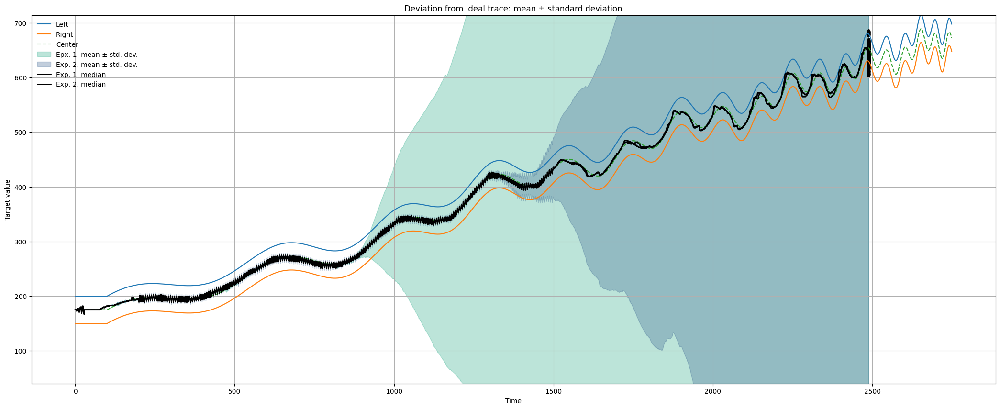

In [361]:
plot_multiple_histories_bolinger_2(cars_in_experiment['exp3'],
                                   cars_in_experiment['exp4'],
                                   show_y_distance=False,
                                   dpi=300)

In [362]:
new_list = cars_in_experiment['exp4'][:40] + cars_in_experiment['exp4'][43:]


min_ien             2490
all_histories_1.shape (100, 2490)
all_histories_2.shape (97, 2490)
y_mean_1.shape        (2490,)
y_mean_2.shape        (2490,)
y_std_1.shape         (2490,)
y_std_2.shape         (2490,)


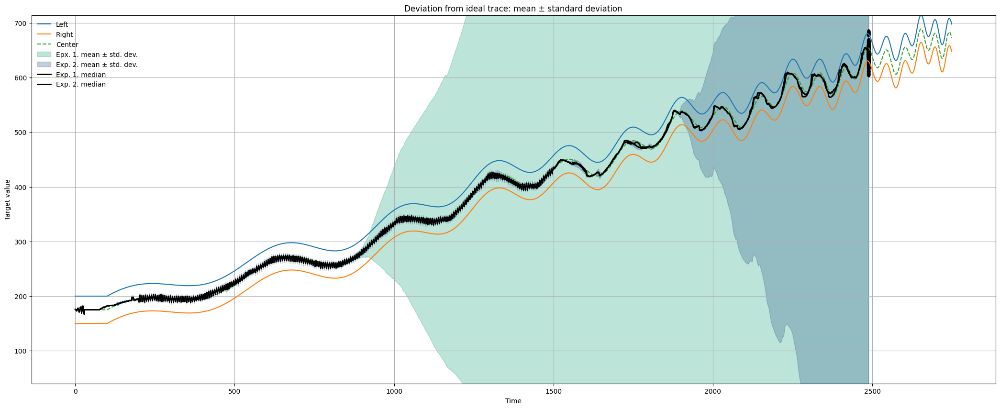

In [363]:
plot_multiple_histories_bolinger_2(cars_in_experiment['exp3'],
                                   new_list,
                                   show_y_distance=False)

# Font a 4 féle mérés összehasonlítása:

    Ide kéne most az, hogy azt a négy plottot ami kijött azt kéne ábrázolnom egymás mellett valahogy
    
    Ehez elöbb az eredményeket valahogy egységesen el kéne tárolonom változókban
    
    Monddjuk minden plotálás végén elmenteni őket egy egy új változóba, amit itt meghivatkozhatok
    
    Csinálni egy 2x2 plott esetleg akár úgy is, hogy azonos skálán vannak az y'tengelyek'
    
    
# Todo:

    Viszont elötte még azt meg kell csinálni hogy a (2.) mérésnél a rezgetés nem 1200-1500 között legyen mert az nem elég jó,
    hanem legyen ugyan úgy mint a (4.) mérésnél 200-1500 köztött.
    
# Result:

    Az biztos és ez már most jó, hogy a (4.) mérés a (3.) hoz képest ahol nem volt rezgetés biztos, hogy sokkal stabilabb és sokkal kevesebbszer
    futott ki a keretből mint, amikor nem volt mesterséges mozgatás (3.)
    


In [ ]:
# Elvileg már csak egy dolgot kell kiszámolnom minden expmerimenthezt.

#   -- Mind a 4 esetében elkészíteni azt a hiba kiszámolási módszeert ami akár volt, akár nem volt mesterséges mozgatás
#      csak azt a részt veszi figyelembe a hiba kiszámolásánál ami mozgatás utáni időponttól történik.



# Fontos:

#  Az experiment 3-4 esetében inkább az a kéréds, hogy a mozgatás nélküli változatban (3.) mennyivel több lesz az ami elszál és instabill lesz,
# azért mert érzékeny, vagy nagy a háló, ahhoz képest mint amikor érzékeny, vagy nagy a háló de van mozgatás (4.)


#  Az experiment 1-2 esetében viszint azt akarom megmutatni hogy a mozgatás alapvetően nem javít a háló teljesítményén ha eleve stabil volt.


# ------------------------

# Ehhez képest lesz majd az egy nagy és érdekes kérdés egy követkeező cikkben amihez ez a felépített Notebook már jó alapot nyújt, hogy:

# Ha egyszerre több neurális hálót tanítanék - mondjuk kezdetben csak kettőt, úgy mint most - és minden lépésben annak a becslését választanám,
# amelyik valamilyen kritérium alapján jobb becslést mond a múltbeli értékeken akkor az jobb lenne-e mint akár csak egyik, vagy csak másik
# alapján meghozott döntés.

# A hipotézis az, hogy igen, és ezt már számos tanulmány is alátámasztotta és használják is ezt a megközelítést. A kérdés most egyelőre még csak
# az, hogy találok-e ilyen idősort, elő tudok-e állítani ilyen és hogy nézne ki egyáltalán az az idősor amelyen ez a felétel teljesülne.

# Ez a változó - vagyis sürüsödő periodusú - időosor egy ilyen jeleölt lehet.
# De ehhez lehet és ezt még nem tudom, hogy részben vagy egészben kell olyan szakasz amin eleve tudom, hogy a nagy felbontású háló rosszul
# teljesít és a kicsi háló jól és fordítva, van olyan szakasz amelyen a kicsi teljesít nem elég jól és a nagy felbontású jobban.
